In [1]:
%load_ext autoreload
%autoreload 2

from glob import glob
import matplotlib.pyplot as plt 
import os
import pandas as pd

from mocca.user_interaction.campaign import HplcDadCampaign
from mocca.campaign.process_funcs import process_compound_experiments
from mocca.user_interaction.settings import Settings
from mocca.user_interaction.user_objects import HplcInput
from mocca.user_interaction.user_objects import Compound
from mocca.user_interaction.user_objects import InternalStandard
from mocca.user_interaction.user_objects import Gradient

from mocca.dad_data.models import CompoundData, GradientData

from mocca.peak.models import CorrectedPeak
from mocca.decomposition.parafac_funcs import parafac
from mocca.peak.resolve_impure import get_parafac_peaks

from mocca.report.hplc_input import report_hplc_input
from mocca.report.peaks import report_peaks
from mocca.report.quali_comps import report_quali_comps
from mocca.report.quant_comps import report_quant_comps
from mocca.report.gradient import report_gradient
from mocca.report.chroms import report_chroms
from mocca.report.parafac import report_parafac
from mocca.report.results import report_runs

In [ ]:
report_path = r"/Users/haascp/Desktop/test_report"
report_hplc_input(campaign.hplc_runs, report_path)
report_peaks(campaign.peak_db, report_path)
report_quali_comps(campaign.quali_comp_db, report_path)
report_quant_comps(campaign.quant_comp_db, report_path)
#report_gradient(campaign.gradient, report_path)
report_chroms(campaign.chroms, campaign.settings, report_path)
report_parafac(campaign.chroms, report_path)
report_runs(campaign.chroms, campaign.quali_comp_db, campaign.quant_comp_db, report_path)

In [ ]:
report_path = r"/Users/haascp/Desktop/test_report"
report_experiments(campaign.experiments, report_path)

In [101]:
campaign.chroms

In [102]:
# get the folders matching flag in directory
flag = '.txt'

###
# Add the path to the provided data folder
test_data_path = '/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data' # directory of test data
###

folders = glob(test_data_path + '/*' + flag + '*') #find all matching flag
folders = sorted(folders, key=lambda x: int(x.split('_')[-1][:-4]))

In [103]:
istd_folder = [folder for folder in folders if folder.split('_')[-1][:-4] == '96']

#product_indices =['92', '93', '94', '95']
product_indices =['92', '93']
product_folders = [folder for folder in folders if folder.split('_')[-1][:-4] in product_indices]

#substrate_indices =['88', '89', '90', '91']
substrate_indices =['88', '89']
substrate_folders = [folder for folder in folders if folder.split('_')[-1][:-4] in substrate_indices]

# obviously, we used a blank injection as the gradient run
gradient_folder = [folder for folder in folders if folder.split('_')[-1][:-4] == '97']

In [104]:
# remove some data which was gathered due to repeated start of the campaigns
bad_indices =['0', '1', '2', '3', '92', '93', '94', '95', '88', '89', '90', '91']
bad_folders = [folder for folder in folders if folder.split('_')[-1][:-4] in bad_indices]

cnsource_indices =['98', '99']
cnsource_folders = [folder for folder in folders if folder.split('_')[-1][:-4] in cnsource_indices]

remove_folders = bad_folders + istd_folder + product_folders + substrate_folders + gradient_folder + cnsource_folders

reaction_folders = [folder for folder in folders if folder not in remove_folders]

In [105]:
reaction_folders

['/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_4.txt',
 '/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_5.txt',
 '/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_6.txt',
 '/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_7.txt',
 '/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_8.txt',
 '/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_9.txt',
 '/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_10.txt',
 '/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample

In [106]:
gradient = Gradient(gradient_folder[0])

In [107]:
campaign = HplcDadCampaign()

In [108]:
#ArCl_concs = [0.0603, 0.04422, 0.03015, 0.01407]
#ArCN_concs = [0.05955, 0.04367, 0.029775, 0.013895]
ArCl_concs = [0.0603, 0.04422]
ArCN_concs = [0.05955, 0.04367]
istd_conc = 0.06094

In [109]:
istd_experiment = HplcInput(istd_folder[0], gradient, compound=Compound('tetralin', is_istd=True))

In [110]:
internal_standard = InternalStandard('tetralin', istd_conc)

In [111]:
substrate_runs = []
for i, conc in enumerate(ArCl_concs):
    folder = substrate_folders[i]
    compound = Compound('2-chlorotoluene', conc)
    exp = HplcInput(folder, gradient, compound=compound, istd=internal_standard)
    substrate_runs.append(exp)

In [112]:
product_runs = []
for i, conc in enumerate(ArCN_concs):
    folder = product_folders[i]
    compound = Compound('o-tolunitrile', conc)
    exp = HplcInput(folder, gradient, compound=compound, istd=internal_standard)
    product_runs.append(exp)

In [113]:
parafac_dev_folder = reaction_folders[78]
parafac_debug_folder = reaction_folders[70]
parafac_impure_istd = reaction_folders[35]

In [114]:
parafac_dev_folder

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_82.txt'

In [115]:
#reaction_runs = [HplcInput(folder, gradient, istd=internal_standard) for folder in reaction_folders]
reaction_runs = [HplcInput(parafac_dev_folder, gradient, istd=internal_standard)]
#reaction_runs = [HplcInput(parafac_debug_folder, gradient, istd=internal_standard)]
#reaction_runs = [HplcInput(parafac_impure_istd, gradient, istd=internal_standard)]

In [116]:
campaign.add_hplc_input(istd_experiment)
for exp in substrate_runs:
    campaign.add_hplc_input(exp)
for exp in product_runs:
    campaign.add_hplc_input(exp)
for exp in reaction_runs:
    campaign.add_hplc_input(exp)

In [117]:
settings = Settings('labsolutions',
                    absorbance_threshold = 300, wl_high_pass = 215, 
                    peaks_high_pass = 1, peaks_low_pass = 5,
                    spectrum_correl_thresh=0.99, relative_distance_thresh=0.01)

----- new PARAFAC decomposition with iteration offset -3 -----
new data tensor with boundaries (1281, 1393) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1393).
Compound used for PARAFAC data tensor: 2-chlorotoluene


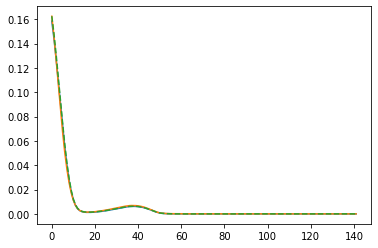

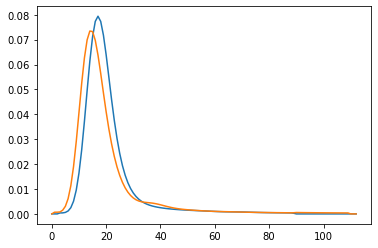

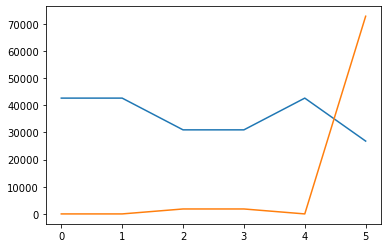

integral_array = [[42635.74550082     0.        ]
 [42635.74550082     0.        ]
 [30950.85134542  1821.33812975]
 [30950.85134542  1821.33812975]
 [42635.74550082     0.        ]
 [26809.80769887 72777.15745338]]
objective_val_non_comp = 3642.6762595015
objective_val_comp = 189808.9391932955
----- new PARAFAC decomposition with iteration offset -2 -----
new data tensor with boundaries (1281, 1392) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1392).
Compound used for PARAFAC data tensor: 2-chlorotoluene


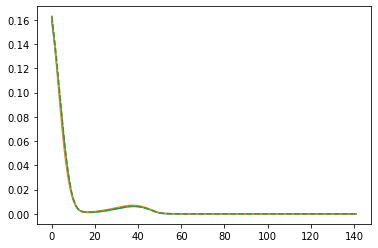

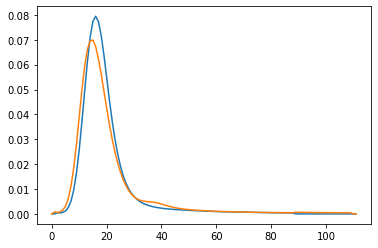

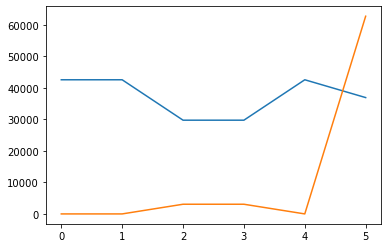

integral_array = [[42574.95299584     0.        ]
 [42574.95299584     0.        ]
 [29746.75820596  3071.47606248]
 [29746.75820596  3071.47606248]
 [42574.95299584     0.        ]
 [36922.92736883 62736.23132258]]
objective_val_non_comp = 6142.952124956931
objective_val_comp = 187218.37539944315
----- new PARAFAC decomposition with iteration offset -4 -----
new data tensor with boundaries (1281, 1394) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1394).
Compound used for PARAFAC data tensor: 2-chlorotoluene


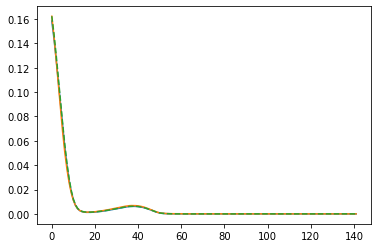

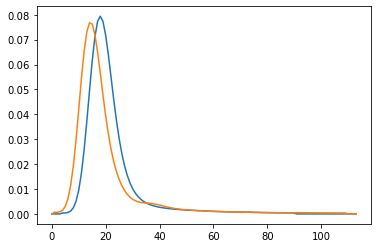

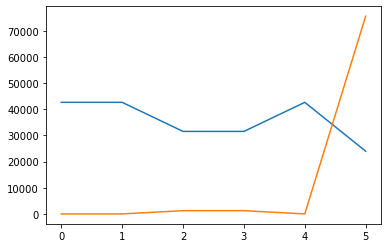

integral_array = [[42654.42900466     0.        ]
 [42654.42900466     0.        ]
 [31541.11695737  1241.95518677]
 [31541.11695737  1241.95518677]
 [42654.42900466     0.        ]
 [23980.94225098 75565.26424982]]
objective_val_non_comp = 2483.9103735479703
objective_val_comp = 191045.52092872036
----- new PARAFAC decomposition with iteration offset -5 -----
new data tensor with boundaries (1281, 1395) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1395).
Compound used for PARAFAC data tensor: 2-chlorotoluene


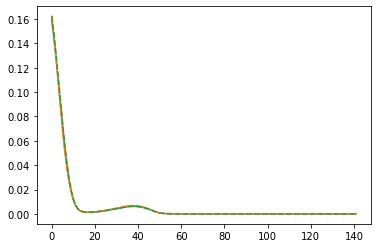

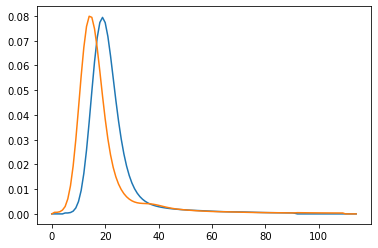

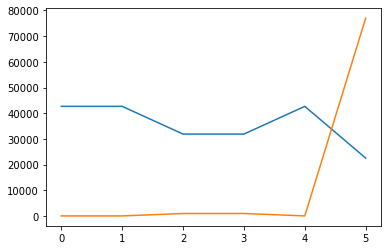

integral_array = [[42665.82352946     0.        ]
 [42665.82352946     0.        ]
 [31867.8636599    940.76064461]
 [31867.8636599    940.76064461]
 [42665.82352946     0.        ]
 [22531.24763078 76976.57554287]]
objective_val_non_comp = 1881.5212892178636
objective_val_comp = 191733.19790817954
----- new PARAFAC decomposition with iteration offset -6 -----
new data tensor with boundaries (1281, 1396) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1396).
Compound used for PARAFAC data tensor: 2-chlorotoluene


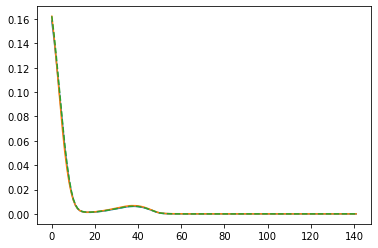

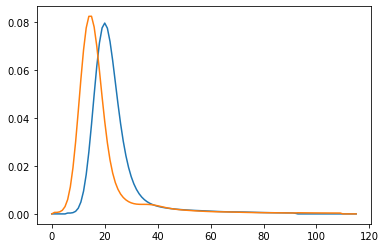

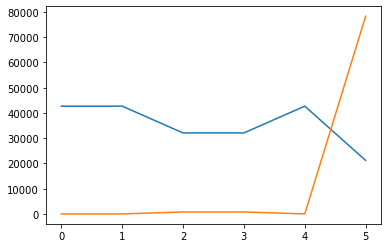

integral_array = [[42676.65178676     0.        ]
 [42676.65178676     0.        ]
 [32077.02415696   760.18343504]
 [32077.02415696   760.18343504]
 [42676.65178676     0.        ]
 [21183.60181091 78288.28022443]]
objective_val_non_comp = 1520.3668700704993
objective_val_comp = 192184.0036742189
----- new PARAFAC decomposition with iteration offset -7 -----
new data tensor with boundaries (1281, 1397) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1397).
Compound used for PARAFAC data tensor: 2-chlorotoluene


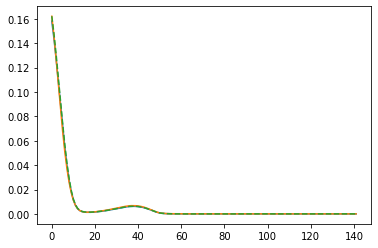

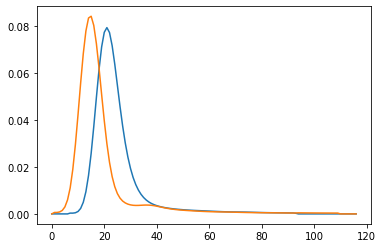

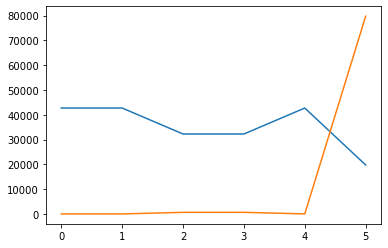

integral_array = [[42688.56138354     0.        ]
 [42688.56138354     0.        ]
 [32224.84903371   638.90868927]
 [32224.84903371   638.90868927]
 [42688.56138354     0.        ]
 [19736.17828222 79703.77181157]]
objective_val_non_comp = 1277.8173785340482
objective_val_comp = 192515.38221804047
----- new PARAFAC decomposition with iteration offset -8 -----
new data tensor with boundaries (1281, 1398) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1398).
Compound used for PARAFAC data tensor: 2-chlorotoluene


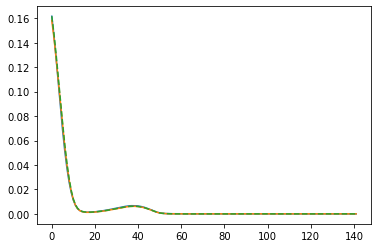

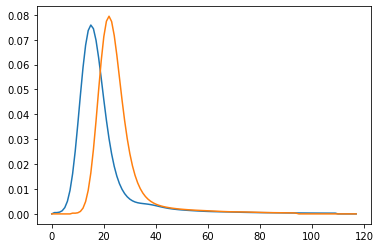

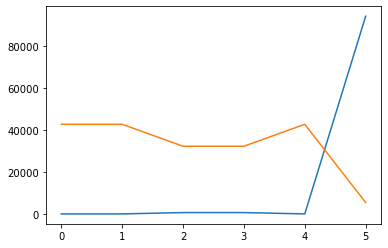

integral_array = [[    0.         42656.76684745]
 [    0.         42656.76684745]
 [  636.71722422 32215.40224919]
 [  636.71722422 32215.40224919]
 [    0.         42656.76684745]
 [94079.54889364  5422.63280358]]
objective_val_non_comp = 1273.4344484472988
objective_val_comp = 192401.1050407376


In [118]:
campaign.process_all_hplc_input(settings)

In [119]:
impure_peak = next(peak for peak in campaign.chroms[-1] if not peak.pure)

In [120]:
from mocca.decomposition.iterative_parafac import get_all_non_comp_sum, get_all_comp_sum, get_total_integral_sum, get_impure_integral_sum

----- new PARAFAC decomposition with iteration offset -10 -----
new data tensor with boundaries (1281, 1400) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1400).
Compound used for PARAFAC data tensor: 2-chlorotoluene


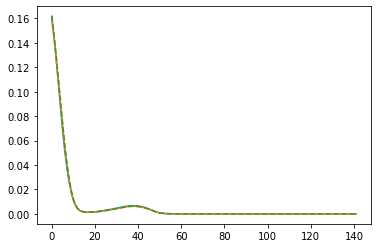

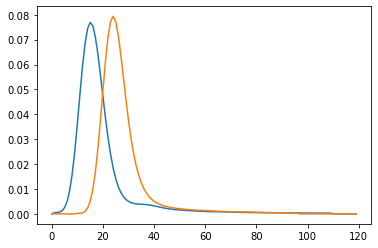

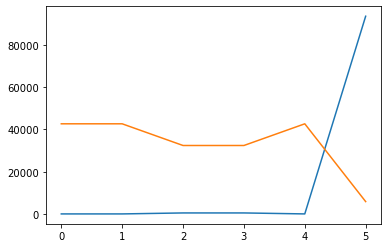

integral_array = [[    0.         42680.52519766]
 [    0.         42680.52519766]
 [  462.07038806 32406.61964615]
 [  462.07038806 32406.61964615]
 [    0.         42680.52519766]
 [93627.39129354  5842.02660787]]
objective_val_non_comp = 924.1407761125042
objective_val_comp = 192854.8148852736
objective_total_sum = 293248.3735628006
impure_peak_sum = 99469.41790141449
----- new PARAFAC decomposition with iteration offset -9 -----
new data tensor with boundaries (1281, 1399) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1399).
Compound used for PARAFAC data tensor: 2-chlorotoluene


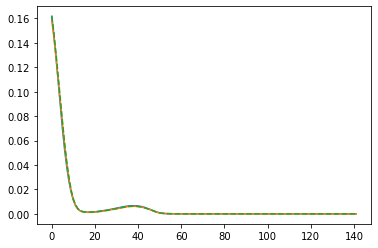

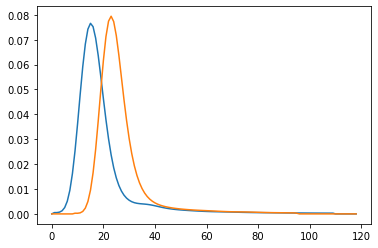

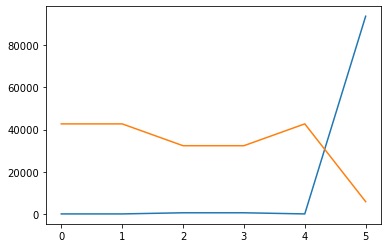

integral_array = [[    0.         42666.7644232 ]
 [    0.         42666.7644232 ]
 [  540.69502539 32322.51372339]
 [  540.69502539 32322.51372339]
 [    0.         42666.7644232 ]
 [93668.38913324  5817.01983617]]
objective_val_non_comp = 1081.390050786149
objective_val_comp = 192645.32071638803
objective_total_sum = 293212.11973658355
impure_peak_sum = 99485.40896940936
----- new PARAFAC decomposition with iteration offset -8 -----
new data tensor with boundaries (1281, 1398) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1398).
Compound used for PARAFAC data tensor: 2-chlorotoluene


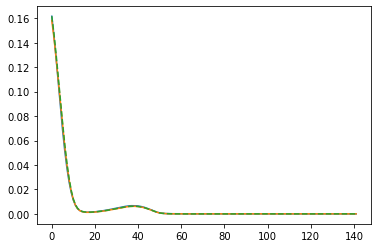

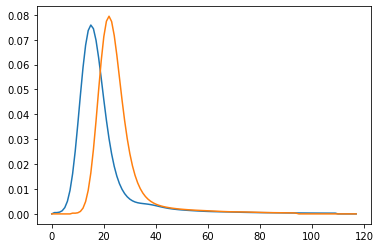

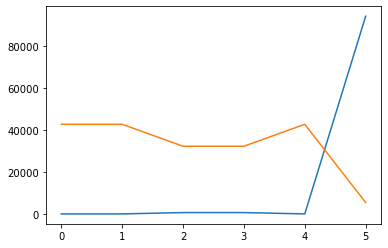

integral_array = [[    0.         42656.76684745]
 [    0.         42656.76684745]
 [  636.71722422 32215.40224919]
 [  636.71722422 32215.40224919]
 [    0.         42656.76684745]
 [94079.54889364  5422.63280358]]
objective_val_non_comp = 1273.434448447322
objective_val_comp = 192401.1050407378
objective_total_sum = 293176.72118640493
impure_peak_sum = 99502.18169721981
----- new PARAFAC decomposition with iteration offset -7 -----
new data tensor with boundaries (1281, 1397) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1397).
Compound used for PARAFAC data tensor: 2-chlorotoluene


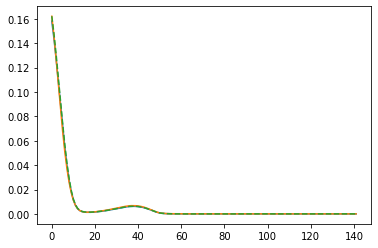

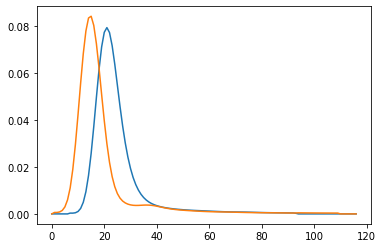

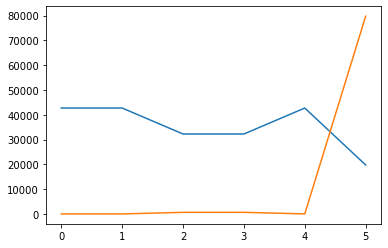

integral_array = [[42688.56138354     0.        ]
 [42688.56138354     0.        ]
 [32224.84903371   638.90868927]
 [32224.84903371   638.90868927]
 [42688.56138354     0.        ]
 [19736.17828222 79703.77181157]]
objective_val_non_comp = 1277.8173785340762
objective_val_comp = 192515.3822180403
objective_total_sum = 293233.149690358
impure_peak_sum = 99439.95009378367
----- new PARAFAC decomposition with iteration offset -6 -----
new data tensor with boundaries (1281, 1396) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1396).
Compound used for PARAFAC data tensor: 2-chlorotoluene


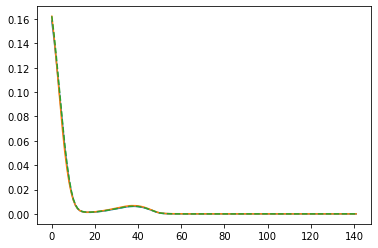

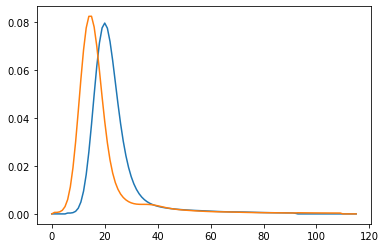

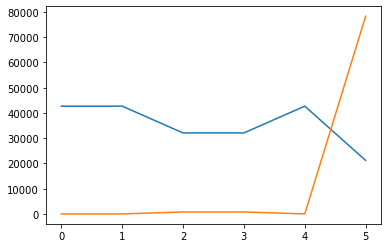

integral_array = [[42676.65178676     0.        ]
 [42676.65178676     0.        ]
 [32077.02415696   760.18343504]
 [32077.02415696   760.18343504]
 [42676.65178676     0.        ]
 [21183.60181091 78288.28022443]]
objective_val_non_comp = 1520.3668700705664
objective_val_comp = 192184.00367421884
objective_total_sum = 293176.25257963303
impure_peak_sum = 99471.88203534362
----- new PARAFAC decomposition with iteration offset -5 -----
new data tensor with boundaries (1281, 1395) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1395).
Compound used for PARAFAC data tensor: 2-chlorotoluene


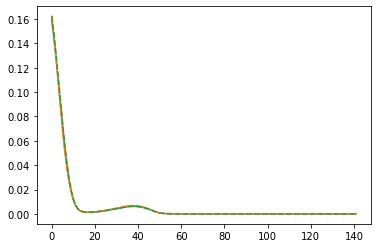

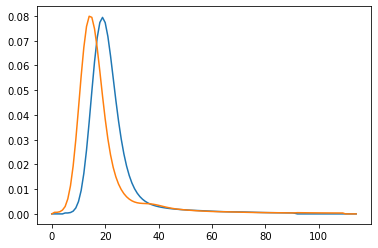

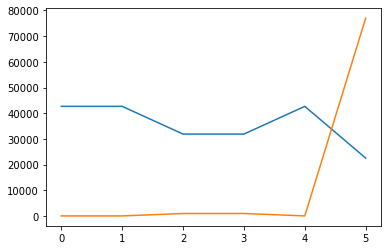

integral_array = [[42665.82352946     0.        ]
 [42665.82352946     0.        ]
 [31867.8636599    940.76064461]
 [31867.8636599    940.76064461]
 [42665.82352946     0.        ]
 [22531.24763078 76976.57554287]]
objective_val_non_comp = 1881.521289217787
objective_val_comp = 191733.1979081795
objective_total_sum = 293122.5423710496
impure_peak_sum = 99507.82317365227
----- new PARAFAC decomposition with iteration offset -4 -----
new data tensor with boundaries (1281, 1394) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1394).
Compound used for PARAFAC data tensor: 2-chlorotoluene


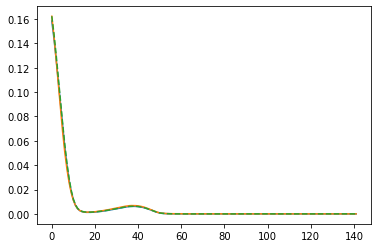

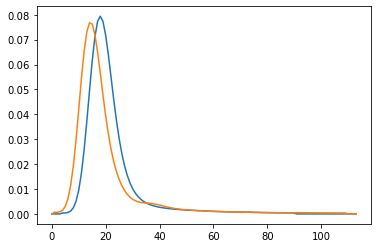

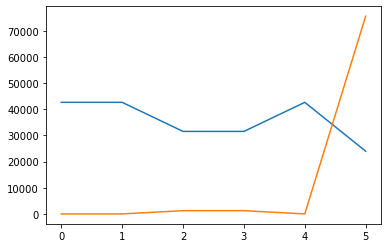

integral_array = [[42654.42900466     0.        ]
 [42654.42900466     0.        ]
 [31541.11695737  1241.95518677]
 [31541.11695737  1241.95518677]
 [42654.42900466     0.        ]
 [23980.94225098 75565.26424982]]
objective_val_non_comp = 2483.910373547897
objective_val_comp = 191045.52092872027
objective_total_sum = 293075.6378030675
impure_peak_sum = 99546.20650079934
----- new PARAFAC decomposition with iteration offset -3 -----
new data tensor with boundaries (1281, 1393) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1393).
Compound used for PARAFAC data tensor: 2-chlorotoluene


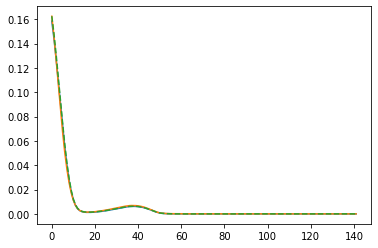

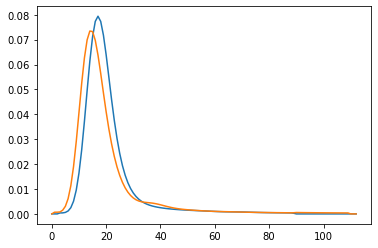

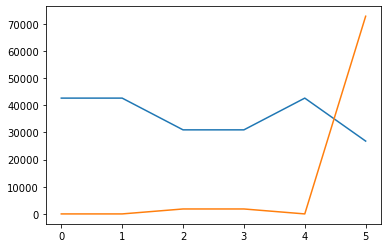

integral_array = [[42635.74550082     0.        ]
 [42635.74550082     0.        ]
 [30950.85134542  1821.33812975]
 [30950.85134542  1821.33812975]
 [42635.74550082     0.        ]
 [26809.80769886 72777.15745339]]
objective_val_non_comp = 3642.6762595018217
objective_val_comp = 189808.93919329526
objective_total_sum = 293038.5806050502
impure_peak_sum = 99586.96515225308
----- new PARAFAC decomposition with iteration offset -2 -----
new data tensor with boundaries (1281, 1392) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1392).
Compound used for PARAFAC data tensor: 2-chlorotoluene


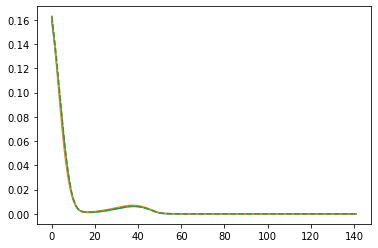

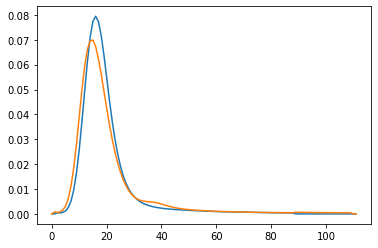

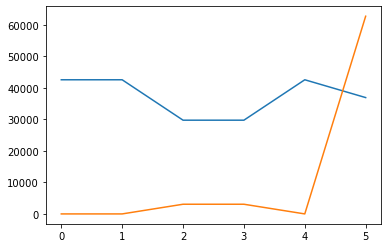

integral_array = [[42574.95299584     0.        ]
 [42574.95299584     0.        ]
 [29746.75820596  3071.47606248]
 [29746.75820596  3071.47606248]
 [42574.95299584     0.        ]
 [36922.92736883 62736.23132257]]
objective_val_non_comp = 6142.9521249572035
objective_val_comp = 187218.3753994429
objective_total_sum = 293020.4862158043
impure_peak_sum = 99659.15869140415
----- new PARAFAC decomposition with iteration offset -1 -----
new data tensor with boundaries (1281, 1391) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1391).
Compound used for PARAFAC data tensor: 2-chlorotoluene


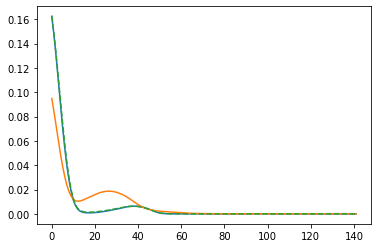

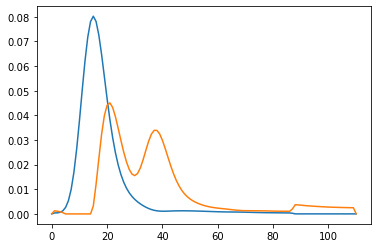

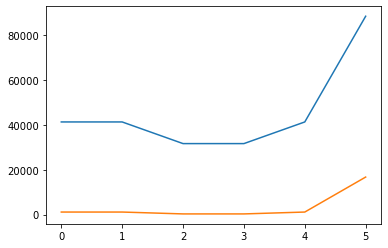

integral_array = [[41356.06851339  1101.84187673]
 [41356.06851339  1101.84187673]
 [31682.5712724    266.66696515]
 [31682.5712724    266.66696515]
 [41356.06851339  1101.84187673]
 [88581.06357191 16730.43972974]]
objective_val_non_comp = 3838.8595604671646
objective_val_comp = 187433.3480849642
objective_total_sum = 296583.7109470782
impure_peak_sum = 105311.5033016468
----- new PARAFAC decomposition with iteration offset 0 -----
new data tensor with boundaries (1281, 1390) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1390).
Compound used for PARAFAC data tensor: 2-chlorotoluene


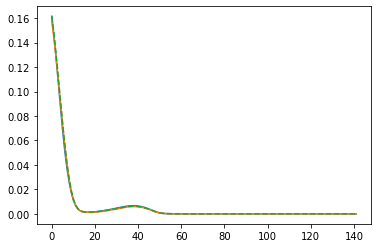

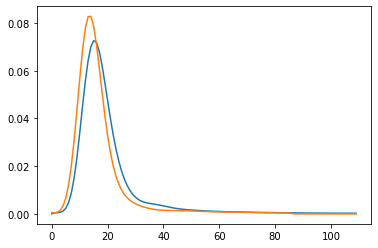

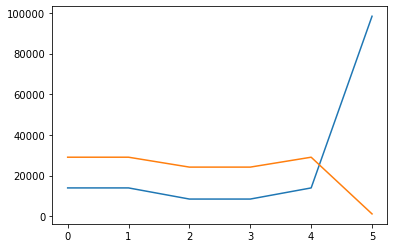

integral_array = [[13901.01417102 29008.96579622]
 [13901.01417102 29008.96579622]
 [ 8419.50560873 24138.33014477]
 [ 8419.50560873 24138.33014477]
 [13901.01417102 29008.96579622]
 [98366.31080212  1109.34519098]]
objective_val_non_comp = 58542.0537305347
objective_val_comp = 135303.55767820188
objective_total_sum = 293321.26740183425
impure_peak_sum = 99475.65599309771
----- new PARAFAC decomposition with iteration offset 1 -----
new data tensor with boundaries (1281, 1391) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1391).
Compound used for PARAFAC data tensor: 2-chlorotoluene


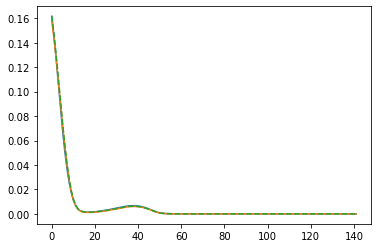

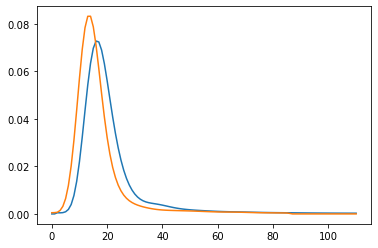

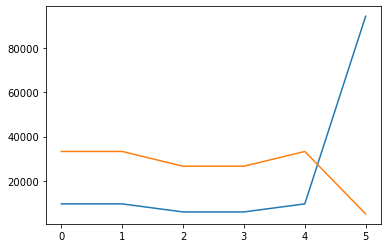

integral_array = [[ 9576.3467783  33296.07715215]
 [ 9576.3467783  33296.07715215]
 [ 5932.66323731 26615.74686575]
 [ 5932.66323731 26615.74686575]
 [ 9576.3467783  33296.07715215]
 [94484.3053197   5036.78097639]]
objective_val_non_comp = 40594.366809509826
objective_val_comp = 153119.72518793403
objective_total_sum = 293235.1782935316
impure_peak_sum = 99521.08629608774
----- new PARAFAC decomposition with iteration offset 2 -----
new data tensor with boundaries (1281, 1392) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1392).
Compound used for PARAFAC data tensor: 2-chlorotoluene


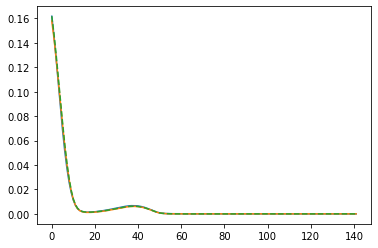

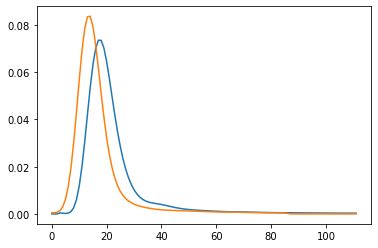

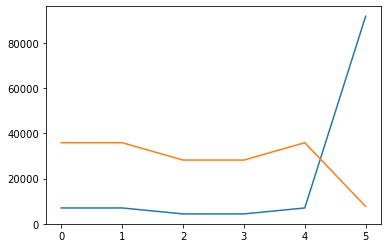

integral_array = [[ 6973.07260694 35885.32607922]
 [ 6973.07260694 35885.32607922]
 [ 4330.01436218 28198.63402495]
 [ 4330.01436218 28198.63402495]
 [ 6973.07260694 35885.32607922]
 [91916.08424242  7625.02100036]]
objective_val_non_comp = 29579.246545174377
objective_val_comp = 164053.2462875559
objective_total_sum = 293173.59807550546
impure_peak_sum = 99541.10524277521
----- new PARAFAC decomposition with iteration offset 3 -----
new data tensor with boundaries (1281, 1393) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1393).
Compound used for PARAFAC data tensor: 2-chlorotoluene


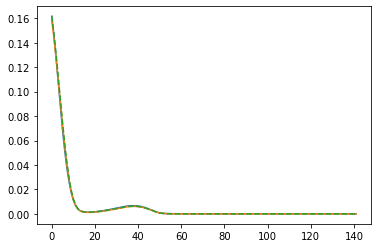

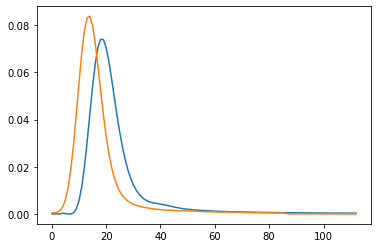

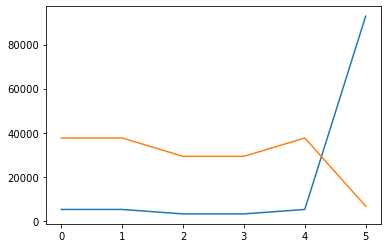

integral_array = [[ 5225.20958232 37625.1371919 ]
 [ 5225.20958232 37625.1371919 ]
 [ 3198.21931164 29310.84337864]
 [ 3198.21931164 29310.84337864]
 [ 5225.20958232 37625.1371919 ]
 [92820.63920717  6745.4934136 ]]
objective_val_non_comp = 22072.067370247296
objective_val_comp = 171497.09833298827
objective_total_sum = 293135.2983240104
impure_peak_sum = 99566.13262077482
----- new PARAFAC decomposition with iteration offset 4 -----
new data tensor with boundaries (1281, 1394) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1394).
Compound used for PARAFAC data tensor: 2-chlorotoluene


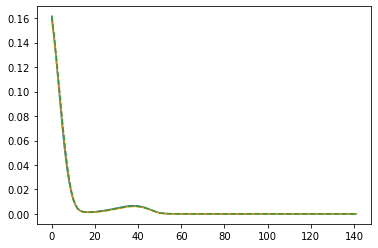

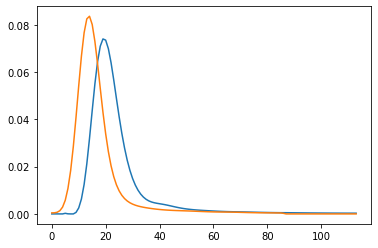

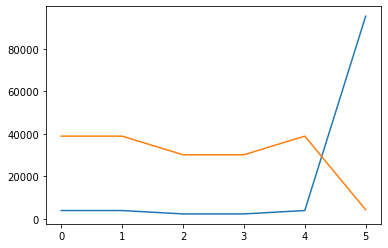

integral_array = [[ 3935.38766918 38907.72516354]
 [ 3935.38766918 38907.72516354]
 [ 2345.86081207 30147.96702654]
 [ 2345.86081207 30147.96702654]
 [ 3935.38766918 38907.72516354]
 [95268.99969316  4303.65078482]]
objective_val_non_comp = 16497.88463167047
objective_val_comp = 177019.1095436929
objective_total_sum = 293089.64465334686
impure_peak_sum = 99572.65047798346
----- new PARAFAC decomposition with iteration offset 5 -----
new data tensor with boundaries (1281, 1395) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1395).
Compound used for PARAFAC data tensor: 2-chlorotoluene


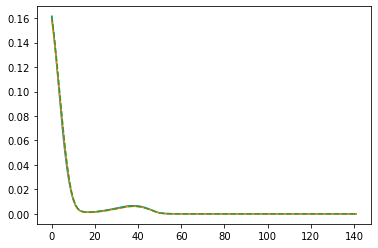

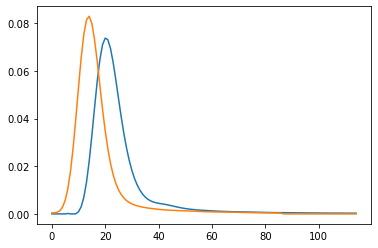

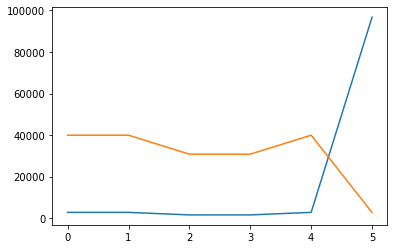

integral_array = [[ 2853.38851433 39980.91698292]
 [ 2853.38851433 39980.91698292]
 [ 1629.60506412 30854.80821205]
 [ 1629.60506412 30854.80821205]
 [ 2853.38851433 39980.91698292]
 [96737.04291061  2840.6336547 ]]
objective_val_non_comp = 11819.375671233154
objective_val_comp = 181652.3673728496
objective_total_sum = 293049.4196093901
impure_peak_sum = 99577.6765653073
----- new PARAFAC decomposition with iteration offset 6 -----
new data tensor with boundaries (1281, 1396) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1396).
Compound used for PARAFAC data tensor: 2-chlorotoluene


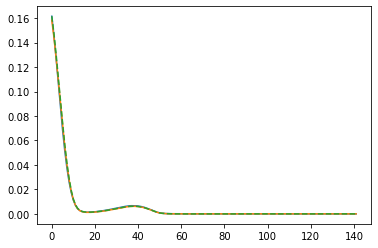

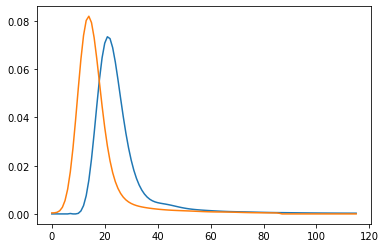

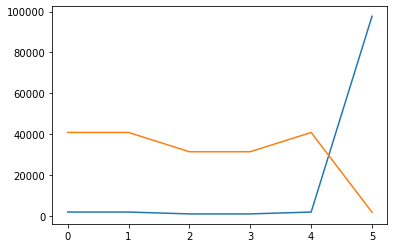

integral_array = [[ 1946.95892234 40876.63632474]
 [ 1946.95892234 40876.63632474]
 [ 1031.12127341 31450.74451582]
 [ 1031.12127341 31450.74451582]
 [ 1946.95892234 40876.63632474]
 [97721.84166886  1857.37076277]]
objective_val_non_comp = 7903.1193138474655
objective_val_comp = 185531.3980058658
objective_total_sum = 293013.7297513383
impure_peak_sum = 99579.21243162506
----- new PARAFAC decomposition with iteration offset 7 -----
new data tensor with boundaries (1281, 1397) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1397).
Compound used for PARAFAC data tensor: 2-chlorotoluene


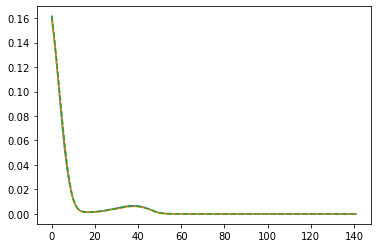

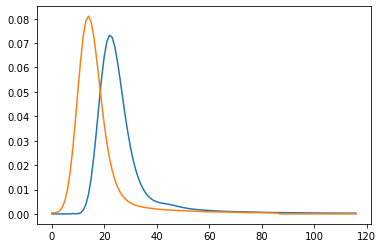

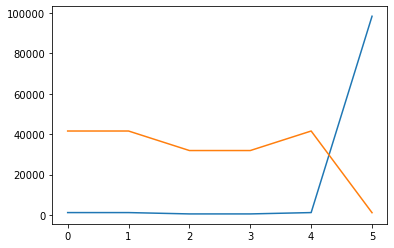

integral_array = [[ 1215.10811047 41597.70571326]
 [ 1215.10811047 41597.70571326]
 [  554.07968927 31933.3813888 ]
 [  554.07968927 31933.3813888 ]
 [ 1215.10811047 41597.70571326]
 [98420.48203611  1157.11225896]]
objective_val_non_comp = 4753.483709933846
objective_val_comp = 188659.87991739687
objective_total_sum = 292990.9579224021
impure_peak_sum = 99577.59429507134
----- new PARAFAC decomposition with iteration offset 8 -----
new data tensor with boundaries (1281, 1398) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1398).
Compound used for PARAFAC data tensor: 2-chlorotoluene


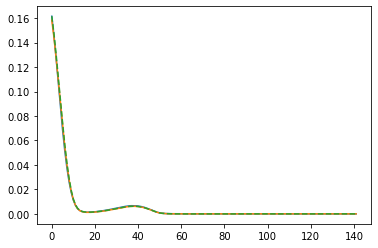

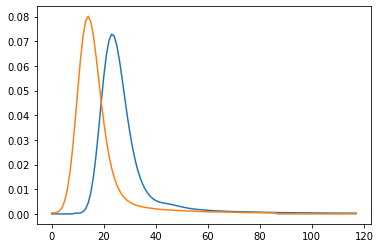

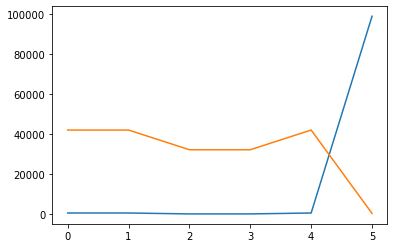

integral_array = [[  644.2233488  42160.52377617]
 [  644.2233488  42160.52377617]
 [  189.64662233 32312.4176101 ]
 [  189.64662233 32312.4176101 ]
 [  644.2233488  42160.52377617]
 [99115.27651759   447.71489219]]
objective_val_non_comp = 2311.9632910646924
objective_val_comp = 191106.40654872006
objective_total_sum = 292981.361249565
impure_peak_sum = 99562.99140978021
----- new PARAFAC decomposition with iteration offset 9 -----
new data tensor with boundaries (1281, 1399) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1399).
Compound used for PARAFAC data tensor: 2-chlorotoluene


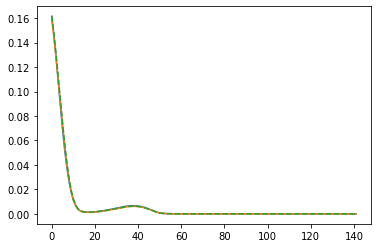

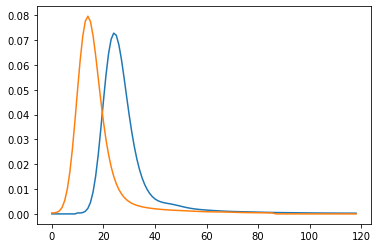

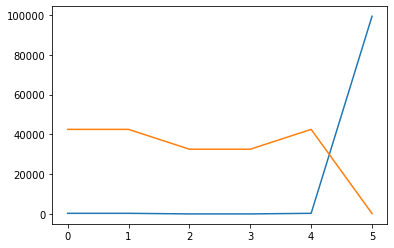

integral_array = [[  299.31804338 42496.48307943]
 [  299.31804338 42496.48307943]
 [    0.         32527.55919617]
 [    0.         32527.55919617]
 [  299.31804338 42496.48307943]
 [99361.7643023    192.04483545]]
objective_val_non_comp = 897.9541301263812
objective_val_comp = 192544.5676306397
objective_total_sum = 292996.33089851437
impure_peak_sum = 99553.80913774826
----- new PARAFAC decomposition with iteration offset 10 -----
new data tensor with boundaries (1281, 1400) and shape(5,) built from ['2-chlorotoluene'].
PARAFAC data tensor has boundaries in the time axis of (1281, 1400).
Compound used for PARAFAC data tensor: 2-chlorotoluene


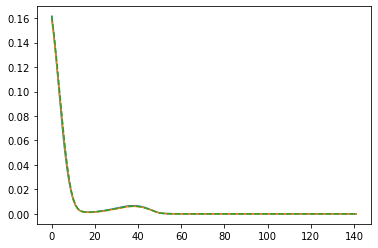

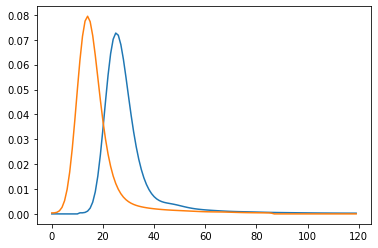

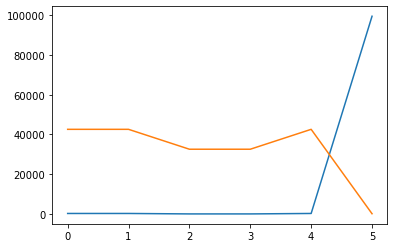

integral_array = [[2.26572765e+02 4.25590127e+04]
 [2.26572765e+02 4.25590127e+04]
 [0.00000000e+00 3.25483691e+04]
 [0.00000000e+00 3.25483691e+04]
 [2.26572765e+02 4.25590127e+04]
 [9.94568681e+04 9.26041014e+01]]
objective_val_non_comp = 679.7182951095692
objective_val_comp = 192773.7764384204
objective_total_sum = 293002.9669534207
impure_peak_sum = 99549.47221989077


In [121]:
show_parafac_analytics = True
non_comp_sums = []
comp_sums = []
total_integral_sums = []
impure_peak_sums = []
offsets = [i - 10 for i in list(range(21))]
for iter_offset in offsets:
    parafac_factors, boundaries, comp_tensor_shape, y_offset =\
        parafac(impure_peak, campaign.quali_comp_db, iter_offset, show_parafac_analytics)
    non_comp_sum = get_all_non_comp_sum(parafac_factors, comp_tensor_shape, show_parafac_analytics)
    non_comp_sums.append(non_comp_sum)

    comp_sum = get_all_comp_sum(parafac_factors, comp_tensor_shape, show_parafac_analytics)
    comp_sums.append(comp_sum)

    total_integral_sum = get_total_integral_sum(parafac_factors, show_parafac_analytics)
    total_integral_sums.append(total_integral_sum)
    
    impure_peak_sum = get_impure_integral_sum(parafac_factors, show_parafac_analytics)
    impure_peak_sums.append(impure_peak_sum)

In [125]:
impure_peak_sums_old = impure_peak_sums
impure_peak_sums = impure_peak_sums[-21:]

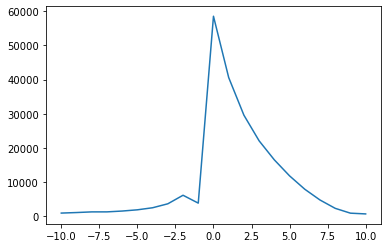

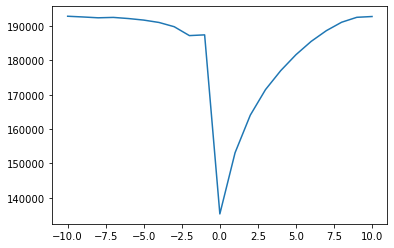

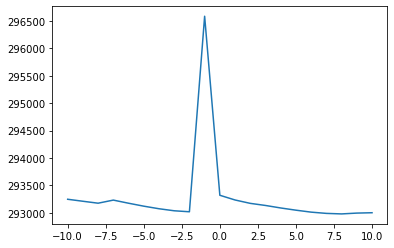

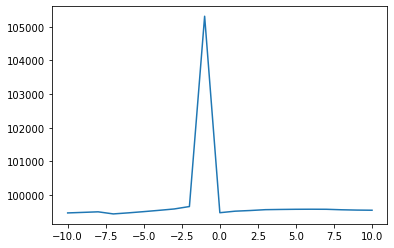

In [126]:
plt.plot(offsets, non_comp_sums)
plt.show()
plt.plot(offsets, comp_sums)
plt.show()
plt.plot(offsets, total_integral_sums)
plt.show()
plt.plot(offsets, impure_peak_sums)
plt.show()

# Knoevenagel PARAFAC dev

In [2]:
# add the path to the test data folder
knoev_data_path = "/Users/haascp/Documents/GitHub/mocca/notebooks/knoevenagel_data"

# find all folders containing Agilent HPLC data (.D file extension)
folders = glob(knoev_data_path + '/*' + '.D') 
folders = sorted(folders)

In [3]:
knoev_campaign = HplcDadCampaign()

In [4]:
ba_concs = [0.965, 0.761, 0.482, 0.231]
cl_concs = [1.01, 0.744, 0.478, 0.234]
ome_concs = [0.990, 0.723, 0.455, 0.231]
nme2_concs = [0.982, 0.719, 0.468, 0.229]

In [5]:
gradient_calib = Gradient(folders[0])

In [6]:
for i, folder in enumerate(folders[1:5]):
    compound = Compound('benzaldehyde', ba_concs[i])
    exp = HplcInput(folder, gradient_calib, compound=compound)
    knoev_campaign.add_hplc_input(exp)

for i, folder in enumerate(folders[5:9]):
    compound = Compound('4-chlorobenzaldehyde', cl_concs[i])
    exp = HplcInput(folder, gradient_calib, compound=compound)
    knoev_campaign.add_hplc_input(exp)

for i, folder in enumerate(folders[9:13]):
    compound = Compound('4-methoxybenzaldehyde', ome_concs[i])
    exp = HplcInput(folder, gradient_calib, compound=compound)
    knoev_campaign.add_hplc_input(exp)

for i, folder in enumerate(folders[13:17]):
    compound = Compound('4-dimethylaminobenzaldehyde', nme2_concs[i])
    exp = HplcInput(folder, gradient_calib, compound=compound)
    knoev_campaign.add_hplc_input(exp)

In [7]:
gradient_react = Gradient(folders[17])

In [8]:
exp = HplcInput(folders[-1], gradient_react)
knoev_campaign.add_hplc_input(exp)

In [9]:
settings = Settings('chemstation',
                    absorbance_threshold = 300, wl_high_pass = 215, 
                    peaks_high_pass = 1, peaks_low_pass = 3.2,
                    spectrum_correl_thresh=0.99, relative_distance_thresh=0.01)

----- new PARAFAC decomposition with iteration offset 0 -----
new data tensor with boundaries (1445, 1566) and shape(5, 5, 5) built from ['4-dimethylaminobenzaldehyde', '4-methoxybenzaldehyde', 'benzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1445, 1566).
Compound used for PARAFAC data tensor: 4-dimethylaminobenzaldehyde
Compound used for PARAFAC data tensor: 4-methoxybenzaldehyde
Compound used for PARAFAC data tensor: benzaldehyde


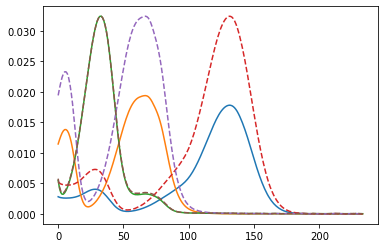

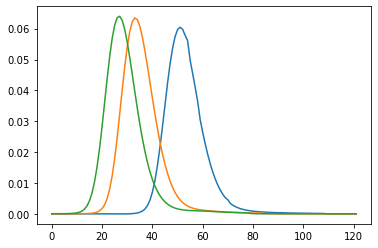

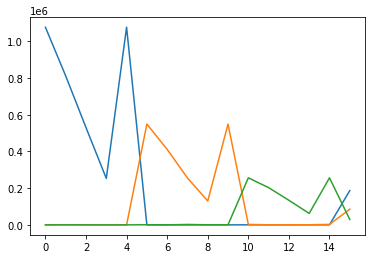

integral_array = [[1.07573187e+06 6.18638462e+01 2.68922090e+02]
 [8.10766754e+05 9.34960906e+02 4.08670963e+02]
 [5.29718206e+05 5.92262019e+01 3.17427051e+02]
 [2.53213153e+05 0.00000000e+00 4.52264870e+01]
 [1.07573187e+06 6.18638462e+01 2.68922090e+02]
 [2.56856760e+02 5.48601388e+05 9.50511065e+02]
 [5.79866695e+02 4.11062322e+05 3.14913583e+02]
 [1.26741283e+02 2.55423663e+05 2.47019765e+03]
 [5.86253602e+02 1.30200233e+05 6.47138055e+02]
 [2.56856760e+02 5.48601388e+05 9.50511065e+02]
 [5.53242264e+02 2.77046187e+03 2.56245085e+05]
 [5.38235951e+02 5.36158053e+02 2.02752073e+05]
 [5.58067290e+02 8.56457382e+02 1.33977673e+05]
 [6.16558748e+02 9.18164110e+02 6.25784113e+04]
 [5.53242264e+02 2.77046187e+03 2.56245085e+05]
 [1.86858964e+05 8.55289265e+04 2.94713901e+04]]
impure_peak_sum = 301859.2804898418
----- new PARAFAC decomposition with iteration offset -1 -----
new data tensor with boundaries (1445, 1567) and shape(5, 5, 5) built from ['4-dimethylaminobenzaldehyde', '4-metho

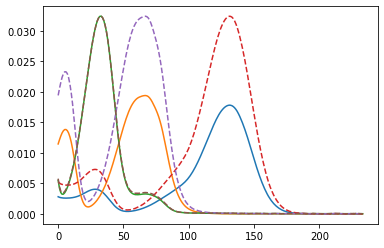

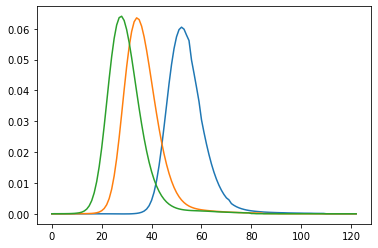

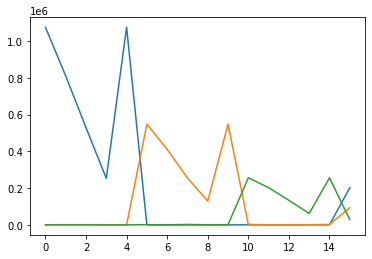

integral_array = [[1.07486879e+06 1.41662636e+02 2.65438684e+02]
 [8.10092440e+05 9.93614832e+02 4.04464279e+02]
 [5.29289888e+05 9.99405302e+01 3.14598068e+02]
 [2.53019401e+05 0.00000000e+00 4.91855437e+01]
 [1.07486879e+06 1.41662636e+02 2.65438684e+02]
 [3.33390251e+02 5.47995836e+05 1.22170875e+03]
 [6.36069004e+02 4.10609958e+05 5.17712391e+02]
 [1.63665937e+02 2.55137137e+05 2.59664063e+03]
 [6.03756293e+02 1.30055986e+05 7.11282158e+02]
 [3.33390251e+02 5.47995836e+05 1.22170875e+03]
 [5.86269267e+02 2.79538816e+03 2.56067726e+05]
 [5.64022320e+02 5.59447570e+02 2.02613974e+05]
 [5.74837074e+02 8.70959248e+02 1.33886301e+05]
 [6.24084950e+02 9.23992374e+02 6.25356571e+04]
 [5.86269267e+02 2.79538816e+03 2.56067726e+05]
 [2.02168699e+05 9.31161299e+04 2.88877383e+04]]
impure_peak_sum = 324172.56687514577
----- new PARAFAC decomposition with iteration offset 1 -----
new data tensor with boundaries (1445, 1567) and shape(5, 5, 5) built from ['4-dimethylaminobenzaldehyde', '4-metho

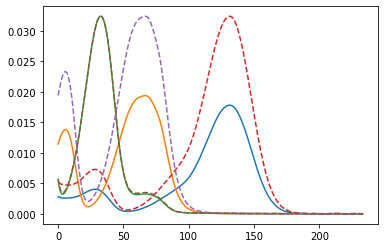

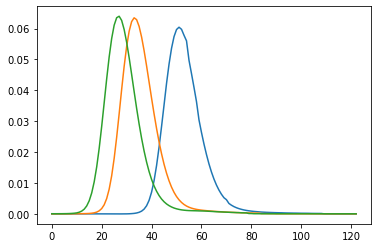

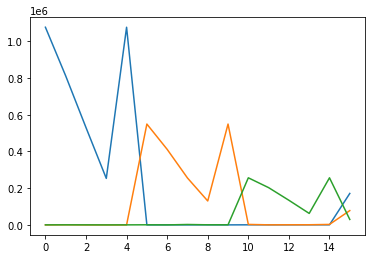

integral_array = [[1.07642625e+06 0.00000000e+00 2.69492615e+02]
 [8.11307560e+05 8.84864186e+02 4.11566920e+02]
 [5.30053352e+05 2.46429345e+01 3.19272680e+02]
 [2.53366648e+05 0.00000000e+00 4.15321527e+01]
 [1.07642625e+06 0.00000000e+00 2.69492615e+02]
 [1.88183230e+02 5.49184931e+05 6.73740762e+02]
 [5.29380079e+02 4.11497659e+05 1.07535277e+02]
 [9.35145533e+01 2.55700897e+05 2.34299025e+03]
 [5.70451246e+02 1.30339270e+05 5.81993821e+02]
 [1.88183230e+02 5.49184931e+05 6.73740762e+02]
 [5.19270257e+02 2.67235828e+03 2.56539421e+05]
 [5.11649105e+02 4.55122102e+02 2.02982406e+05]
 [5.40714931e+02 8.03765907e+02 1.34130069e+05]
 [6.08660276e+02 8.94421406e+02 6.26497380e+04]
 [5.19270257e+02 2.67235828e+03 2.56539421e+05]
 [1.71373698e+05 7.79664658e+04 2.97750274e+04]]
impure_peak_sum = 279115.1912959569
----- new PARAFAC decomposition with iteration offset -2 -----
new data tensor with boundaries (1445, 1568) and shape(5, 5, 5) built from ['4-dimethylaminobenzaldehyde', '4-metho

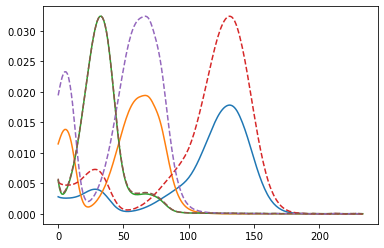

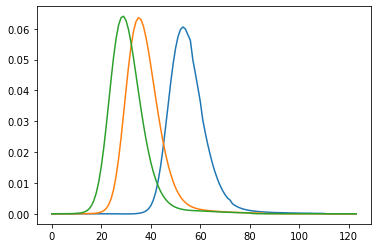

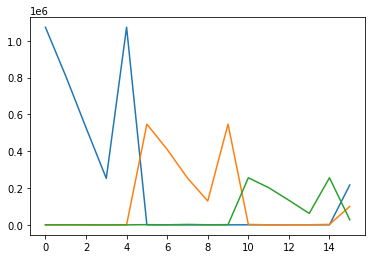

integral_array = [[1.07383426e+06 2.27682363e+02 2.59015790e+02]
 [8.09285028e+05 1.05647793e+03 3.98112814e+02]
 [5.28766180e+05 1.43839518e+02 3.10209758e+02]
 [2.52783386e+05 0.00000000e+00 5.27266411e+01]
 [1.07383426e+06 2.27682363e+02 2.59015790e+02]
 [4.13841570e+02 5.47368527e+05 1.46375378e+03]
 [6.95072136e+02 4.10140427e+05 6.98326963e+02]
 [2.02346181e+02 2.54842373e+05 2.71112366e+03]
 [6.22011587e+02 1.29906664e+05 7.68788857e+02]
 [4.13841570e+02 5.47368527e+05 1.46375378e+03]
 [6.16745806e+02 2.74283888e+03 2.55997729e+05]
 [5.87736175e+02 5.21442009e+02 2.02560377e+05]
 [5.90180072e+02 8.44940575e+02 1.33850832e+05]
 [6.30830813e+02 9.10830501e+02 6.25190762e+04]
 [6.16745806e+02 2.74283888e+03 2.55997729e+05]
 [2.16837765e+05 1.00477392e+05 2.81060964e+04]]
impure_peak_sum = 345421.253137853
----- new PARAFAC decomposition with iteration offset 2 -----
new data tensor with boundaries (1445, 1568) and shape(5, 5, 5) built from ['4-dimethylaminobenzaldehyde', '4-methoxy

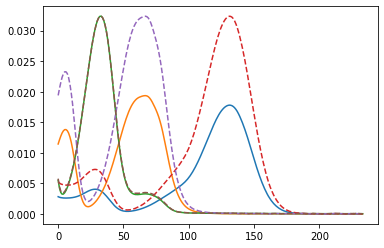

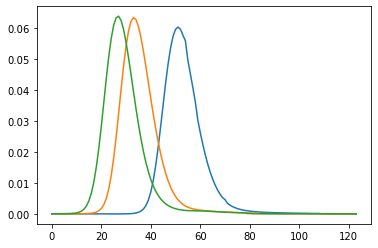

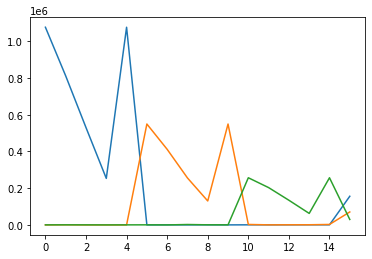

integral_array = [[1.07687188e+06 0.00000000e+00 2.58672855e+02]
 [8.11653759e+05 8.46615074e+02 4.13112091e+02]
 [5.30257847e+05 0.00000000e+00 3.19792009e+02]
 [2.53462208e+05 0.00000000e+00 3.84506970e+01]
 [1.07687188e+06 0.00000000e+00 2.58672855e+02]
 [1.34075456e+02 5.49633480e+05 4.35522146e+02]
 [4.89216870e+02 4.11807862e+05 0.00000000e+00]
 [6.71997278e+01 2.55915329e+05 2.23520013e+03]
 [5.57876764e+02 1.30446171e+05 5.26221612e+02]
 [1.34075456e+02 5.49633480e+05 4.35522146e+02]
 [4.86284703e+02 2.51167057e+03 2.56903073e+05]
 [4.85756801e+02 3.25419444e+02 2.03267344e+05]
 [5.23736522e+02 7.18699104e+02 1.34318631e+05]
 [6.00810367e+02 8.55304394e+02 6.27380331e+04]
 [4.86284703e+02 2.51167057e+03 2.56903073e+05]
 [1.56115727e+05 7.06242938e+04 2.97363477e+04]]
impure_peak_sum = 256476.36892365935
----- new PARAFAC decomposition with iteration offset -3 -----
new data tensor with boundaries (1445, 1569) and shape(5, 5, 5) built from ['4-dimethylaminobenzaldehyde', '4-meth

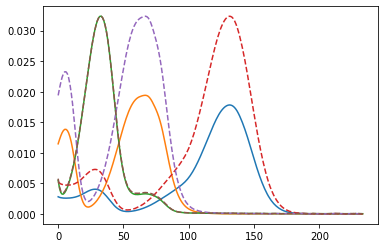

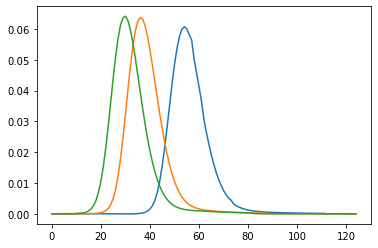

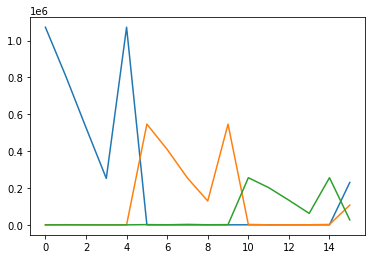

integral_array = [[1.07269018e+06 3.13843881e+02 2.50290166e+02]
 [8.08394674e+05 1.11901008e+03 3.90251828e+02]
 [5.28177742e+05 1.87831983e+02 3.04685797e+02]
 [2.52518283e+05 0.00000000e+00 5.56539346e+01]
 [1.07269018e+06 3.13843881e+02 2.50290166e+02]
 [4.95209710e+02 5.46766042e+05 1.65175908e+03]
 [7.54713932e+02 4.09688334e+05 8.38185161e+02]
 [2.41268132e+02 2.54561993e+05 2.80185269e+03]
 [6.40356985e+02 1.29763419e+05 8.13738536e+02]
 [4.95209710e+02 5.46766042e+05 1.65175908e+03]
 [6.43633186e+02 2.61612204e+03 2.56039100e+05]
 [6.08569191e+02 4.24458920e+02 2.02594452e+05]
 [6.03588156e+02 7.79997999e+02 1.33873340e+05]
 [6.36587145e+02 8.79501959e+02 6.25296249e+04]
 [6.43633186e+02 2.61612204e+03 2.56039100e+05]
 [2.30388559e+05 1.07345118e+05 2.72274378e+04]]
impure_peak_sum = 364961.11436715466
----- new PARAFAC decomposition with iteration offset 3 -----
new data tensor with boundaries (1445, 1569) and shape(5, 5, 5) built from ['4-dimethylaminobenzaldehyde', '4-metho

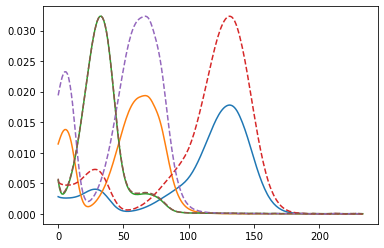

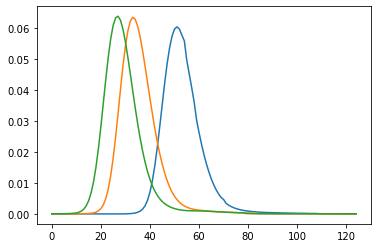

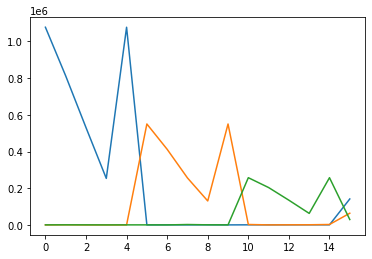

integral_array = [[1.07708323e+06 0.00000000e+00 2.50120399e+02]
 [8.11815069e+05 8.20438067e+02 4.13163739e+02]
 [5.30339813e+05 0.00000000e+00 3.15731728e+02]
 [2.53503499e+05 0.00000000e+00 3.60711832e+01]
 [1.07708323e+06 0.00000000e+00 2.50120399e+02]
 [9.77184507e+01 5.49923549e+05 2.53827177e+02]
 [4.61770465e+02 4.11977325e+05 0.00000000e+00]
 [4.93341331e+01 2.56055469e+05 2.15481932e+03]
 [5.49305132e+02 1.30515321e+05 4.84009674e+02]
 [9.77184507e+01 5.49923549e+05 2.53827177e+02]
 [4.56506172e+02 2.30635058e+03 2.57303464e+05]
 [4.62305121e+02 1.61402741e+02 2.03581373e+05]
 [5.08294856e+02 6.10704216e+02 1.34526475e+05]
 [5.93573584e+02 8.05197846e+02 6.28353834e+04]
 [4.56506172e+02 2.30635058e+03 2.57303464e+05]
 [1.41432372e+05 6.36627838e+04 2.93190901e+04]]
impure_peak_sum = 234414.24545218115
----- new PARAFAC decomposition with iteration offset -4 -----
new data tensor with boundaries (1445, 1570) and shape(5, 5, 5) built from ['4-dimethylaminobenzaldehyde', '4-meth

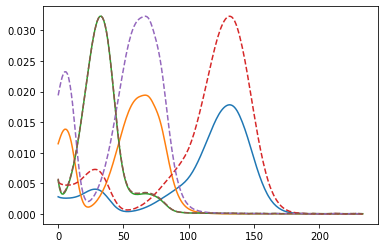

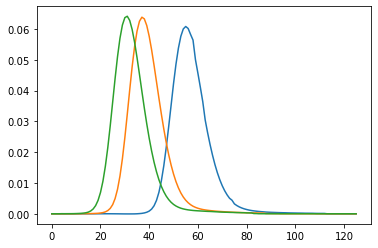

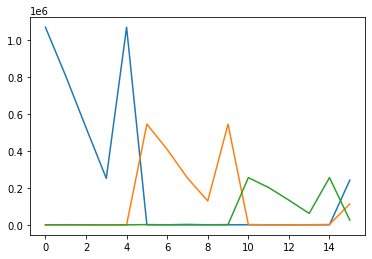

integral_array = [[1.07151503e+06 3.93504168e+02 2.40080368e+02]
 [8.07484469e+05 1.17647661e+03 3.81565150e+02]
 [5.27564440e+05 2.28523452e+02 2.98541251e+02]
 [2.52241135e+05 0.00000000e+00 5.78013463e+01]
 [1.07151503e+06 3.93504168e+02 2.40080368e+02]
 [5.72452424e+02 5.46249126e+05 1.76317965e+03]
 [8.11313629e+02 4.09299007e+05 9.20481922e+02]
 [2.77976595e+02 2.54324998e+05 2.85803777e+03]
 [6.57662979e+02 1.29640757e+05 8.40748896e+02]
 [5.72452424e+02 5.46249126e+05 1.76317965e+03]
 [6.66467142e+02 2.42304258e+03 2.56188301e+05]
 [6.26177202e+02 2.74360793e+02 2.02713508e+05]
 [6.14865065e+02 6.80083589e+02 1.33952013e+05]
 [6.41301525e+02 8.31951245e+02 6.25664299e+04]
 [6.66467142e+02 2.42304258e+03 2.56188301e+05]
 [2.42350802e+05 1.13449189e+05 2.63602568e+04]]
impure_peak_sum = 382160.2484211442
----- new PARAFAC decomposition with iteration offset -5 -----
new data tensor with boundaries (1445, 1571) and shape(5, 5, 5) built from ['4-dimethylaminobenzaldehyde', '4-metho

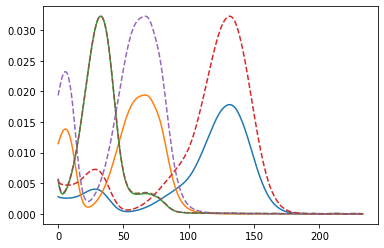

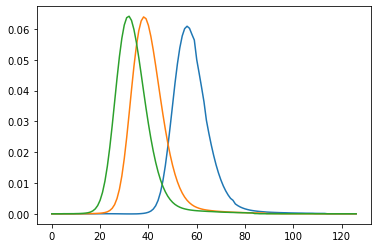

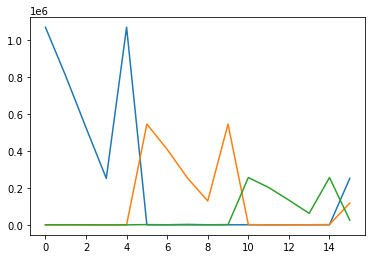

integral_array = [[1.07040010e+06 4.60086220e+02 2.28465649e+02]
 [8.06626836e+05 1.22436582e+03 3.72069469e+02]
 [5.26973337e+05 2.62541489e+02 2.91898608e+02]
 [2.51972253e+05 0.00000000e+00 5.88464593e+01]
 [1.07040010e+06 4.60086220e+02 2.28465649e+02]
 [6.39284682e+02 5.45889090e+05 1.77758947e+03]
 [8.60260294e+02 4.09025856e+05 9.29986991e+02]
 [3.09467963e+02 2.54164896e+05 2.86987267e+03]
 [6.72517361e+02 1.29555656e+05 8.44932132e+02]
 [6.39284682e+02 5.45889090e+05 1.77758947e+03]
 [6.85299660e+02 2.17403959e+03 2.56436498e+05]
 [6.40628532e+02 7.90825278e+01 2.02910748e+05]
 [6.24090202e+02 5.50533210e+02 1.34082321e+05]
 [6.45058393e+02 7.70779555e+02 6.26273295e+04]
 [6.85299660e+02 2.17403959e+03 2.56436498e+05]
 [2.52291616e+05 1.18538152e+05 2.56099702e+04]]
impure_peak_sum = 396439.7387982299
----- new PARAFAC decomposition with iteration offset -6 -----
new data tensor with boundaries (1445, 1572) and shape(5, 5, 5) built from ['4-dimethylaminobenzaldehyde', '4-metho

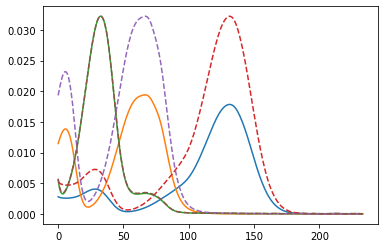

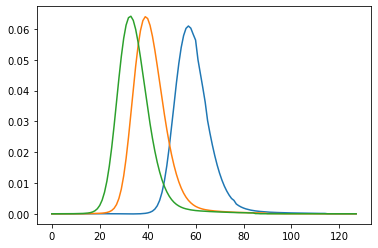

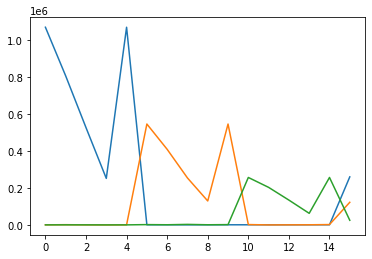

integral_array = [[1.06943282e+06 5.07938870e+02 2.15885344e+02]
 [8.05890123e+05 1.25915405e+03 3.61913230e+02]
 [5.26450124e+05 2.86921374e+02 2.84994476e+02]
 [2.51731595e+05 0.00000000e+00 5.86034083e+01]
 [1.06943282e+06 5.07938870e+02 2.15885344e+02]
 [6.85789566e+02 5.45766088e+05 1.68529946e+03]
 [8.94210726e+02 4.08929006e+05 8.59727005e+02]
 [3.31076922e+02 2.54119235e+05 2.83167715e+03]
 [6.82645935e+02 1.29527236e+05 8.23812454e+02]
 [6.85789566e+02 5.45766088e+05 1.68529946e+03]
 [7.00480155e+02 1.91564901e+03 2.56727999e+05]
 [6.49322597e+02 0.00000000e+00 2.03114826e+05]
 [6.31498015e+02 4.15605295e+02 1.34235285e+05]
 [6.48018031e+02 7.07437783e+02 6.26987271e+04]
 [7.00480155e+02 1.91564901e+03 2.56727999e+05]
 [2.59840563e+05 1.22403065e+05 2.50679749e+04]]
impure_peak_sum = 407311.60261065414
----- new PARAFAC decomposition with iteration offset -7 -----
new data tensor with boundaries (1445, 1573) and shape(5, 5, 5) built from ['4-dimethylaminobenzaldehyde', '4-meth

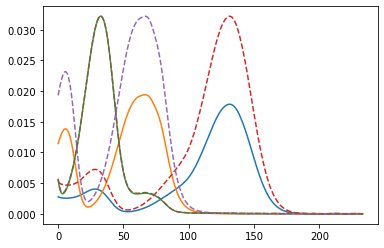

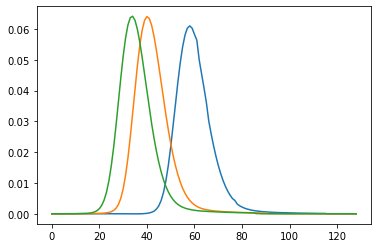

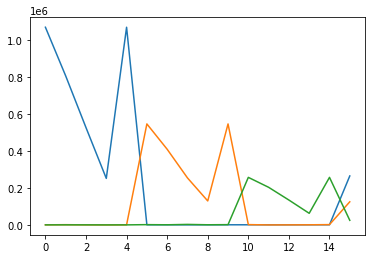

integral_array = [[1.06870218e+06 5.31931748e+02 2.00251253e+02]
 [8.05342505e+05 1.27806718e+03 3.49295043e+02]
 [5.26041707e+05 2.98829878e+02 2.76881149e+02]
 [2.51540324e+05 0.00000000e+00 5.63081714e+01]
 [1.06870218e+06 5.31931748e+02 2.00251253e+02]
 [6.96522626e+02 5.45975738e+05 1.48595797e+03]
 [9.01657592e+02 4.09080525e+05 7.09357119e+02]
 [3.35626348e+02 2.54231563e+05 2.74347140e+03]
 [6.84464441e+02 1.29578142e+05 7.77314869e+02]
 [6.96522626e+02 5.45975738e+05 1.48595797e+03]
 [7.12651045e+02 1.64883680e+03 2.57063636e+05]
 [6.53724246e+02 0.00000000e+00 2.03334497e+05]
 [6.37472807e+02 2.75770731e+02 1.34411423e+05]
 [6.50408513e+02 6.42268908e+02 6.27808366e+04]
 [7.12651045e+02 1.64883680e+03 2.57063636e+05]
 [2.64708711e+05 1.24892143e+05 2.48053376e+04]]
impure_peak_sum = 414406.19133618206
----- new PARAFAC decomposition with iteration offset -8 -----
new data tensor with boundaries (1445, 1574) and shape(5, 5, 5) built from ['4-dimethylaminobenzaldehyde', '4-meth

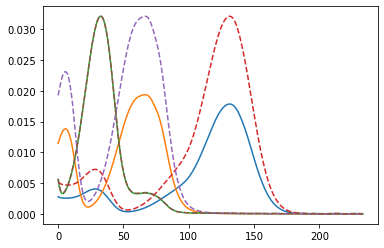

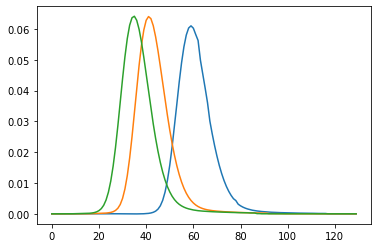

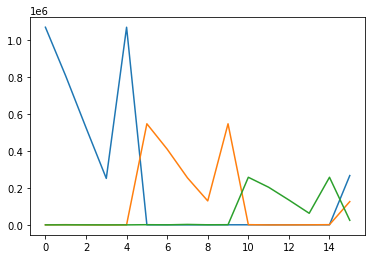

integral_array = [[1.06826607e+06 5.28671958e+02 1.81404914e+02]
 [8.05027164e+05 1.27847879e+03 3.34135782e+02]
 [5.25779680e+05 2.96619348e+02 2.67499757e+02]
 [2.51413110e+05 0.00000000e+00 5.17216702e+01]
 [1.06826607e+06 5.28671958e+02 1.81404914e+02]
 [6.73592037e+02 5.46513866e+05 1.19109102e+03]
 [8.84220860e+02 4.09477926e+05 4.87195369e+02]
 [3.24123367e+02 2.54498049e+05 2.61172681e+03]
 [6.78525995e+02 1.29707173e+05 7.08324968e+02]
 [6.73592037e+02 5.46513866e+05 1.19109102e+03]
 [7.22465519e+02 1.34483334e+03 2.57482721e+05]
 [6.55632393e+02 0.00000000e+00 2.03613092e+05]
 [6.42374289e+02 1.16071840e+02 1.34631330e+05]
 [6.52445265e+02 5.68266911e+02 6.28832903e+04]
 [7.22465519e+02 1.34483334e+03 2.57482721e+05]
 [2.66703754e+05 1.25901215e+05 2.48687157e+04]]
impure_peak_sum = 417473.6851771157
----- new PARAFAC decomposition with iteration offset -9 -----
new data tensor with boundaries (1445, 1575) and shape(5, 5, 5) built from ['4-dimethylaminobenzaldehyde', '4-metho

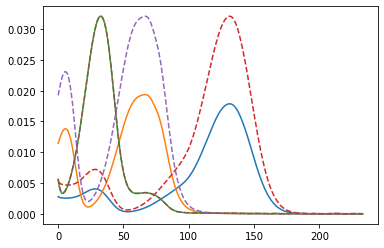

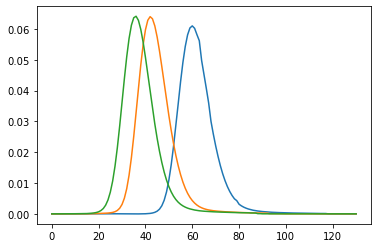

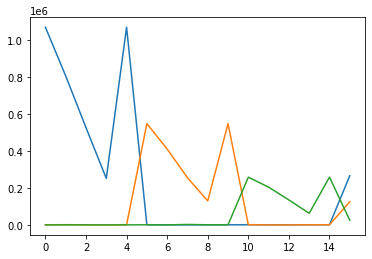

integral_array = [[1.06814629e+06 4.96789133e+02 1.60608447e+02]
 [8.04958464e+05 1.25930712e+03 3.17403207e+02]
 [5.25677500e+05 2.79655342e+02 2.57436222e+02]
 [2.51356880e+05 0.00000000e+00 4.50244406e+01]
 [1.06814629e+06 4.96789133e+02 1.60608447e+02]
 [6.18351649e+02 5.47360317e+05 8.21017888e+02]
 [8.42922122e+02 4.10106707e+05 2.08378270e+02]
 [2.97245462e+02 2.54907634e+05 2.44613256e+03]
 [6.65173607e+02 1.29909396e+05 6.21686166e+02]
 [6.18351649e+02 5.47360317e+05 8.21017888e+02]
 [7.30332088e+02 1.00975021e+03 2.57981886e+05]
 [6.55421176e+02 0.00000000e+00 2.03948932e+05]
 [6.45011027e+02 0.00000000e+00 1.34879753e+05]
 [6.54253213e+02 4.86937628e+02 6.30052951e+04]
 [7.30332088e+02 1.00975021e+03 2.57981886e+05]
 [2.65735376e+05 1.25402165e+05 2.52718844e+04]]
impure_peak_sum = 416409.42574869195
----- new PARAFAC decomposition with iteration offset -10 -----
new data tensor with boundaries (1445, 1576) and shape(5, 5, 5) built from ['4-dimethylaminobenzaldehyde', '4-met

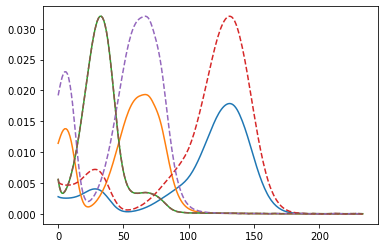

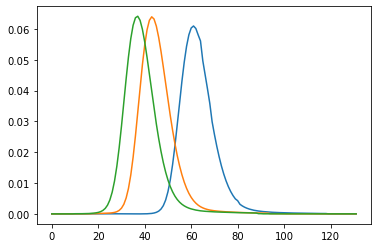

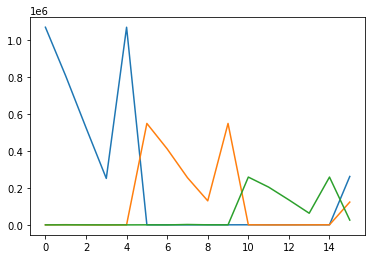

integral_array = [[1.06833865e+06 4.36648105e+02 1.38112149e+02]
 [8.05130040e+05 1.22058153e+03 2.99396701e+02]
 [5.25735254e+05 2.48176367e+02 2.46766028e+02]
 [2.51373039e+05 0.00000000e+00 3.62315439e+01]
 [1.06833865e+06 4.36648105e+02 1.38112149e+02]
 [5.33284308e+02 5.48436075e+05 4.34173259e+02]
 [7.79250924e+02 4.10880122e+05 0.00000000e+00]
 [2.56238140e+02 2.55421818e+05 2.27400180e+03]
 [6.44997985e+02 1.30165901e+05 5.31273768e+02]
 [5.33284308e+02 5.48436075e+05 4.34173259e+02]
 [7.36335703e+02 6.55174720e+02 2.58552617e+05]
 [6.53295303e+02 0.00000000e+00 2.04337271e+05]
 [6.43822551e+02 0.00000000e+00 1.35136958e+05]
 [6.55850482e+02 4.01100214e+02 6.31448129e+04]
 [7.36335703e+02 6.55174720e+02 2.58552617e+05]
 [2.61821269e+05 1.23435196e+05 2.60023714e+04]]
impure_peak_sum = 411258.83631639375
----- new PARAFAC decomposition with iteration offset -11 -----
new data tensor with boundaries (1445, 1577) and shape(5, 5, 5) built from ['4-dimethylaminobenzaldehyde', '4-met

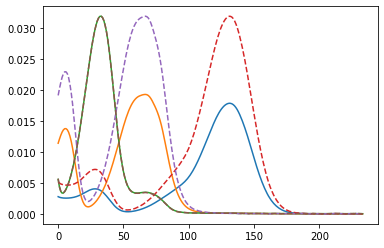

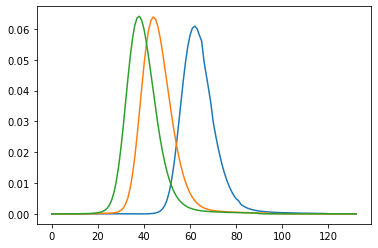

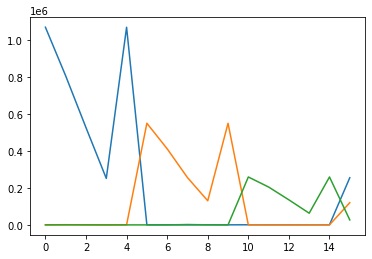

integral_array = [[1.06880828e+06 3.50791285e+02 1.14125059e+02]
 [8.05512098e+05 1.16377141e+03 2.80489307e+02]
 [5.25937346e+05 2.03527888e+02 2.35592869e+02]
 [2.51455905e+05 0.00000000e+00 2.54682296e+01]
 [1.06880828e+06 3.50791285e+02 1.14125059e+02]
 [4.23202664e+02 5.49635391e+05 9.32628549e+01]
 [6.96402971e+02 4.11687990e+05 0.00000000e+00]
 [2.03450298e+02 2.55989466e+05 2.12546591e+03]
 [6.19117053e+02 1.30451373e+05 4.52105685e+02]
 [4.23202664e+02 5.49635391e+05 9.32628549e+01]
 [7.40301928e+02 2.59227616e+02 2.59229325e+05]
 [6.48631445e+02 0.00000000e+00 2.04801156e+05]
 [6.41081949e+02 0.00000000e+00 1.35444177e+05]
 [6.57166045e+02 3.05367210e+02 6.33102968e+04]
 [7.40301928e+02 2.59227616e+02 2.59229325e+05]
 [2.55081585e+05 1.20108238e+05 2.70238381e+04]]
impure_peak_sum = 402213.6617393446
----- new PARAFAC decomposition with iteration offset 0 -----
new data tensor with boundaries (1582, 1701) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor 

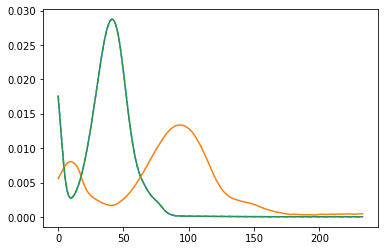

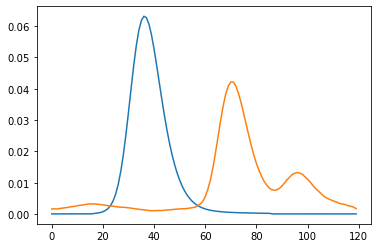

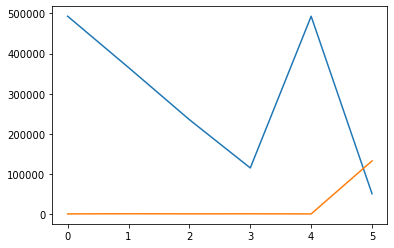

integral_array = [[493048.87842049   1314.29475466]
 [365479.00017514   1793.89867635]
 [235755.03354715   1490.929592  ]
 [115678.03921257   1601.96950219]
 [493048.87842049   1314.29475466]
 [ 51503.29414098 133251.79644239]]
impure_peak_sum = 184755.090583377
----- new PARAFAC decomposition with iteration offset -1 -----
new data tensor with boundaries (1582, 1702) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1702).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


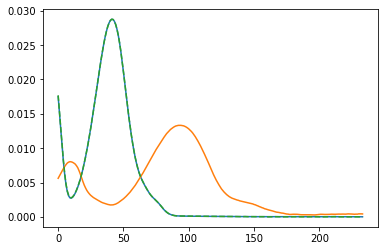

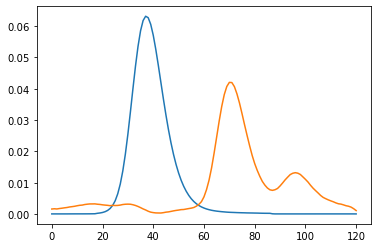

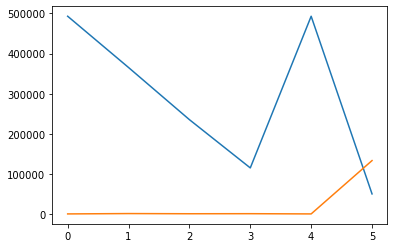

integral_array = [[493051.29085338   1200.55148728]
 [365488.34690064   2074.167988  ]
 [235759.39127363   1621.83440984]
 [115681.30700175   1771.67827405]
 [493051.29085338   1200.55148728]
 [ 50988.15467435 133918.49442406]]
impure_peak_sum = 184906.6490984091
----- new PARAFAC decomposition with iteration offset 1 -----
new data tensor with boundaries (1582, 1702) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1702).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


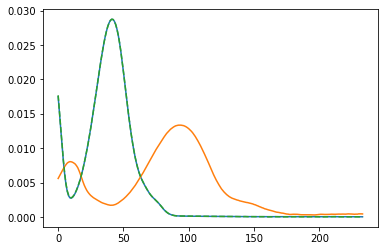

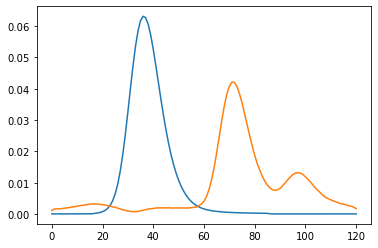

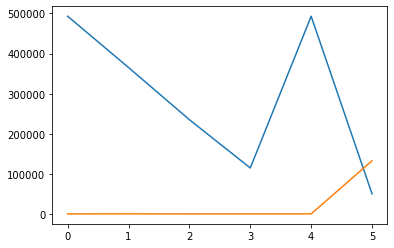

integral_array = [[493068.51034538   1445.9312673 ]
 [365485.47944634   1539.41550436]
 [235760.91247282   1373.03590738]
 [115679.58229484   1449.28868327]
 [493068.51034538   1445.9312673 ]
 [ 51342.59453519 133552.28075864]]
impure_peak_sum = 184894.87529382942
----- new PARAFAC decomposition with iteration offset -2 -----
new data tensor with boundaries (1582, 1703) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1703).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


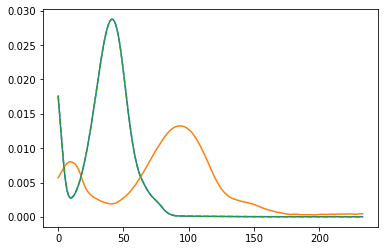

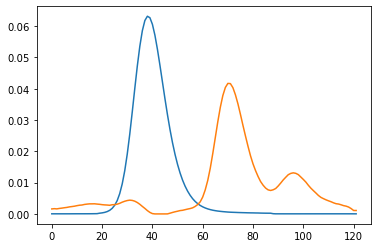

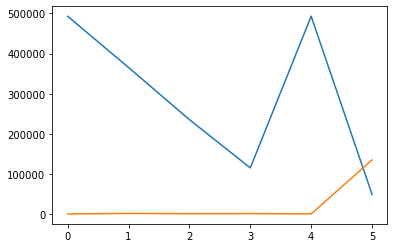

integral_array = [[493037.06802318   1105.08954078]
 [365483.35149915   2371.44285425]
 [235754.63015864   1762.07216191]
 [115679.30888768   1954.76186654]
 [493037.06802318   1105.08954078]
 [ 49772.6269447  135438.71475205]]
impure_peak_sum = 185211.34169674857
----- new PARAFAC decomposition with iteration offset 2 -----
new data tensor with boundaries (1582, 1703) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1703).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


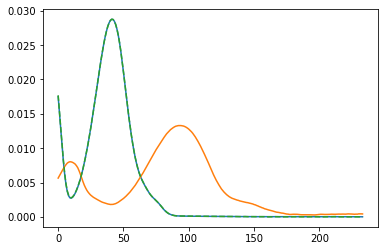

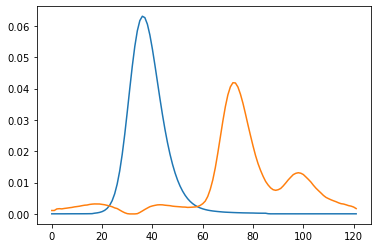

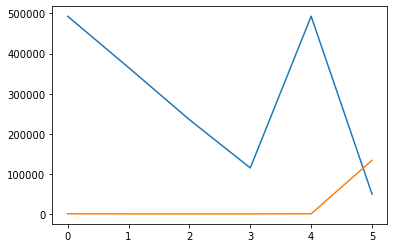

integral_array = [[493077.12467385   1594.60770812]
 [365484.47829807   1298.82540431]
 [235761.72978603   1260.5285715 ]
 [115678.60467838   1305.23134787]
 [493077.12467385   1594.60770812]
 [ 50496.5896013  134583.42789405]]
impure_peak_sum = 185080.01749535097
----- new PARAFAC decomposition with iteration offset -3 -----
new data tensor with boundaries (1582, 1704) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1704).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


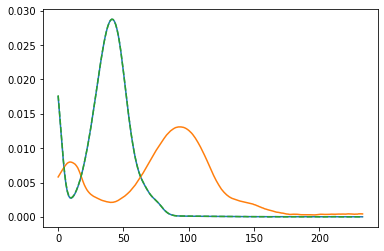

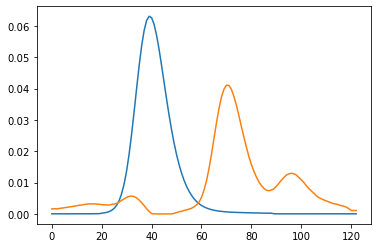

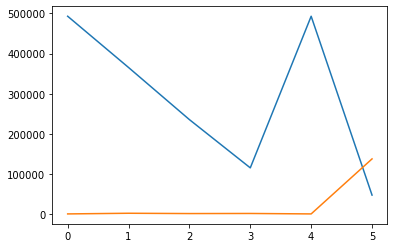

integral_array = [[492998.71647554   1035.09367317]
 [365456.78855584   2681.41435199]
 [235736.23167263   1912.91313246]
 [115669.16929619   2153.2481246 ]
 [492998.71647554   1035.09367317]
 [ 47867.08272309 137953.42973287]]
impure_peak_sum = 185820.51245595314
----- new PARAFAC decomposition with iteration offset 3 -----
new data tensor with boundaries (1582, 1704) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1704).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


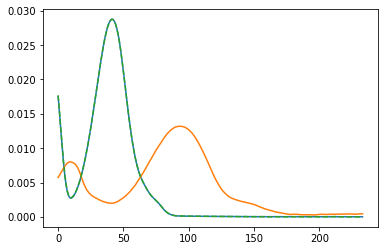

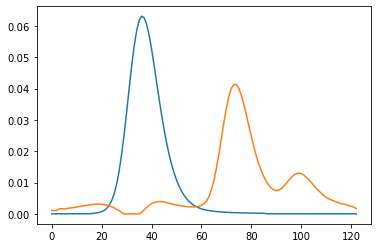

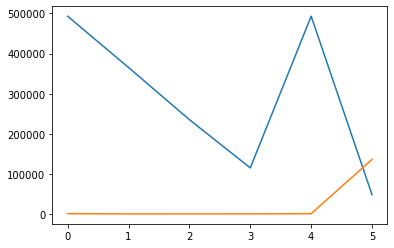

integral_array = [[493055.17940332   1736.01163215]
 [365461.80294467   1142.6518756 ]
 [235747.98582439   1184.51091062]
 [115669.99379933   1209.1574888 ]
 [493055.17940332   1736.01163215]
 [ 48903.77331482 136771.62073467]]
impure_peak_sum = 185675.39404948615
----- new PARAFAC decomposition with iteration offset -4 -----
new data tensor with boundaries (1582, 1705) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1705).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


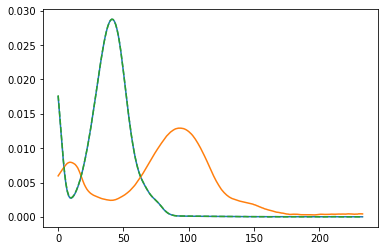

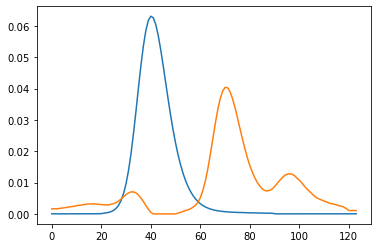

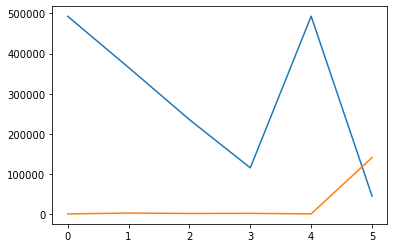

integral_array = [[492947.10354337    963.29279363]
 [365415.53487655   3046.62670965]
 [235709.0714123    2088.24966172]
 [115653.27877487   2383.48123468]
 [492947.10354337    963.29279363]
 [ 45399.53670238 141147.00658646]]
impure_peak_sum = 186546.543288839
----- new PARAFAC decomposition with iteration offset -5 -----
new data tensor with boundaries (1582, 1706) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1706).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


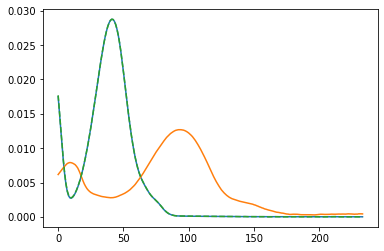

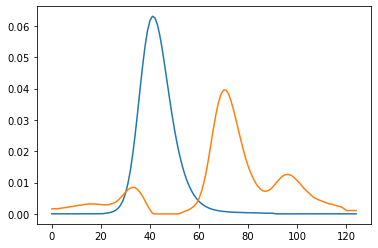

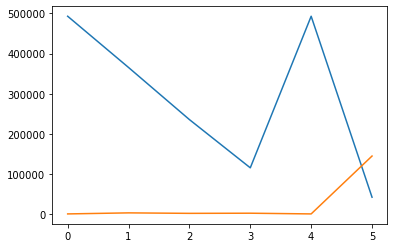

integral_array = [[492880.00813695    885.51847033]
 [365357.15217972   3477.705403  ]
 [235671.77300725   2291.59346165]
 [115630.75319894   2650.85825977]
 [492880.00813695    885.51847033]
 [ 42469.55484383 144951.19383809]]
impure_peak_sum = 187420.74868191706
----- new PARAFAC decomposition with iteration offset -6 -----
new data tensor with boundaries (1582, 1707) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1707).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


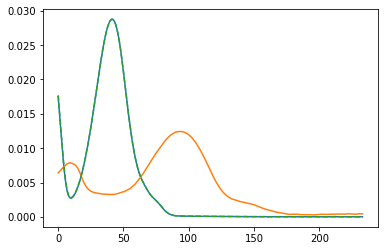

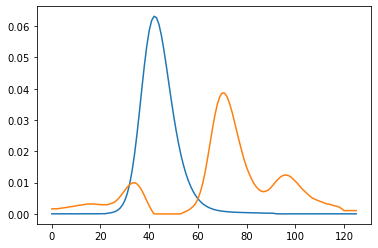

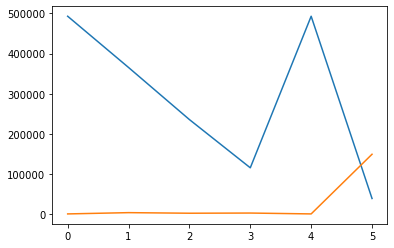

integral_array = [[492795.54059034    801.73936557]
 [365279.72521343   3974.52165199]
 [235623.19681687   2523.11901249]
 [115600.81699645   2955.83136154]
 [492795.54059034    801.73936557]
 [ 39178.82046432 149300.77704371]]
impure_peak_sum = 188479.59750802672
----- new PARAFAC decomposition with iteration offset -7 -----
new data tensor with boundaries (1582, 1708) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1708).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


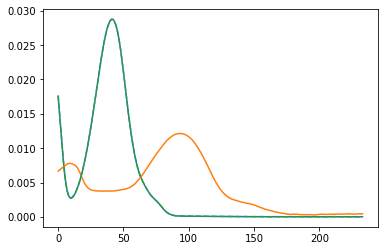

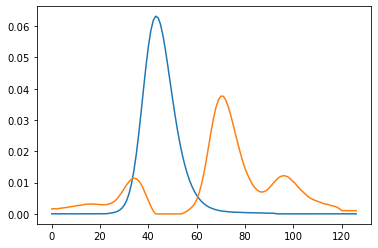

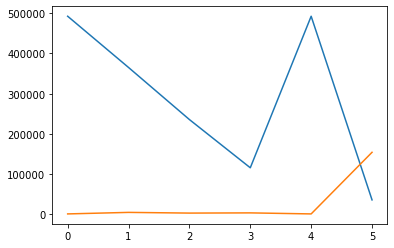

integral_array = [[492694.00524146    718.29751638]
 [365183.56189566   4520.88820486]
 [235563.52941003   2776.25318708]
 [115563.48878179   3289.94974352]
 [492694.00524146    718.29751638]
 [ 35635.8225968  154071.57847679]]
impure_peak_sum = 189707.40107359848
----- new PARAFAC decomposition with iteration offset -8 -----
new data tensor with boundaries (1582, 1709) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1709).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


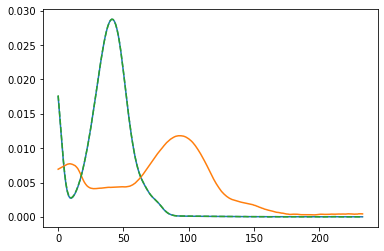

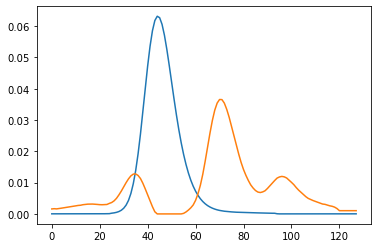

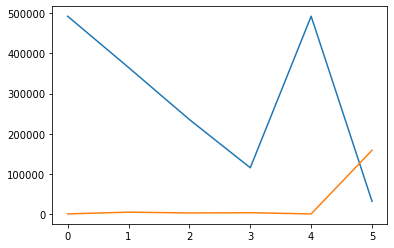

integral_array = [[492580.98536101    652.6247213 ]
 [365074.67364908   5071.93923388]
 [235496.41099206   3031.93822564]
 [115521.07525655   3629.10905156]
 [492580.98536101    652.6247213 ]
 [ 31973.88203487 159024.24525511]]
impure_peak_sum = 190998.12728998033
----- new PARAFAC decomposition with iteration offset -9 -----
new data tensor with boundaries (1582, 1710) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1710).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


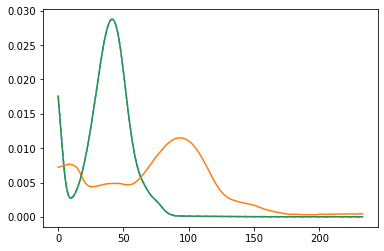

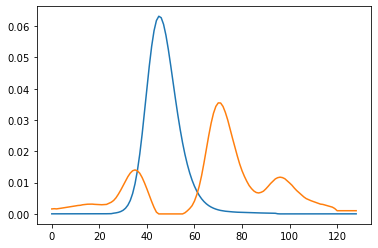

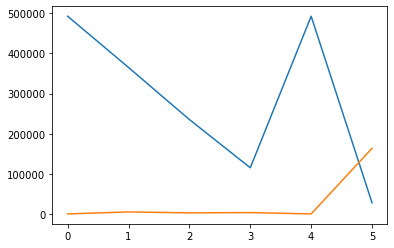

integral_array = [[492462.23124131    633.22056267]
 [364960.48266379   5557.99637929]
 [235426.10672025   3261.73581252]
 [115476.4399854    3937.96304344]
 [492462.23124131    633.22056267]
 [ 28310.66377955 163922.47244026]]
impure_peak_sum = 192233.13621981003
----- new PARAFAC decomposition with iteration offset -10 -----
new data tensor with boundaries (1582, 1711) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1711).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


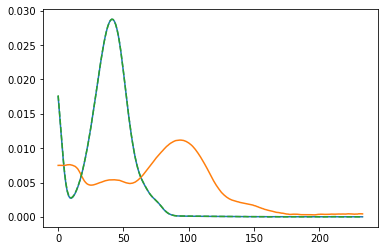

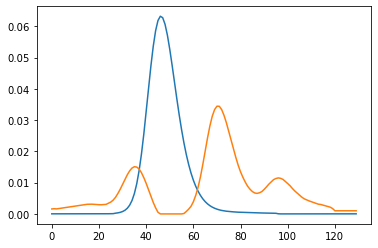

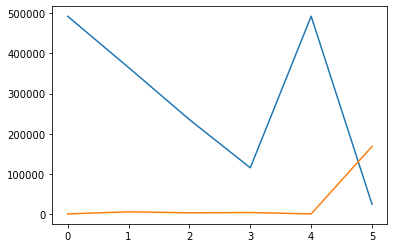

integral_array = [[492343.2292693     693.02635399]
 [364849.47939947   5896.38244914]
 [235357.28509898   3434.05462026]
 [115432.99914707   4174.49588623]
 [492343.2292693     693.02635399]
 [ 24752.82752372 168554.23148263]]
impure_peak_sum = 193307.05900634438
----- new PARAFAC decomposition with iteration offset -11 -----
new data tensor with boundaries (1582, 1712) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1712).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


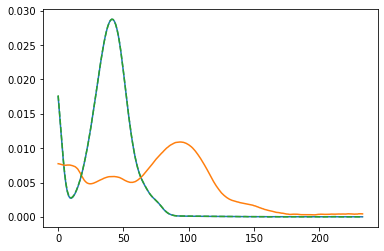

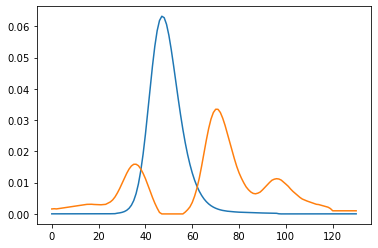

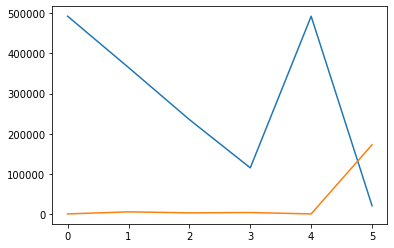

integral_array = [[492230.66572488    862.910267  ]
 [364751.86131169   6004.00292869]
 [235295.58413623   3516.02305474]
 [115394.90287976   4296.52801274]
 [492230.66572488    862.910267  ]
 [ 21396.93027172 172725.08967403]]
impure_peak_sum = 194122.0199457443
----- new PARAFAC decomposition with iteration offset -12 -----
new data tensor with boundaries (1582, 1713) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1713).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


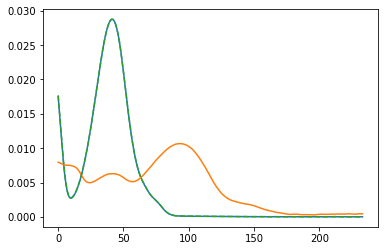

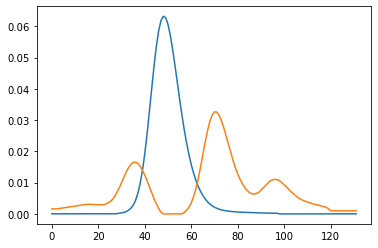

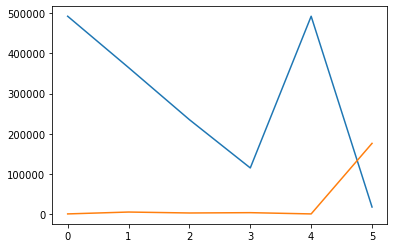

integral_array = [[492124.92630421   1163.32995896]
 [364671.32446847   5830.01032985]
 [235242.6534129    3488.41326516]
 [115363.63645249   4280.08676302]
 [492124.92630421   1163.32995896]
 [ 18285.73070815 176412.41621634]]
impure_peak_sum = 194698.14692448862
----- new PARAFAC decomposition with iteration offset -13 -----
new data tensor with boundaries (1582, 1714) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1714).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


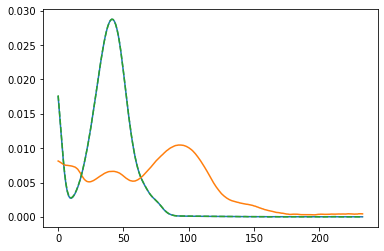

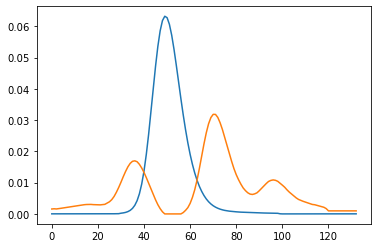

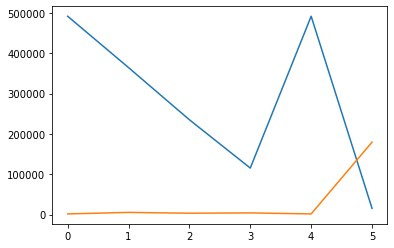

integral_array = [[492026.50027675   1597.16162429]
 [364610.21322922   5357.85955149]
 [235199.52444532   3344.64258084]
 [115339.9836963    4117.80563447]
 [492026.50027675   1597.16162429]
 [ 15436.6714797  179623.79280074]]
impure_peak_sum = 195060.46428044632
----- new PARAFAC decomposition with iteration offset -14 -----
new data tensor with boundaries (1582, 1715) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1715).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


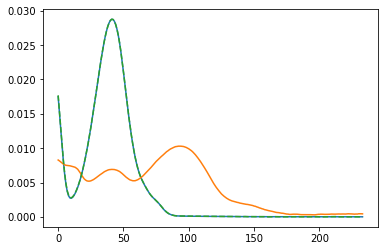

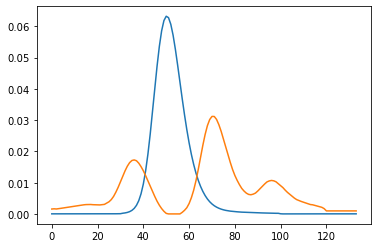

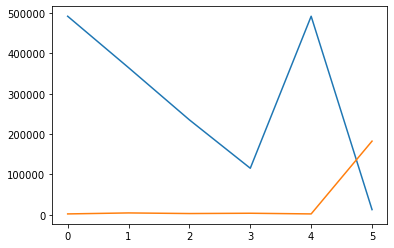

integral_array = [[491930.29451222   2157.19245972]
 [364565.15847157   4604.05851479]
 [235163.66273147   3092.81546928]
 [115322.23977072   3819.16088302]
 [491930.29451222   2157.19245972]
 [ 12809.53432572 182498.36317184]]
impure_peak_sum = 195307.89749755873
----- new PARAFAC decomposition with iteration offset -15 -----
new data tensor with boundaries (1582, 1716) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1716).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


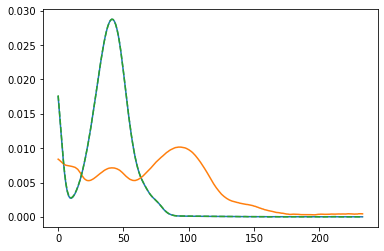

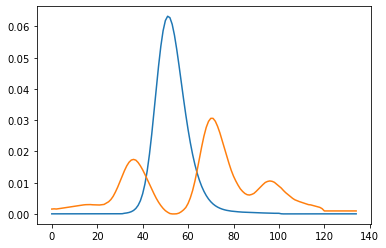

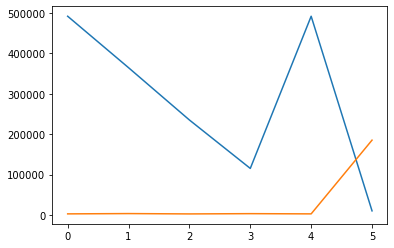

integral_array = [[491827.00163676   2844.83798782]
 [364531.66070768   3578.09013682]
 [235131.31129451   2737.72226144]
 [115307.99624115   3392.41638824]
 [491827.00163676   2844.83798782]
 [ 10310.00032286 185273.54532793]]
impure_peak_sum = 195583.54565078407
----- new PARAFAC decomposition with iteration offset -16 -----
new data tensor with boundaries (1582, 1717) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1717).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


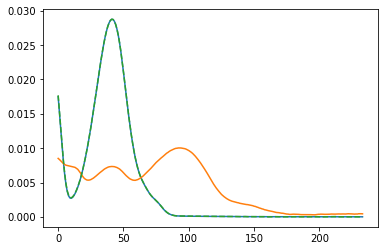

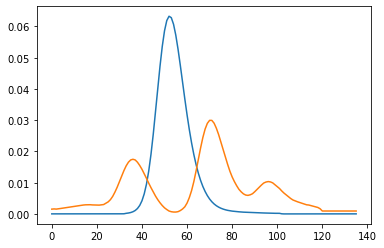

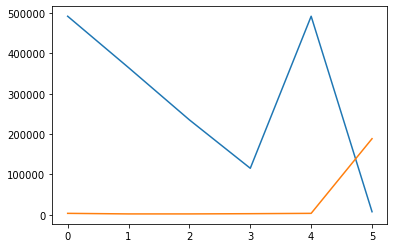

integral_array = [[491693.24913853   3679.58677434]
 [364500.43883465   2279.09397083]
 [235093.81707102   2287.2913252 ]
 [115292.1169814    2845.45604289]
 [491693.24913853   3679.58677434]
 [  7688.4871949  188492.42520199]]
impure_peak_sum = 196180.91239689308
----- new PARAFAC decomposition with iteration offset -17 -----
new data tensor with boundaries (1582, 1718) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1718).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


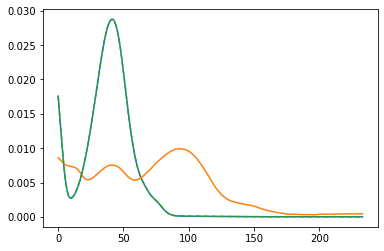

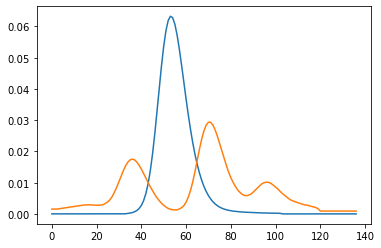

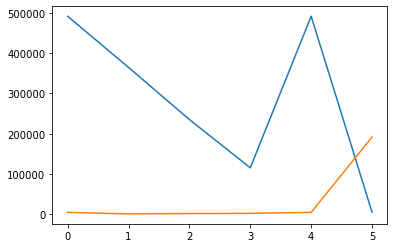

integral_array = [[491542.17478274   4598.20593735]
 [364489.1971391     800.3842526 ]
 [235061.94969283   1767.90423589]
 [115283.37066319   2211.88180331]
 [491542.17478274   4598.20593735]
 [  5136.45603092 191596.65193987]]
impure_peak_sum = 196733.10797078544
----- new PARAFAC decomposition with iteration offset -18 -----
new data tensor with boundaries (1582, 1719) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1719).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


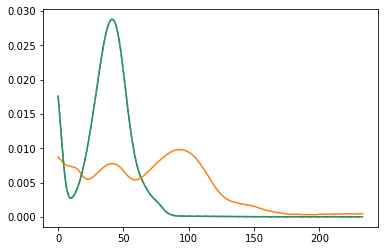

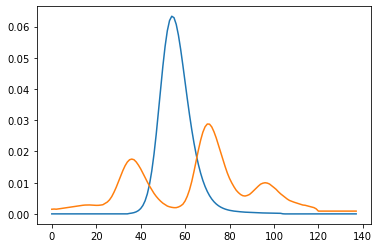

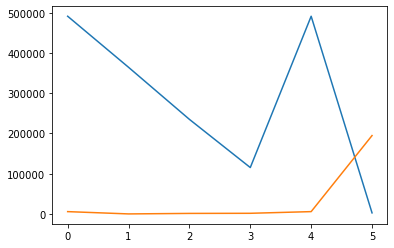

integral_array = [[491232.66979843   5703.58487852]
 [364364.21504345      0.        ]
 [234971.73661849   1259.23543426]
 [115251.44156644   1545.68613004]
 [491232.66979843   5703.58487852]
 [  2585.65289247 194708.86366163]]
impure_peak_sum = 197294.516554098
----- new PARAFAC decomposition with iteration offset -19 -----
new data tensor with boundaries (1582, 1720) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1720).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


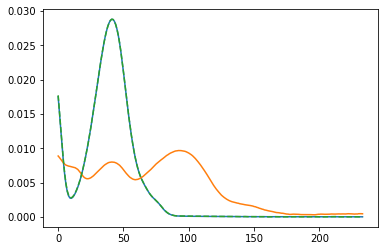

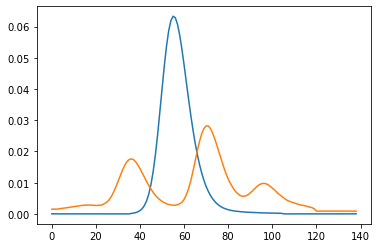

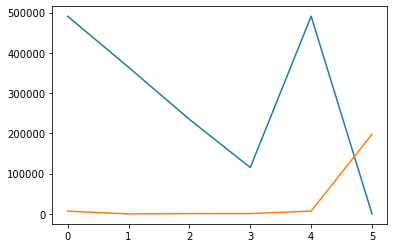

integral_array = [[490738.72823234   7013.981662  ]
 [364095.01717426      0.        ]
 [234815.92457977    781.11151195]
 [115194.68510738    861.92312668]
 [490738.72823234   7013.981662  ]
 [     0.         197880.45638265]]
impure_peak_sum = 197880.45638264576
----- new PARAFAC decomposition with iteration offset -20 -----
new data tensor with boundaries (1582, 1721) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1721).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


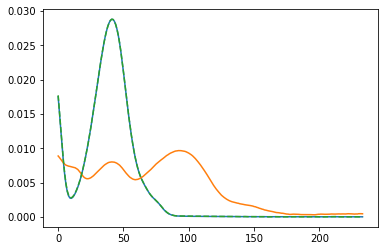

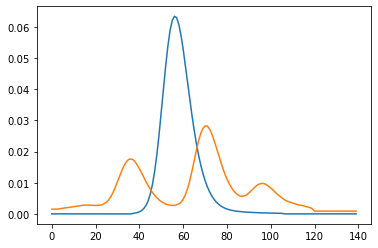

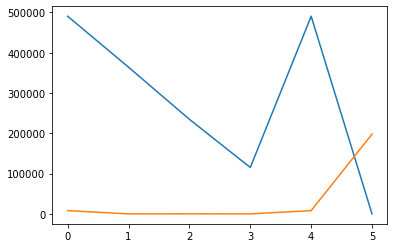

integral_array = [[4.90380320e+05 8.20509000e+03]
 [3.63914191e+05 0.00000000e+00]
 [2.34732634e+05 2.00895091e+02]
 [1.15185551e+05 6.79518238e+01]
 [4.90380320e+05 8.20509000e+03]
 [0.00000000e+00 1.97943894e+05]]
impure_peak_sum = 197943.89363610657
----- new PARAFAC decomposition with iteration offset -21 -----
new data tensor with boundaries (1582, 1722) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1722).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


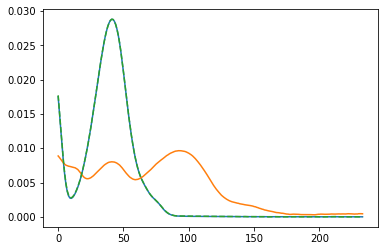

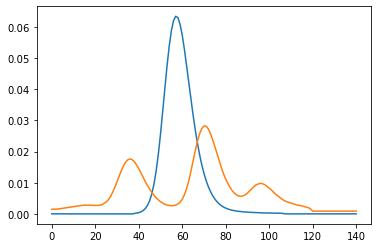

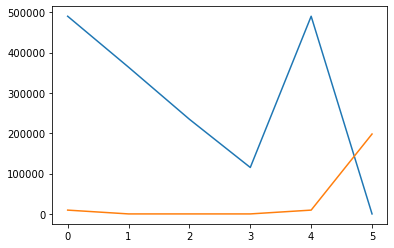

integral_array = [[489945.15222274   9433.58356378]
 [363695.21770222      0.        ]
 [234603.2911497       0.        ]
 [115121.02370497      0.        ]
 [489945.15222274   9433.58356378]
 [     0.         198033.48342909]]
impure_peak_sum = 198033.48342909254
----- new PARAFAC decomposition with iteration offset -22 -----
new data tensor with boundaries (1582, 1723) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1723).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


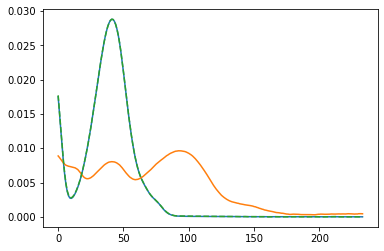

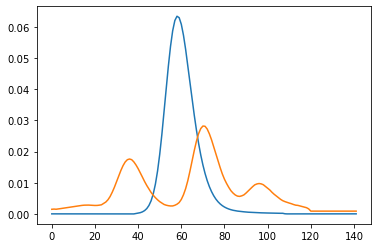

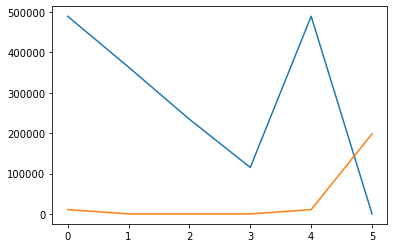

integral_array = [[489478.3389978   10650.3980971 ]
 [363471.7097359       0.        ]
 [234457.81178676      0.        ]
 [115050.72551844      0.        ]
 [489478.3389978   10650.3980971 ]
 [     0.         198115.8492597 ]]
impure_peak_sum = 198115.84925969978
----- new PARAFAC decomposition with iteration offset -23 -----
new data tensor with boundaries (1582, 1724) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1724).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


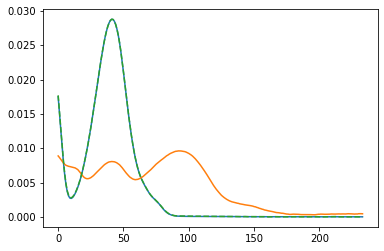

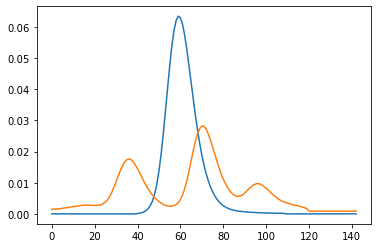

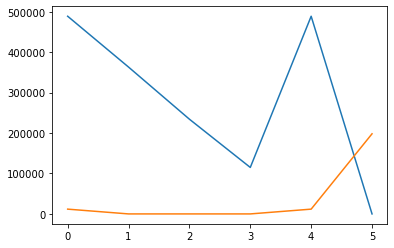

integral_array = [[488995.94977896  11821.60855919]
 [363255.23246069      0.        ]
 [234316.77602242      0.        ]
 [114982.70676393      0.        ]
 [488995.94977896  11821.60855919]
 [     0.         198188.21328917]]
impure_peak_sum = 198188.21328916846
----- new PARAFAC decomposition with iteration offset -24 -----
new data tensor with boundaries (1582, 1725) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1725).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


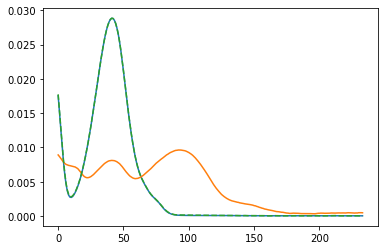

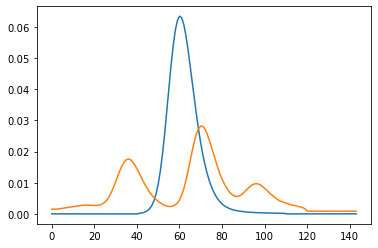

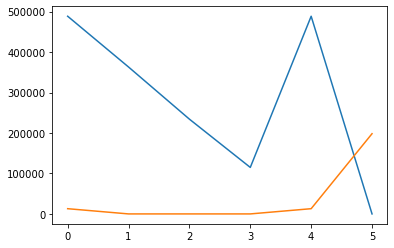

integral_array = [[488509.01629713  12909.58177862]
 [363051.32052658      0.        ]
 [234183.85335382      0.        ]
 [114918.67666637      0.        ]
 [488509.01629713  12909.58177862]
 [     0.         198249.66613512]]
impure_peak_sum = 198249.66613511645
----- new PARAFAC decomposition with iteration offset -25 -----
new data tensor with boundaries (1582, 1726) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1726).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


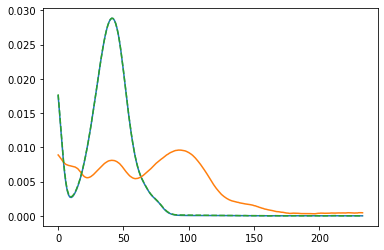

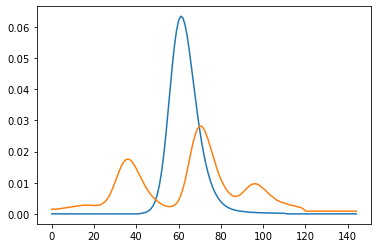

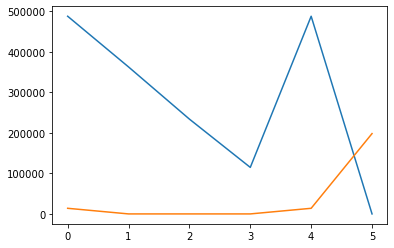

integral_array = [[488027.85743653  13877.2678358 ]
 [362862.91896091      0.        ]
 [234061.05595299      0.        ]
 [114859.51271113      0.        ]
 [488027.85743653  13877.2678358 ]
 [     0.         198313.54890982]]
impure_peak_sum = 198313.5489098156
----- new PARAFAC decomposition with iteration offset 0 -----
new data tensor with boundaries (1582, 1701) and shape(5,) built from ['4-chlorobenzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1582, 1701).
Compound used for PARAFAC data tensor: 4-chlorobenzaldehyde


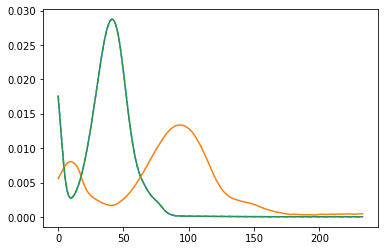

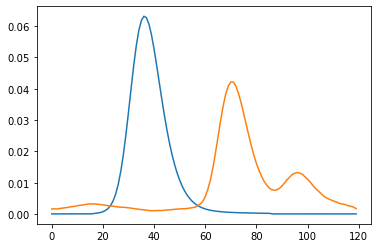

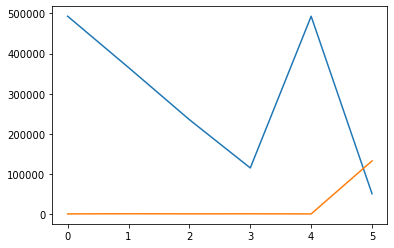

integral_array = [[493048.87842049   1314.29475466]
 [365479.00017514   1793.89867635]
 [235755.03354715   1490.929592  ]
 [115678.03921257   1601.96950219]
 [493048.87842049   1314.29475466]
 [ 51503.29414098 133251.79644239]]


In [11]:
knoev_campaign.process_all_hplc_input(settings)

In [12]:
knoev_report_path = r"/Users/haascp/Desktop/test_report"
report_hplc_input(knoev_campaign.hplc_runs, knoev_report_path)
report_chroms(knoev_campaign.chroms, knoev_campaign.settings, knoev_report_path)
report_runs(knoev_campaign.chroms, knoev_campaign.quali_comp_db, knoev_campaign.quant_comp_db, knoev_report_path)
report_parafac(knoev_campaign.chroms, knoev_report_path)
report_peaks(knoev_campaign.peak_db, knoev_report_path)
report_quali_comps(knoev_campaign.quali_comp_db, knoev_report_path)
report_quant_comps(knoev_campaign.quant_comp_db, knoev_report_path)

Report saved to .//Users/haascp/Desktop/test_report/report_hplc_input.html. To upload and share your report, create a free Datapane account by running `!datapane signup`.

Report saved to .//Users/haascp/Desktop/test_report/report_chroms.html. To upload and share your report, create a free Datapane account by running `!datapane signup`.

How is your experience of Datapane? Please take two minutes to answer our anonymous product survey <a href='https://bit.ly/3lWjRlr' target='_blank'>here</a>

Report saved to .//Users/haascp/Desktop/test_report/report_runs.html. To upload and share your report, create a free Datapane account by running `!datapane signup`.

Report saved to .//Users/haascp/Desktop/test_report/report_parafac.html. To upload and share your report, create a free Datapane account by running `!datapane signup`.

Report saved to .//Users/haascp/Desktop/test_report/report_peak_db.html. To upload and share your report, create a free Datapane account by running `!datapane signup`.

Report saved to .//Users/haascp/Desktop/test_report/report_quali_comp_db.html. To upload and share your report, create a free Datapane account by running `!datapane signup`.

Report saved to .//Users/haascp/Desktop/test_report/report_quant_comp_db.html. To upload and share your report, create a free Datapane account by running `!datapane signup`.

In [137]:
impure_peak = next(peak for peak in knoev_campaign.chroms[-1] if not peak.pure)

In [138]:
impure_peak

ProcessedPeak(left=1455, right=1553, maximum=1504, offset=0, dataset=<class 'mocca.dad_data.models.CompoundData'>, idx=4, saturation=False, pure=False, integral=454004.44717388216, istd=[], compound_id=None, concentration=None, is_compound=False)

In [139]:
from mocca.decomposition.iterative_parafac import get_all_non_comp_sum, get_all_comp_sum, get_total_integral_sum, get_impure_integral_sum

----- new PARAFAC decomposition with iteration offset -50 -----
new data tensor with boundaries (1445, 1616) and shape(5, 5, 5) built from ['4-dimethylaminobenzaldehyde', '4-methoxybenzaldehyde', 'benzaldehyde'].
PARAFAC data tensor has boundaries in the time axis of (1445, 1616).
Compound used for PARAFAC data tensor: 4-dimethylaminobenzaldehyde
Compound used for PARAFAC data tensor: 4-methoxybenzaldehyde
Compound used for PARAFAC data tensor: benzaldehyde


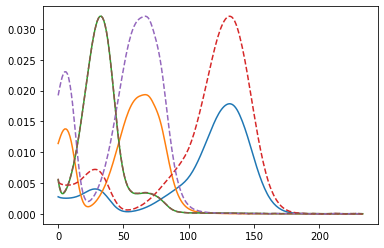

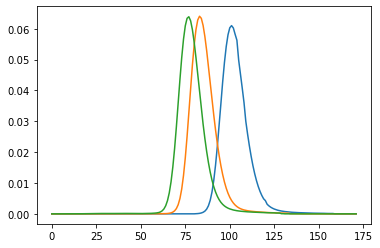

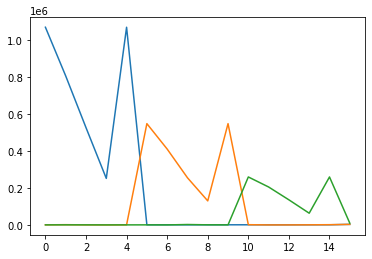

integral_array = [[1.06818913e+06 5.15009378e+02 1.85340823e+02]
 [8.04958560e+05 1.27094461e+03 3.38512423e+02]
 [5.25711082e+05 2.87523769e+02 2.70167131e+02]
 [2.51385849e+05 0.00000000e+00 5.06008262e+01]
 [1.06818913e+06 5.15009378e+02 1.85340823e+02]
 [6.40230611e+02 5.47265068e+05 2.83807105e+02]
 [8.58106730e+02 4.09974995e+05 0.00000000e+00]
 [3.08256008e+02 2.54845676e+05 2.20406966e+03]
 [6.70346690e+02 1.29884185e+05 4.97391004e+02]
 [6.40230611e+02 5.47265068e+05 2.83807105e+02]
 [6.99234178e+02 1.22017856e+03 2.59161746e+05]
 [6.34436528e+02 0.00000000e+00 2.04905401e+05]
 [6.30060065e+02 4.42322920e+01 1.35504760e+05]
 [6.46596417e+02 5.36512418e+02 6.32928354e+04]
 [6.99234178e+02 1.22017856e+03 2.59161746e+05]
 [3.06061831e+03 2.81987181e+03 9.51576472e+03]]
objective_val_non_comp = 16335.357878827295
objective_val_comp = 6529695.2205802305
objective_total_sum = 6561426.833296212
impure_peak_sum = 15396.254837155046
----- new PARAFAC decomposition with iteration offset

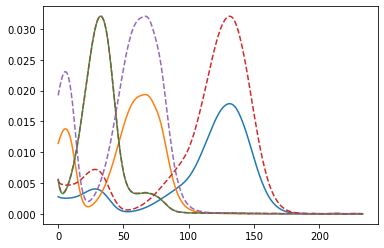

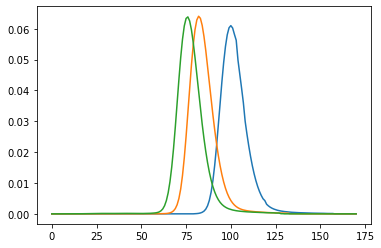

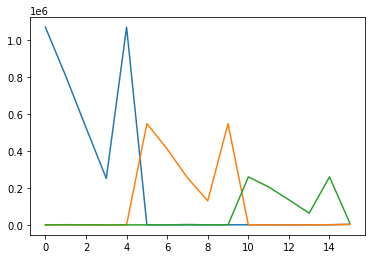

integral_array = [[1.06818320e+06 5.15030037e+02 1.83866570e+02]
 [8.04954090e+05 1.27066732e+03 3.38536584e+02]
 [5.25708159e+05 2.87483421e+02 2.69748002e+02]
 [2.51384456e+05 0.00000000e+00 4.98579604e+01]
 [1.06818320e+06 5.15030037e+02 1.83866570e+02]
 [6.39507198e+02 5.47247812e+05 2.85120979e+02]
 [8.57570030e+02 4.09962304e+05 0.00000000e+00]
 [3.07834597e+02 2.54837311e+05 2.20819219e+03]
 [6.70150158e+02 1.29879911e+05 4.98729411e+02]
 [6.39507198e+02 5.47247812e+05 2.85120979e+02]
 [6.88559494e+02 1.20443890e+03 2.59522967e+05]
 [6.25718435e+02 0.00000000e+00 2.05189236e+05]
 [6.24485914e+02 3.57421296e+01 1.35694477e+05]
 [6.43988529e+02 5.32499488e+02 6.33815194e+04]
 [6.88559494e+02 1.20443890e+03 2.59522967e+05]
 [3.24325558e+03 2.81993947e+03 1.08302803e+04]]
objective_val_non_comp = 16254.250523815503
objective_val_comp = 6530899.432032334
objective_total_sum = 6564047.157947654
impure_peak_sum = 16893.47539150532
----- new PARAFAC decomposition with iteration offset -

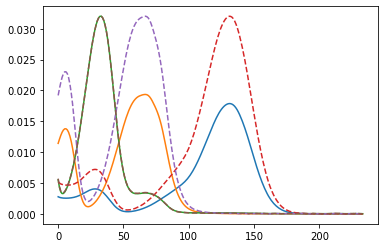

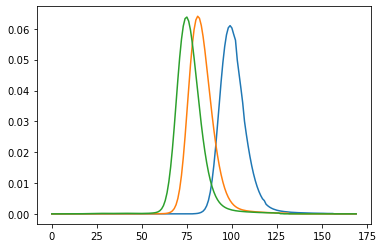

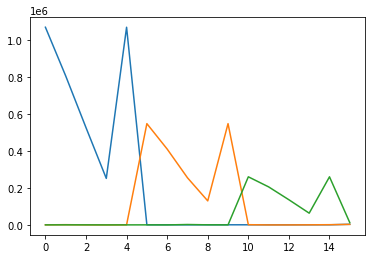

integral_array = [[1.06817887e+06 5.15055234e+02 1.82013134e+02]
 [8.04950816e+05 1.27031474e+03 3.38601774e+02]
 [5.25706016e+05 2.87441261e+02 2.69194423e+02]
 [2.51383438e+05 0.00000000e+00 4.88908897e+01]
 [1.06817887e+06 5.15055234e+02 1.82013134e+02]
 [6.38619713e+02 5.47232513e+05 2.86675367e+02]
 [8.56913961e+02 4.09951119e+05 0.00000000e+00]
 [3.07312085e+02 2.54829764e+05 2.21326742e+03]
 [6.69910284e+02 1.29876063e+05 5.00359214e+02]
 [6.38619713e+02 5.47232513e+05 2.86675367e+02]
 [6.74665715e+02 1.18416065e+03 2.59966732e+05]
 [6.14372628e+02 0.00000000e+00 2.05537774e+05]
 [6.17230672e+02 2.48106359e+01 1.35927561e+05]
 [6.40595373e+02 5.27345467e+02 6.34904685e+04]
 [6.74665715e+02 1.18416065e+03 2.59966732e+05]
 [3.44352781e+03 2.83271179e+03 1.23434404e+04]]
objective_val_non_comp = 16148.940458634508
objective_val_comp = 6532409.258559369
objective_total_sum = 6567177.879059764
impure_peak_sum = 18619.680041757583
----- new PARAFAC decomposition with iteration offset 

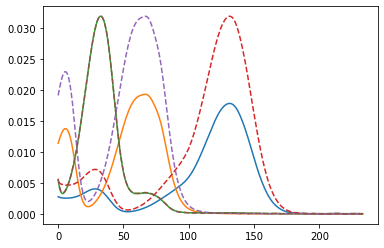

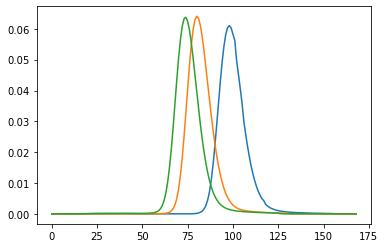

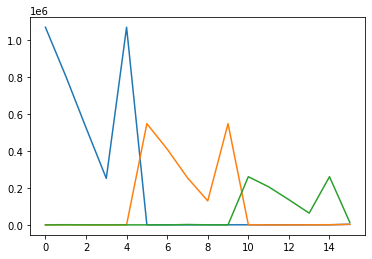

integral_array = [[1.06817647e+06 5.15077959e+02 1.79689407e+02]
 [8.04948992e+05 1.26986644e+03 3.38712687e+02]
 [5.25704820e+05 2.87394945e+02 2.68464218e+02]
 [2.51382876e+05 0.00000000e+00 4.76384004e+01]
 [1.06817647e+06 5.15077959e+02 1.79689407e+02]
 [6.37503071e+02 5.47220549e+05 2.88525201e+02]
 [8.56090687e+02 4.09942484e+05 0.00000000e+00]
 [3.06652019e+02 2.54823656e+05 2.21948574e+03]
 [6.69610458e+02 1.29872962e+05 5.02336258e+02]
 [6.37503071e+02 5.47220549e+05 2.88525201e+02]
 [6.56762934e+02 1.15829224e+03 2.60508070e+05]
 [5.99755061e+02 0.00000000e+00 2.05962736e+05]
 [6.07881286e+02 1.08776202e+01 1.36211902e+05]
 [6.36223978e+02 5.20789949e+02 6.36233689e+04]
 [6.56762934e+02 1.15829224e+03 2.60508070e+05]
 [3.66518566e+03 2.86788259e+03 1.40716246e+04]]
objective_val_non_comp = 16013.481359266872
objective_val_comp = 6534283.977894505
objective_total_sum = 6570902.152053975
impure_peak_sum = 20604.69280020139
----- new PARAFAC decomposition with iteration offset -

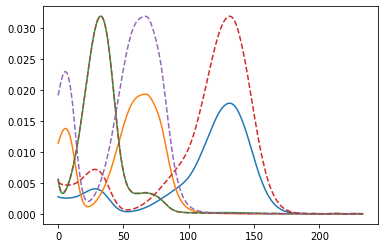

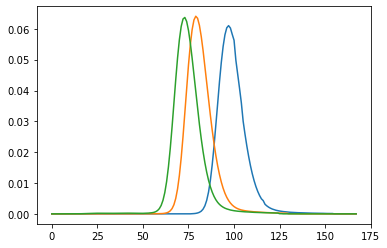

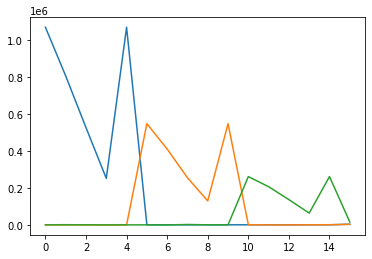

integral_array = [[1.06817639e+06 5.15087274e+02 1.76780896e+02]
 [8.04948908e+05 1.26929795e+03 3.38869734e+02]
 [5.25704760e+05 2.87339397e+02 2.67505955e+02]
 [2.51382860e+05 0.00000000e+00 4.60298173e+01]
 [1.06817639e+06 5.15087274e+02 1.76780896e+02]
 [6.36058845e+02 5.47213677e+05 2.90748422e+02]
 [8.55027536e+02 4.09937729e+05 0.00000000e+00]
 [3.05801704e+02 2.54819787e+05 2.22704957e+03]
 [6.69226023e+02 1.29871020e+05 5.04724257e+02]
 [6.36058845e+02 5.47213677e+05 2.90748422e+02]
 [6.33973068e+02 1.12603942e+03 2.61162405e+05]
 [5.81156791e+02 0.00000000e+00 2.06476198e+05]
 [5.95827759e+02 0.00000000e+00 1.36554115e+05]
 [6.30659839e+02 5.12635469e+02 6.37840063e+04]
 [6.33973068e+02 1.12603942e+03 2.61162405e+05]
 [3.91251339e+03 2.93733156e+03 1.60293754e+04]]
objective_val_non_comp = 15848.527646706087
objective_val_comp = 6536584.319856004
objective_total_sum = 6575312.067867789
impure_peak_sum = 22879.220365078792
----- new PARAFAC decomposition with iteration offset 

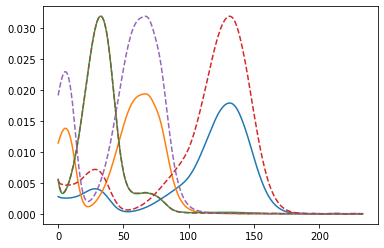

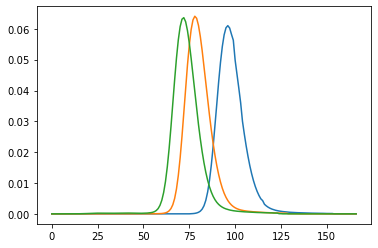

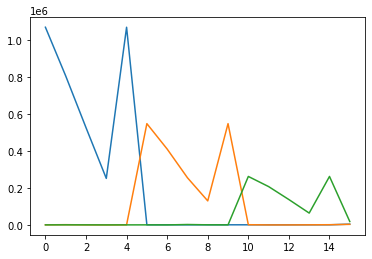

integral_array = [[1.06817909e+06 5.15070658e+02 1.73138768e+02]
 [8.04950922e+05 1.26859110e+03 3.39043285e+02]
 [5.25706070e+05 2.87273709e+02 2.66242706e+02]
 [2.51383503e+05 0.00000000e+00 4.39801581e+01]
 [1.06817909e+06 5.15070658e+02 1.73138768e+02]
 [6.34147270e+02 5.47213924e+05 2.93674223e+02]
 [8.53621848e+02 4.09938448e+05 0.00000000e+00]
 [3.04689346e+02 2.54819173e+05 2.23609774e+03]
 [6.68722535e+02 1.29870726e+05 5.07619209e+02]
 [6.34147270e+02 5.47213924e+05 2.93674223e+02]
 [6.05369419e+02 1.09333509e+03 2.61936406e+05]
 [5.57953815e+02 0.00000000e+00 2.07084542e+05]
 [5.80475902e+02 0.00000000e+00 1.36956617e+05]
 [6.23676566e+02 5.04329645e+02 6.39740232e+04]
 [6.05369419e+02 1.09333509e+03 2.61936406e+05]
 [4.19071440e+03 3.05544970e+03 1.82279690e+04]]
objective_val_non_comp = 15671.788412969652
objective_val_comp = 6539342.865661223
objective_total_sum = 6580488.78713042
impure_peak_sum = 25474.133056225386
----- new PARAFAC decomposition with iteration offset -

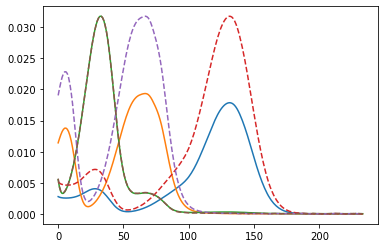

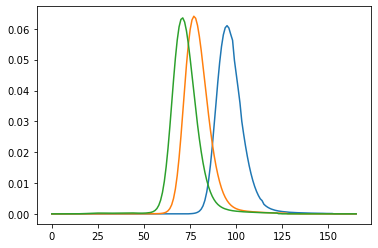

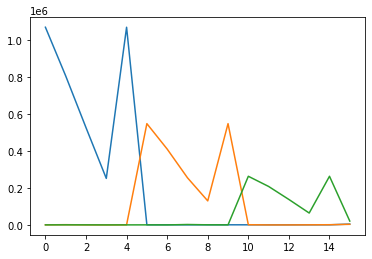

integral_array = [[1.06818525e+06 5.14990286e+02 1.68598897e+02]
 [8.04955537e+05 1.26770065e+03 3.39209883e+02]
 [5.25709078e+05 2.87168116e+02 2.64609628e+02]
 [2.51384961e+05 0.00000000e+00 4.14036116e+01]
 [1.06818525e+06 5.14990286e+02 1.68598897e+02]
 [6.31538034e+02 5.47224371e+05 2.96852732e+02]
 [8.51700557e+02 4.09946838e+05 0.00000000e+00]
 [3.03199597e+02 2.54823070e+05 2.24690447e+03]
 [6.68044037e+02 1.29872782e+05 5.11003133e+02]
 [6.31538034e+02 5.47224371e+05 2.96852732e+02]
 [5.70039047e+02 1.04744993e+03 2.62859203e+05]
 [5.29191513e+02 0.00000000e+00 2.07808416e+05]
 [5.61447459e+02 0.00000000e+00 1.37435577e+05]
 [6.15051243e+02 4.92764699e+02 6.42005407e+04]
 [5.70039047e+02 1.04744993e+03 2.62859203e+05]
 [4.50689483e+03 3.23705697e+03 2.06769352e+04]]
objective_val_non_comp = 15438.336445557963
objective_val_comp = 6542674.453573152
objective_total_sum = 6586533.677017002
impure_peak_sum = 28420.88699829345
----- new PARAFAC decomposition with iteration offset -

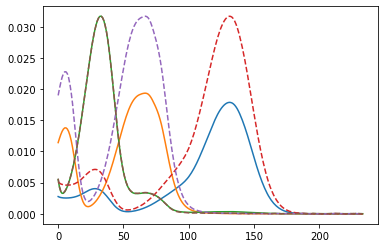

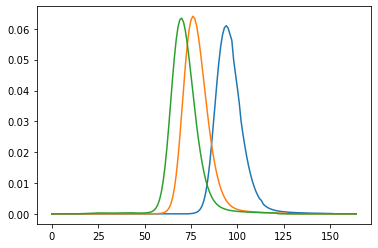

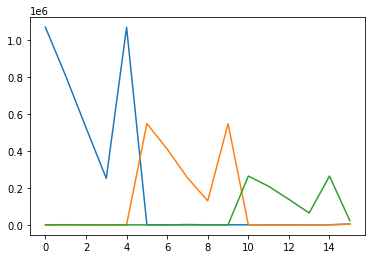

integral_array = [[1.06819577e+06 5.14806997e+02 1.62931811e+02]
 [8.04963428e+05 1.26660265e+03 3.39263541e+02]
 [5.25714224e+05 2.87005430e+02 2.62484291e+02]
 [2.51387444e+05 0.00000000e+00 3.82011764e+01]
 [1.06819577e+06 5.14806997e+02 1.62931811e+02]
 [6.27929968e+02 5.47248077e+05 3.00634270e+02]
 [8.49040251e+02 4.09965273e+05 0.00000000e+00]
 [3.01186495e+02 2.54832958e+05 2.25961931e+03]
 [6.67118280e+02 1.29877921e+05 5.14970120e+02]
 [6.27929968e+02 5.47248077e+05 3.00634270e+02]
 [5.27192517e+02 9.92715788e+02 2.63934454e+05]
 [4.94326074e+02 0.00000000e+00 2.08651454e+05]
 [5.38383166e+02 0.00000000e+00 1.37993398e+05]
 [6.04591233e+02 4.78999681e+02 6.44644645e+04]
 [5.27192517e+02 9.92715788e+02 2.63934454e+05]
 [4.87047025e+03 3.50007793e+03 2.33781739e+04]]
objective_val_non_comp = 15154.214397213507
objective_val_comp = 6546607.170246969
objective_total_sum = 6593510.106726089
impure_peak_sum = 31748.722081904747
----- new PARAFAC decomposition with iteration offset 

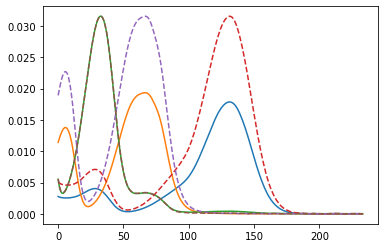

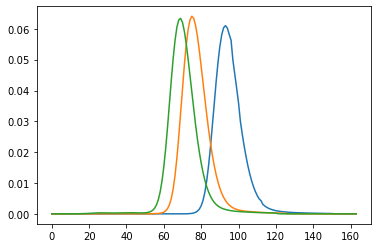

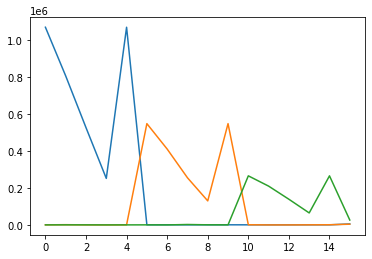

integral_array = [[1.06821170e+06 5.14457613e+02 1.55860582e+02]
 [8.04975389e+05 1.26526341e+03 3.39052821e+02]
 [5.25722026e+05 2.86747161e+02 2.59732025e+02]
 [2.51391200e+05 0.00000000e+00 3.42758249e+01]
 [1.06821170e+06 5.14457613e+02 1.55860582e+02]
 [6.22891965e+02 5.47289071e+05 3.05067395e+02]
 [8.45319057e+02 4.09996778e+05 0.00000000e+00]
 [2.98445218e+02 2.54850694e+05 2.27434825e+03]
 [6.65842703e+02 1.29887099e+05 5.19549110e+02]
 [6.22891965e+02 5.47289071e+05 3.05067395e+02]
 [4.76300864e+02 9.27937317e+02 2.65166691e+05]
 [4.52918905e+02 0.00000000e+00 2.09616898e+05]
 [5.10993303e+02 0.00000000e+00 1.38632238e+05]
 [5.92167550e+02 4.62749368e+02 6.47668984e+04]
 [4.76300864e+02 9.27937317e+02 2.65166691e+05]
 [5.29244944e+03 3.86395911e+03 2.63253127e+04]]
objective_val_non_comp = 14812.436180084083
objective_val_comp = 6551174.146615117
objective_total_sum = 6601468.304047473
impure_peak_sum = 35481.72125227297
----- new PARAFAC decomposition with iteration offset -

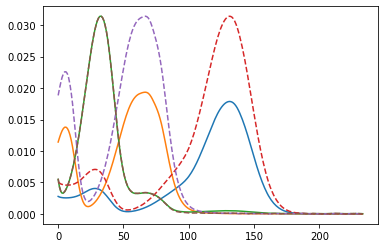

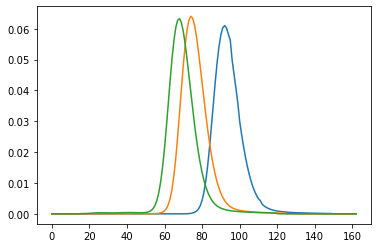

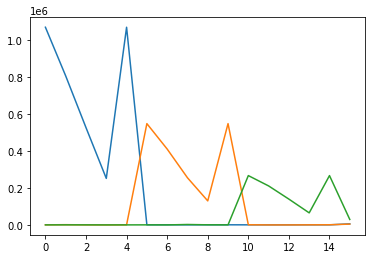

integral_array = [[1.06823443e+06 5.13847305e+02 1.47049562e+02]
 [8.04992472e+05 1.26365000e+03 3.38329917e+02]
 [5.25733170e+05 2.86337427e+02 2.56178463e+02]
 [2.51396554e+05 0.00000000e+00 2.95260832e+01]
 [1.06823443e+06 5.13847305e+02 1.47049562e+02]
 [6.15833886e+02 5.47352387e+05 3.10115538e+02]
 [8.40095503e+02 4.10045118e+05 0.00000000e+00]
 [2.94700584e+02 2.54878622e+05 2.29104872e+03]
 [6.64078060e+02 1.29901516e+05 5.24720194e+02]
 [6.15833886e+02 5.47352387e+05 3.10115538e+02]
 [4.17278500e+02 8.52425188e+02 2.66550101e+05]
 [4.04891931e+02 0.00000000e+00 2.10699838e+05]
 [4.79226796e+02 0.00000000e+00 1.39348868e+05]
 [5.77759718e+02 4.43858157e+02 6.51064044e+04]
 [4.17278500e+02 8.52425188e+02 2.66550101e+05]
 [5.78730542e+03 4.35052848e+03 2.94984384e+04]]
objective_val_non_comp = 14407.501510756918
objective_val_comp = 6556376.406150707
objective_total_sum = 6610420.179937298
impure_peak_sum = 39636.272275834264
----- new PARAFAC decomposition with iteration offset 

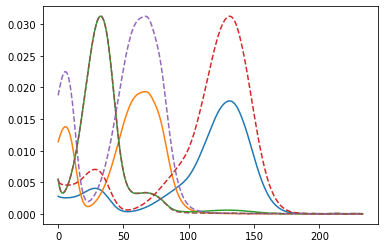

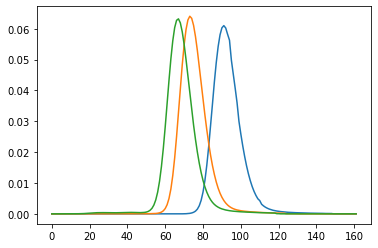

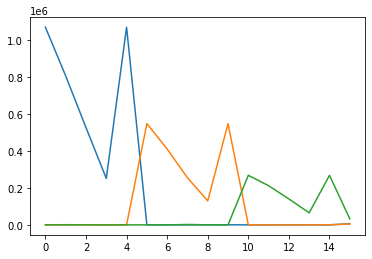

integral_array = [[1.06826573e+06 5.12837783e+02 1.36096517e+02]
 [8.05016005e+05 1.26172456e+03 3.36738001e+02]
 [5.25748521e+05 2.85692286e+02 2.51616159e+02]
 [2.51403916e+05 0.00000000e+00 2.38634558e+01]
 [1.06826573e+06 5.12837783e+02 1.36096517e+02]
 [6.05966230e+02 5.47444321e+05 3.15621991e+02]
 [8.32777941e+02 4.10114973e+05 0.00000000e+00]
 [2.89590036e+02 2.54919676e+05 2.30949440e+03]
 [6.61639288e+02 1.29922675e+05 5.30398274e+02]
 [6.05966230e+02 5.47444321e+05 3.15621991e+02]
 [3.50706610e+02 7.65188502e+02 2.68065731e+05]
 [3.50689291e+02 0.00000000e+00 2.11884837e+05]
 [4.43378176e+02 0.00000000e+00 1.40133097e+05]
 [5.61510371e+02 4.22104137e+02 6.54783158e+04]
 [3.50706610e+02 7.65188502e+02 2.68065731e+05]
 [6.37338941e+03 4.98463145e+03 3.28582634e+04]]
objective_val_non_comp = 13934.051639926483
objective_val_comp = 6562173.5807243
objective_total_sum = 6620323.916654406
impure_peak_sum = 44216.28429017983
----- new PARAFAC decomposition with iteration offset -39

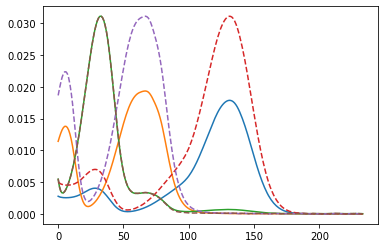

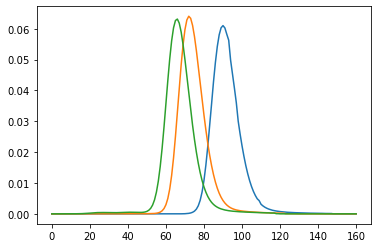

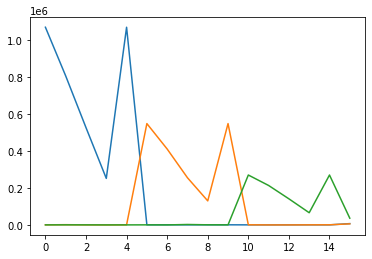

integral_array = [[1.06830776e+06 5.11227200e+02 1.22547050e+02]
 [8.05047632e+05 1.25944216e+03 3.33785489e+02]
 [5.25769147e+05 2.84690038e+02 2.45805994e+02]
 [2.51413790e+05 0.00000000e+00 1.72224963e+01]
 [1.06830776e+06 5.11227200e+02 1.22547050e+02]
 [5.92248631e+02 5.47572971e+05 3.21110224e+02]
 [8.22584826e+02 4.10212303e+05 0.00000000e+00]
 [2.82641685e+02 2.54977652e+05 2.32911791e+03]
 [6.58283786e+02 1.29952516e+05 5.36369535e+02]
 [5.92248631e+02 5.47572971e+05 3.21110224e+02]
 [2.78064171e+02 6.65517207e+02 2.69676985e+05]
 [2.91470105e+02 0.00000000e+00 2.13142488e+05]
 [4.04215146e+02 0.00000000e+00 1.40965497e+05]
 [5.43781712e+02 3.97342839e+02 6.58736334e+04]
 [2.78064171e+02 6.65517207e+02 2.69676985e+05]
 [7.07366071e+03 5.79522678e+03 3.63389582e+04]]
objective_val_non_comp = 13388.18268299921
objective_val_comp = 6568470.090753447
objective_total_sum = 6631066.119095351
impure_peak_sum = 49207.84565890358
----- new PARAFAC decomposition with iteration offset -3

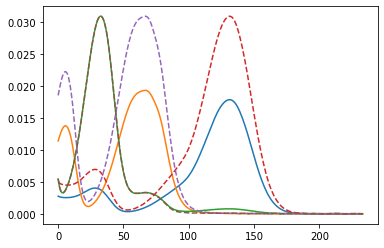

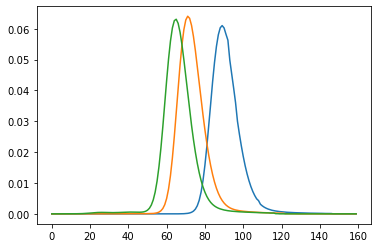

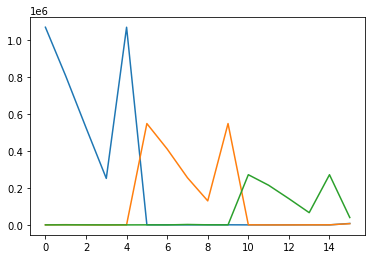

integral_array = [[1.06836328e+06 5.08719839e+02 1.05914714e+02]
 [8.05089433e+05 1.25673961e+03 3.28824271e+02]
 [5.25796401e+05 2.83159021e+02 2.38472942e+02]
 [2.51426813e+05 0.00000000e+00 9.57842175e+00]
 [1.06836328e+06 5.08719839e+02 1.05914714e+02]
 [5.73347751e+02 5.47748471e+05 3.25727649e+02]
 [8.08512606e+02 4.10344511e+05 0.00000000e+00]
 [2.73256271e+02 2.55057310e+05 2.34897011e+03]
 [6.53701984e+02 1.29993471e+05 5.42273614e+02]
 [5.73347751e+02 5.47748471e+05 3.25727649e+02]
 [2.01905439e+02 5.52432155e+02 2.71327954e+05]
 [2.29237872e+02 0.00000000e+00 2.14428005e+05]
 [3.63064383e+02 0.00000000e+00 1.41816462e+05]
 [5.25199068e+02 3.69373934e+02 6.62786130e+04]
 [2.01905439e+02 5.52432155e+02 2.71327954e+05]
 [7.91785404e+03 6.81587528e+03 3.98420758e+04]]
objective_val_non_comp = 12766.459204787341
objective_val_comp = 6575110.418962843
objective_total_sum = 6642452.6832498275
impure_peak_sum = 54575.80508219829
----- new PARAFAC decomposition with iteration offset 

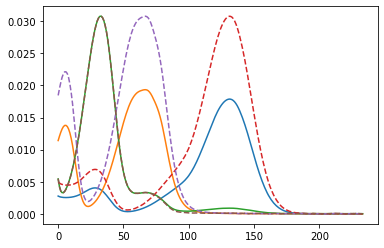

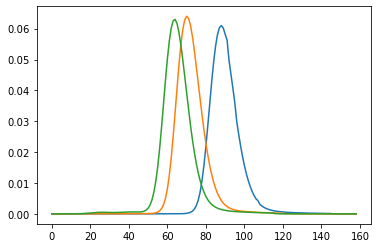

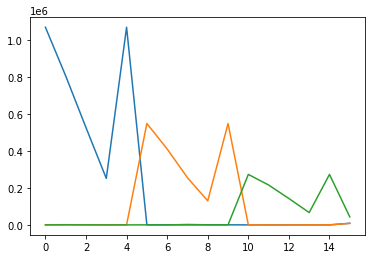

integral_array = [[1.06843544e+06 5.04901382e+02 8.57256317e+01]
 [8.05143812e+05 1.25349499e+03 3.21160921e+02]
 [5.25831839e+05 2.80847710e+02 2.29386699e+02]
 [2.51443714e+05 0.00000000e+00 9.68139905e-01]
 [1.06843544e+06 5.04901382e+02 8.57256317e+01]
 [5.47606428e+02 5.47983283e+05 3.28070787e+02]
 [7.89311381e+02 4.10520622e+05 0.00000000e+00]
 [2.60693584e+02 2.55164508e+05 2.36762737e+03]
 [6.47510091e+02 1.30048534e+05 5.47553317e+02]
 [5.47606428e+02 5.47983283e+05 3.28070787e+02]
 [1.25971333e+02 4.24724662e+02 2.72943580e+05]
 [1.66927170e+02 0.00000000e+00 2.15681421e+05]
 [3.21868958e+02 0.00000000e+00 1.42646339e+05]
 [5.06677920e+02 3.37949057e+02 6.66748118e+04]
 [1.25971333e+02 4.24724662e+02 2.72943580e+05]
 [8.94155588e+03 8.08494902e+03 4.32333187e+04]]
objective_val_non_comp = 12065.977754797797
objective_val_comp = 6581880.212687622
objective_total_sum = 6654206.014059508
impure_peak_sum = 60259.823617088085
----- new PARAFAC decomposition with iteration offset 

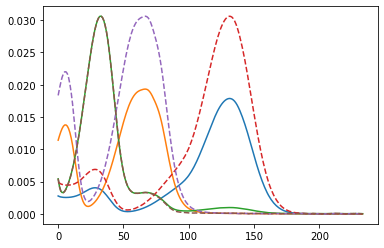

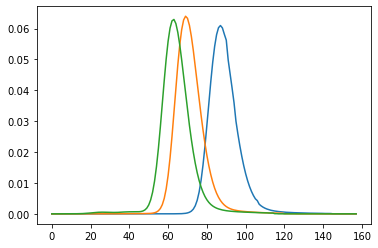

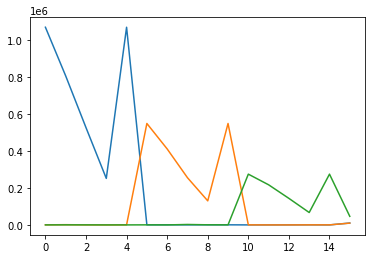

integral_array = [[1.06852774e+06 4.99192088e+02 6.16722464e+01]
 [8.05213417e+05 1.24952433e+03 3.10062307e+02]
 [5.25877171e+05 2.77425875e+02 2.18359592e+02]
 [2.51465161e+05 0.00000000e+00 0.00000000e+00]
 [1.06852774e+06 4.99192088e+02 6.16722464e+01]
 [5.13053557e+02 5.48292176e+05 3.25910962e+02]
 [7.63490802e+02 4.10751199e+05 0.00000000e+00]
 [2.44075135e+02 2.55306203e+05 2.38309878e+03]
 [6.39252024e+02 1.30121257e+05 5.51403380e+02]
 [5.13053557e+02 5.48292176e+05 3.25910962e+02]
 [5.49963486e+01 2.81060502e+02 2.74434076e+05]
 [1.08250186e+02 0.00000000e+00 2.16831181e+05]
 [2.83087005e+02 0.00000000e+00 1.43407790e+05]
 [4.89376628e+02 3.02793837e+02 6.70401759e+04]
 [5.49963486e+01 2.81060502e+02 2.74434076e+05]
 [1.01884949e+04 9.64397797e+03 4.63465634e+04]]
objective_val_non_comp = 11291.971288285902
objective_val_comp = 6588521.541970746
objective_total_sum = 6665992.549507989
impure_peak_sum = 66179.0362489572
----- new PARAFAC decomposition with iteration offset -3

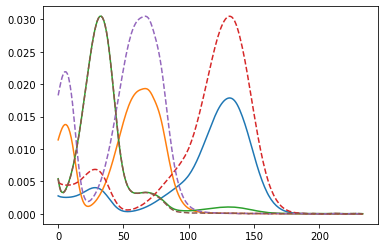

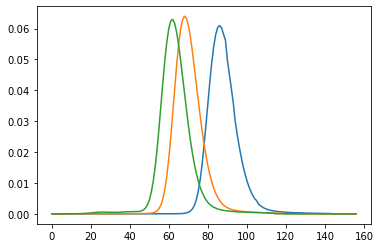

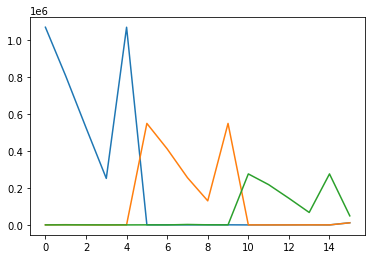

integral_array = [[1.06864470e+06 4.90768139e+02 3.35991482e+01]
 [8.05301693e+05 1.24449594e+03 2.94813458e+02]
 [5.25934617e+05 2.72441676e+02 2.05265086e+02]
 [2.51492286e+05 0.00000000e+00 0.00000000e+00]
 [1.06864470e+06 4.90768139e+02 3.35991482e+01]
 [4.67513788e+02 5.48691204e+05 3.16220633e+02]
 [7.29403051e+02 4.11047580e+05 0.00000000e+00]
 [2.22433588e+02 2.55489965e+05 2.39291753e+03]
 [6.28425780e+02 1.30215501e+05 5.52801836e+02]
 [4.67513788e+02 5.48691204e+05 3.16220633e+02]
 [0.00000000e+00 1.21005456e+02 2.75702208e+05]
 [5.75546616e+01 0.00000000e+00 2.17800260e+05]
 [2.49598321e+02 0.00000000e+00 1.44049830e+05]
 [4.74647840e+02 2.63876702e+02 6.73508433e+04]
 [0.00000000e+00 1.21005456e+02 2.75702208e+05]
 [1.17130047e+04 1.15338279e+04 4.89976833e+04]]
objective_val_non_comp = 10446.889794331619
objective_val_comp = 6594758.794773126
objective_total_sum = 6677450.200509172
impure_peak_sum = 72244.51594171372
----- new PARAFAC decomposition with iteration offset -

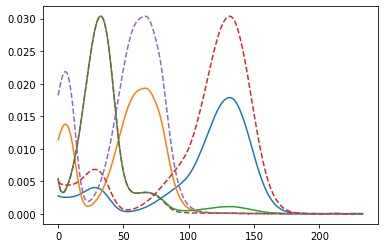

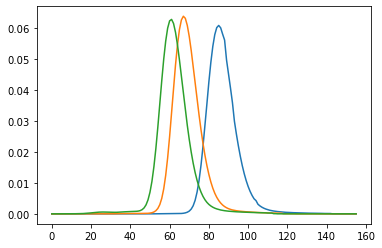

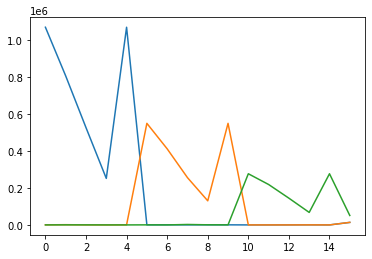

integral_array = [[1.06879074e+06 4.78564634e+02 1.76959828e+00]
 [8.05412023e+05 1.23789240e+03 2.75016297e+02]
 [5.26006339e+05 2.65337879e+02 1.90180809e+02]
 [2.51526102e+05 0.00000000e+00 0.00000000e+00]
 [1.06879074e+06 4.78564634e+02 1.76959828e+00]
 [4.08997252e+02 5.49191961e+05 2.98351189e+02]
 [6.85551221e+02 4.11418315e+05 0.00000000e+00]
 [1.94897181e+02 2.55721557e+05 2.39518603e+03]
 [6.14575403e+02 1.30334113e+05 5.51213422e+02]
 [4.08997252e+02 5.49191961e+05 2.98351189e+02]
 [0.00000000e+00 0.00000000e+00 2.76619189e+05]
 [2.03959734e+01 0.00000000e+00 2.18498152e+05]
 [2.25083133e+02 0.00000000e+00 1.44512488e+05]
 [4.64104594e+02 2.26267247e+02 6.75774185e+04]
 [0.00000000e+00 0.00000000e+00 2.76619189e+05]
 [1.35779220e+04 1.37926635e+04 5.10024603e+04]]
objective_val_non_comp = 9721.066938471915
objective_val_comp = 6600210.288693007
objective_total_sum = 6688304.401403443
impure_peak_sum = 78373.04577196442
----- new PARAFAC decomposition with iteration offset -3

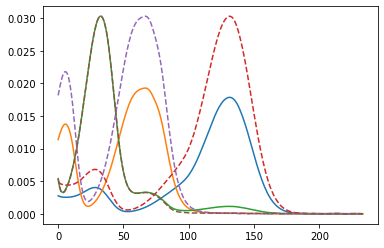

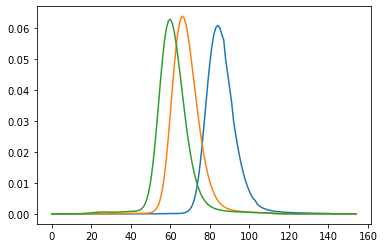

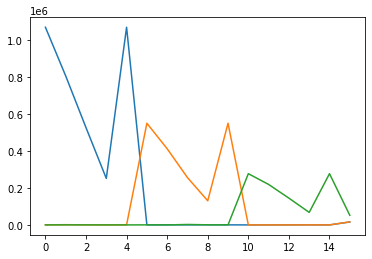

integral_array = [[1.06896508e+06 4.51075231e+02 0.00000000e+00]
 [8.05544042e+05 1.22903479e+03 2.51468288e+02]
 [5.26092035e+05 2.55468263e+02 1.73909325e+02]
 [2.51566423e+05 0.00000000e+00 0.00000000e+00]
 [1.06896508e+06 4.51075231e+02 0.00000000e+00]
 [3.35631155e+02 5.49814655e+05 2.61549293e+02]
 [6.30481622e+02 4.11875948e+05 0.00000000e+00]
 [1.60604174e+02 2.56011016e+05 2.38314203e+03]
 [5.97259973e+02 1.30482021e+05 5.43724226e+02]
 [3.35631155e+02 5.49814655e+05 2.61549293e+02]
 [0.00000000e+00 0.00000000e+00 2.77068841e+05]
 [0.00000000e+00 0.00000000e+00 2.18849423e+05]
 [2.11108454e+02 0.00000000e+00 1.44745707e+05]
 [4.58268642e+02 1.99456050e+02 6.76939638e+04]
 [0.00000000e+00 0.00000000e+00 2.77068841e+05]
 [1.58523211e+04 1.64474041e+04 5.22149355e+04]]
objective_val_non_comp = 9190.437194285378
objective_val_comp = 6604557.723927591
objective_total_sum = 6698262.821840778
impure_peak_sum = 84514.66071890181
----- new PARAFAC decomposition with iteration offset -3

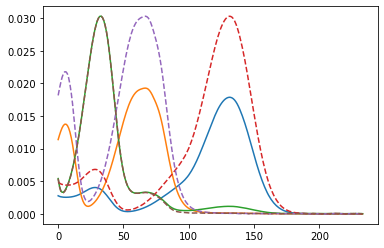

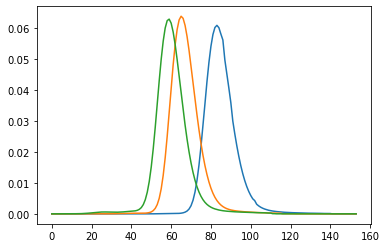

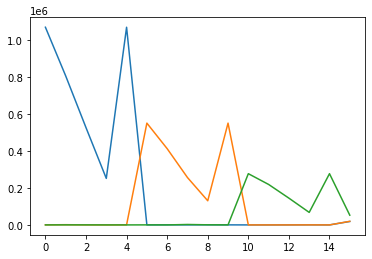

integral_array = [[1.06917815e+06 4.15605200e+02 0.00000000e+00]
 [8.05705565e+05 1.21672220e+03 2.24043328e+02]
 [5.26196710e+05 2.41946822e+02 1.56541649e+02]
 [2.51615585e+05 0.00000000e+00 0.00000000e+00]
 [1.06917815e+06 4.15605200e+02 0.00000000e+00]
 [2.46586687e+02 5.50559504e+05 2.05282925e+02]
 [5.63579656e+02 4.12420490e+05 0.00000000e+00]
 [1.19175338e+02 2.56357791e+05 2.35763334e+03]
 [5.76294505e+02 1.30659174e+05 5.30329957e+02]
 [2.46586687e+02 5.50559504e+05 2.05282925e+02]
 [0.00000000e+00 0.00000000e+00 2.77102286e+05]
 [0.00000000e+00 0.00000000e+00 2.18871365e+05]
 [2.08144891e+02 0.00000000e+00 1.44760926e+05]
 [4.57636311e+02 1.71929970e+02 6.77085680e+04]
 [0.00000000e+00 0.00000000e+00 2.77102286e+05]
 [1.86193326e+04 1.94838574e+04 5.25848195e+04]]
objective_val_non_comp = 8558.927592043581
objective_val_comp = 6607976.058448468
objective_total_sum = 6707222.995556319
impure_peak_sum = 90688.0095158068
----- new PARAFAC decomposition with iteration offset -31

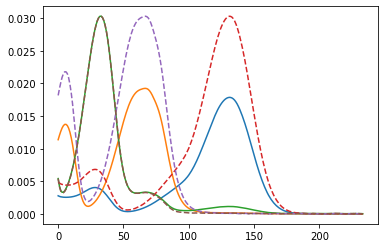

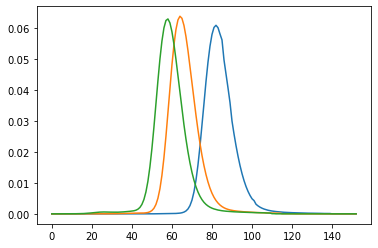

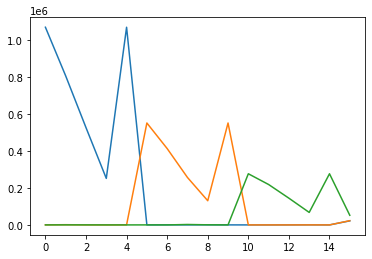

integral_array = [[1.06943527e+06 3.71347417e+02 0.00000000e+00]
 [8.05900679e+05 1.19960868e+03 1.93740521e+02]
 [5.26322899e+05 2.23935236e+02 1.38736873e+02]
 [2.51674724e+05 0.00000000e+00 0.00000000e+00]
 [1.06943527e+06 3.71347417e+02 0.00000000e+00]
 [1.42597915e+02 5.51418119e+05 1.27546082e+02]
 [4.85403574e+02 4.13045062e+05 0.00000000e+00]
 [7.09341345e+01 2.56757979e+05 2.31790609e+03]
 [5.51855991e+02 1.30863574e+05 5.10598576e+02]
 [1.42597915e+02 5.51418119e+05 1.27546082e+02]
 [0.00000000e+00 0.00000000e+00 2.76732000e+05]
 [6.21326991e+00 0.00000000e+00 2.18574654e+05]
 [2.16070196e+02 0.00000000e+00 1.44565053e+05]
 [4.62138683e+02 1.44679791e+02 6.76240799e+04]
 [0.00000000e+00 0.00000000e+00 2.76732000e+05]
 [2.19692289e+04 2.28695385e+04 5.21382397e+04]]
objective_val_non_comp = 7804.8044363045055
objective_val_comp = 6610499.475784429
objective_total_sum = 6715281.287386064
impure_peak_sum = 96977.00716532997
----- new PARAFAC decomposition with iteration offset -

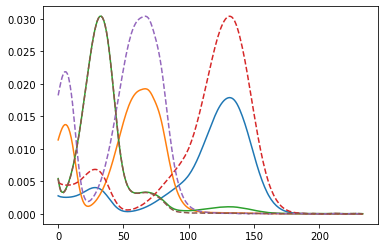

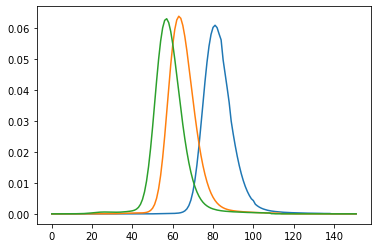

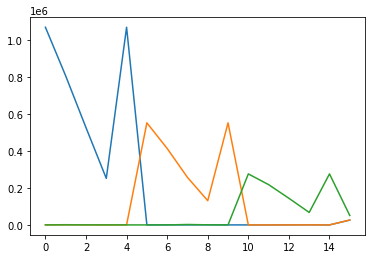

integral_array = [[1.06974024e+06 3.17144972e+02 0.00000000e+00]
 [8.06132406e+05 1.17621731e+03 1.62123275e+02]
 [5.26472396e+05 2.00672075e+02 1.21353437e+02]
 [2.51744604e+05 0.00000000e+00 0.00000000e+00]
 [1.06974024e+06 3.17144972e+02 0.00000000e+00]
 [2.62583394e+01 5.52368246e+05 2.81859488e+01]
 [3.97922179e+02 4.13732783e+05 0.00000000e+00]
 [1.70485817e+01 2.57201167e+05 2.26453072e+03]
 [5.24557644e+02 1.31089905e+05 4.84664631e+02]
 [2.62583394e+01 5.52368246e+05 2.81859488e+01]
 [0.00000000e+00 0.00000000e+00 2.76008564e+05]
 [3.28318902e+01 0.00000000e+00 2.17999716e+05]
 [2.33880752e+02 0.00000000e+00 1.44184872e+05]
 [4.71293120e+02 1.18658189e+02 6.74527063e+04]
 [0.00000000e+00 0.00000000e+00 2.76008564e+05]
 [2.59992619e+04 2.65447951e+04 5.09889322e+04]]
objective_val_non_comp = 6948.932327371065
objective_val_comp = 6612244.660841359
objective_total_sum = 6722726.58244353
impure_peak_sum = 103532.98927480144
----- new PARAFAC decomposition with iteration offset -2

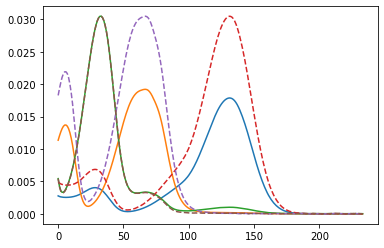

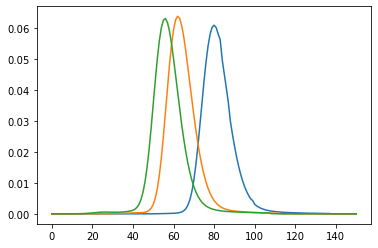

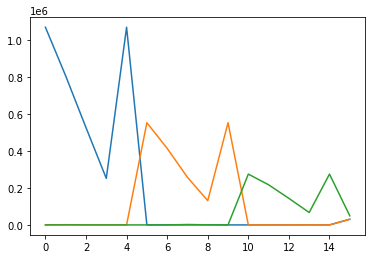

integral_array = [[1.07009495e+06 2.52348648e+02 0.00000000e+00]
 [8.06402357e+05 1.14492097e+03 1.31201713e+02]
 [5.26646013e+05 1.71706034e+02 1.05325291e+02]
 [2.51825511e+05 0.00000000e+00 0.00000000e+00]
 [1.07009495e+06 2.52348648e+02 0.00000000e+00]
 [0.00000000e+00 5.53288917e+05 0.00000000e+00]
 [3.08383387e+02 4.14416976e+05 0.00000000e+00]
 [0.00000000e+00 2.57639009e+05 2.21695011e+03]
 [4.96619296e+02 1.31313919e+05 4.62279110e+02]
 [0.00000000e+00 5.53288917e+05 0.00000000e+00]
 [1.69828713e+01 0.00000000e+00 2.75012130e+05]
 [7.17006020e+01 0.00000000e+00 2.17210456e+05]
 [2.59841029e+02 0.00000000e+00 1.43662612e+05]
 [4.84279729e+02 9.44564065e+01 6.72140368e+04]
 [1.69828713e+01 0.00000000e+00 2.75012130e+05]
 [3.08122900e+04 3.04199908e+04 4.93204346e+04]]
objective_val_non_comp = 6486.326715968674
objective_val_comp = 6613122.8856560355
objective_total_sum = 6730161.927796189
impure_peak_sum = 110552.71542418437
----- new PARAFAC decomposition with iteration offset 

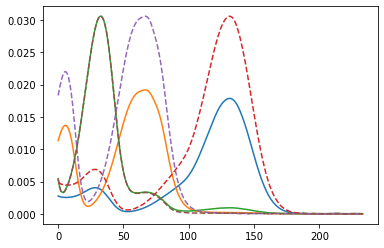

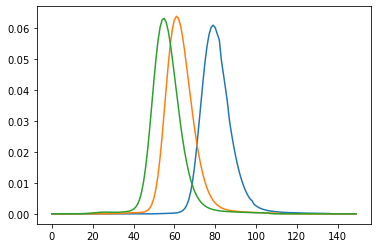

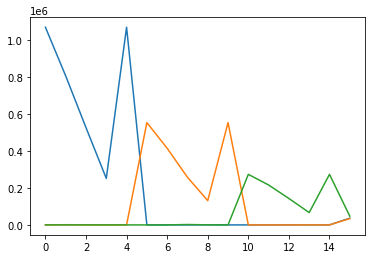

integral_array = [[1.07049872e+06 1.76952657e+02 0.00000000e+00]
 [8.06710245e+05 1.10488878e+03 1.02798119e+02]
 [5.26843274e+05 1.36844825e+02 9.15074625e+01]
 [2.51917104e+05 0.00000000e+00 0.00000000e+00]
 [1.07049872e+06 1.76952657e+02 0.00000000e+00]
 [0.00000000e+00 5.54175585e+05 0.00000000e+00]
 [2.19095677e+02 4.15082978e+05 0.00000000e+00]
 [0.00000000e+00 2.58064169e+05 2.17184051e+03]
 [4.68772630e+02 1.31531654e+05 4.41440996e+02]
 [0.00000000e+00 5.54175585e+05 0.00000000e+00]
 [7.86663043e+01 0.00000000e+00 2.73834919e+05]
 [1.19842765e+02 0.00000000e+00 2.16280010e+05]
 [2.91981763e+02 0.00000000e+00 1.43046686e+05]
 [5.00173452e+02 7.22289709e+01 6.69307100e+04]
 [7.86663043e+01 0.00000000e+00 2.73834919e+05]
 [3.65157153e+04 3.44110777e+04 4.73438295e+04]]
objective_val_non_comp = 6232.653873702474
objective_val_comp = 6613425.280819388
objective_total_sum = 6737928.557228654
impure_peak_sum = 118270.62253556406
----- new PARAFAC decomposition with iteration offset -

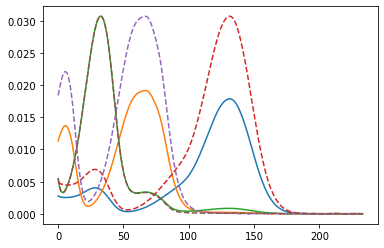

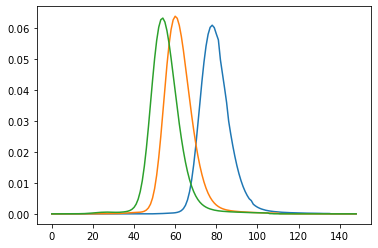

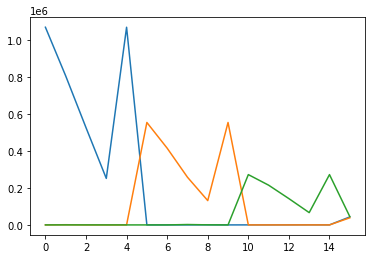

integral_array = [[1.07094774e+06 9.18876694e+01 0.00000000e+00]
 [8.07053455e+05 1.05598249e+03 7.84990217e+01]
 [5.27062126e+05 9.64211593e+01 8.05849072e+01]
 [2.52018265e+05 0.00000000e+00 0.00000000e+00]
 [1.07094774e+06 9.18876694e+01 0.00000000e+00]
 [0.00000000e+00 5.55013967e+05 0.00000000e+00]
 [1.33612682e+02 4.15712737e+05 0.00000000e+00]
 [0.00000000e+00 2.58467831e+05 2.12420985e+03]
 [4.42142313e+02 1.31738366e+05 4.19331215e+02]
 [0.00000000e+00 5.55013967e+05 0.00000000e+00]
 [1.45996408e+02 0.00000000e+00 2.72576071e+05]
 [1.72362629e+02 0.00000000e+00 2.15286301e+05]
 [3.27060413e+02 0.00000000e+00 1.42388715e+05]
 [5.17461101e+02 5.16234531e+01 6.66270388e+04]
 [1.45996408e+02 0.00000000e+00 2.72576071e+05]
 [4.32157942e+04 3.84442227e+04 4.52664920e+04]]
objective_val_non_comp = 5975.059395366958
objective_val_comp = 6613430.388437908
objective_total_sum = 6746331.956769476
impure_peak_sum = 126926.50893620081
----- new PARAFAC decomposition with iteration offset -

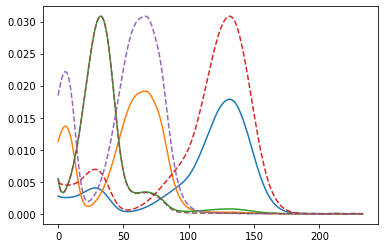

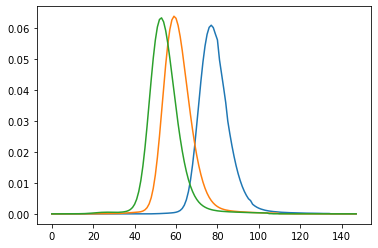

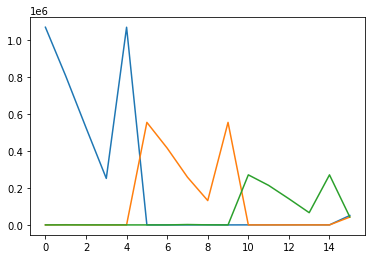

integral_array = [[1.07143290e+06 0.00000000e+00 0.00000000e+00]
 [8.07425431e+05 9.99007912e+02 5.96814717e+01]
 [5.27297898e+05 5.14837908e+01 7.31071637e+01]
 [2.52126641e+05 0.00000000e+00 0.00000000e+00]
 [1.07143290e+06 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 5.55759649e+05 0.00000000e+00]
 [5.69537330e+01 4.16272829e+05 0.00000000e+00]
 [0.00000000e+00 2.58828794e+05 2.07647893e+03]
 [4.18294651e+02 1.31923158e+05 3.96976227e+02]
 [0.00000000e+00 5.55759649e+05 0.00000000e+00]
 [2.14325991e+02 0.00000000e+00 2.71323370e+05]
 [2.25625065e+02 0.00000000e+00 2.14298431e+05]
 [3.62663360e+02 0.00000000e+00 1.41734471e+05]
 [5.35027110e+02 3.16808994e+01 6.63247693e+04]
 [2.14325991e+02 0.00000000e+00 2.71323370e+05]
 [5.10121907e+04 4.24648532e+04 4.32674813e+04]]
objective_val_non_comp = 5715.632297058624
objective_val_comp = 6613264.25026082
objective_total_sum = 6755724.407843364
impure_peak_sum = 136744.52528548535
----- new PARAFAC decomposition with iteration offset -2

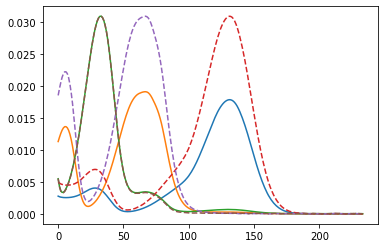

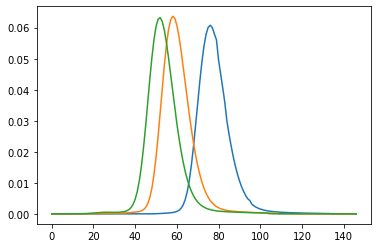

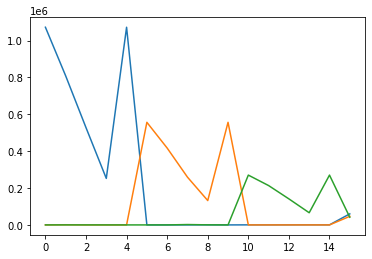

integral_array = [[1.07191771e+06 0.00000000e+00 0.00000000e+00]
 [8.07800886e+05 9.38289924e+02 4.79558546e+01]
 [5.27533740e+05 5.25141335e+00 6.98913110e+01]
 [2.52234133e+05 0.00000000e+00 0.00000000e+00]
 [1.07191771e+06 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 5.56380774e+05 0.00000000e+00]
 [0.00000000e+00 4.16739089e+05 0.00000000e+00]
 [0.00000000e+00 2.59131770e+05 2.03068547e+03]
 [3.98478519e+02 1.32078135e+05 3.75316250e+02]
 [0.00000000e+00 5.56380774e+05 0.00000000e+00]
 [2.80857611e+02 0.00000000e+00 2.70128922e+05]
 [2.77476659e+02 0.00000000e+00 2.13357254e+05]
 [3.97341890e+02 0.00000000e+00 1.41111039e+05]
 [5.52174960e+02 1.19818482e+01 6.60367579e+04]
 [2.80857611e+02 0.00000000e+00 2.70128922e+05]
 [5.99877214e+04 4.64590619e+04 4.14680716e+04]]
objective_val_non_comp = 5666.559324926648
objective_val_comp = 6612877.607427125
objective_total_sum = 6766459.021592465
impure_peak_sum = 147914.85484041402
----- new PARAFAC decomposition with iteration offset -

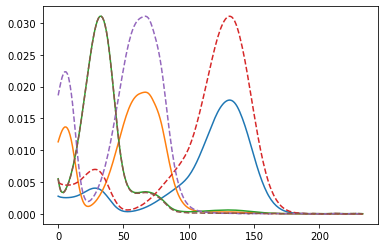

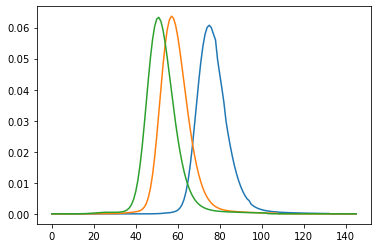

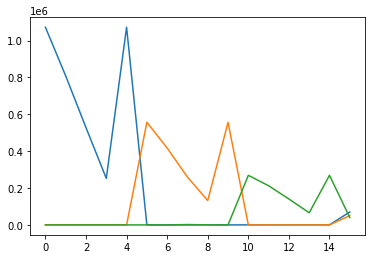

integral_array = [[1.07240190e+06 0.00000000e+00 0.00000000e+00]
 [8.08177899e+05 8.75034723e+02 4.30717855e+01]
 [5.27766918e+05 0.00000000e+00 6.08323266e+01]
 [2.52339841e+05 0.00000000e+00 0.00000000e+00]
 [1.07240190e+06 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 5.56853855e+05 0.00000000e+00]
 [0.00000000e+00 4.17093018e+05 0.00000000e+00]
 [0.00000000e+00 2.59365551e+05 1.98820989e+03]
 [3.83689358e+02 1.32197467e+05 3.55022159e+02]
 [0.00000000e+00 5.56853855e+05 0.00000000e+00]
 [3.43591214e+02 0.00000000e+00 2.69024314e+05]
 [3.26380698e+02 0.00000000e+00 2.12487425e+05]
 [4.30070294e+02 0.00000000e+00 1.40534780e+05]
 [5.68226659e+02 0.00000000e+00 6.57689510e+04]
 [3.43591214e+02 0.00000000e+00 2.69024314e+05]
 [7.02100350e+04 5.04513287e+04 3.99378119e+04]]
objective_val_non_comp = 5717.720317108832
objective_val_comp = 6612291.989408867
objective_total_sum = 6778608.885376067
impure_peak_sum = 160599.17565008916
----- new PARAFAC decomposition with iteration offset -

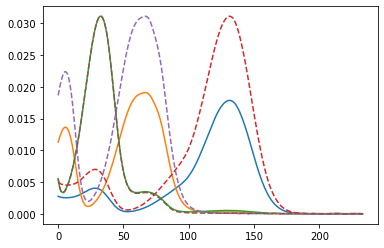

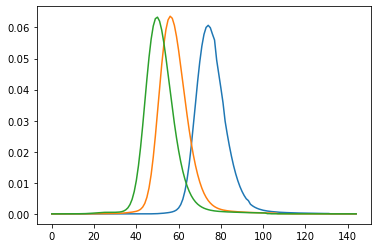

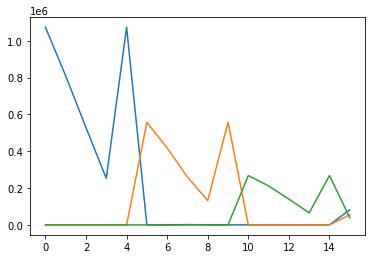

integral_array = [[1.07286080e+06 0.00000000e+00 0.00000000e+00]
 [8.08537875e+05 8.13233355e+02 4.49800482e+01]
 [5.27985969e+05 0.00000000e+00 5.50466789e+01]
 [2.52437843e+05 0.00000000e+00 0.00000000e+00]
 [1.07286080e+06 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 5.57172744e+05 0.00000000e+00]
 [0.00000000e+00 4.17331191e+05 0.00000000e+00]
 [0.00000000e+00 2.59527173e+05 1.94974377e+03]
 [3.74261831e+02 1.32279547e+05 3.36479013e+02]
 [0.00000000e+00 5.57172744e+05 0.00000000e+00]
 [4.01637438e+02 0.00000000e+00 2.68018510e+05]
 [3.71686136e+02 0.00000000e+00 2.11695765e+05]
 [4.60395326e+02 0.00000000e+00 1.40010240e+05]
 [5.82832727e+02 0.00000000e+00 6.55225348e+04]
 [4.01637438e+02 0.00000000e+00 2.68018510e+05]
 [8.17105252e+04 5.45065028e+04 3.86941977e+04]]
objective_val_non_comp = 5791.933755544937
objective_val_comp = 6611432.239921222
objective_total_sum = 6792135.399283538
impure_peak_sum = 174911.22560677055
----- new PARAFAC decomposition with iteration offset -

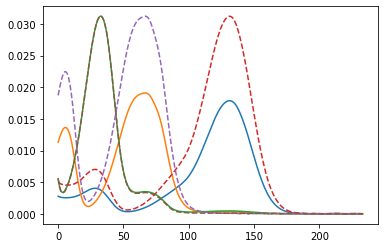

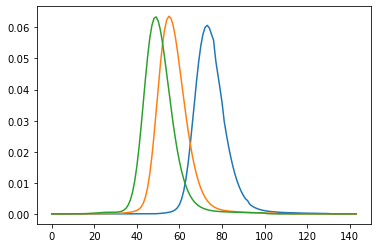

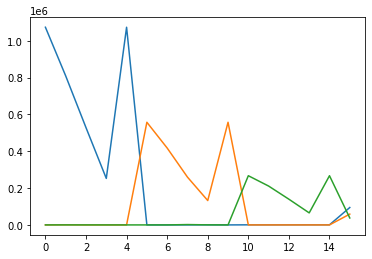

integral_array = [[1.07326315e+06 0.00000000e+00 0.00000000e+00]
 [8.08857033e+05 7.57690438e+02 5.31920544e+01]
 [5.28175500e+05 0.00000000e+00 5.41971767e+01]
 [2.52520826e+05 0.00000000e+00 0.00000000e+00]
 [1.07326315e+06 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 5.57334540e+05 0.00000000e+00]
 [0.00000000e+00 4.17451375e+05 0.00000000e+00]
 [0.00000000e+00 2.59615182e+05 1.91587616e+03]
 [3.70414594e+02 1.32323541e+05 3.20069285e+02]
 [0.00000000e+00 5.57334540e+05 0.00000000e+00]
 [4.54755172e+02 0.00000000e+00 2.67105161e+05]
 [4.13250076e+02 0.00000000e+00 2.10977025e+05]
 [4.88195948e+02 0.00000000e+00 1.39533972e+05]
 [5.96212056e+02 0.00000000e+00 6.52987804e+04]
 [4.54755172e+02 0.00000000e+00 2.67105161e+05]
 [9.44782835e+04 5.87140621e+04 3.77124575e+04]]
objective_val_non_comp = 5878.608126791432
objective_val_comp = 6610158.93924422
objective_total_sum = 6806942.350378068
impure_peak_sum = 190904.80300705612
----- new PARAFAC decomposition with iteration offset -2

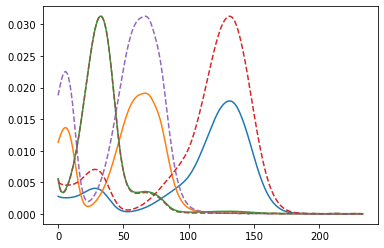

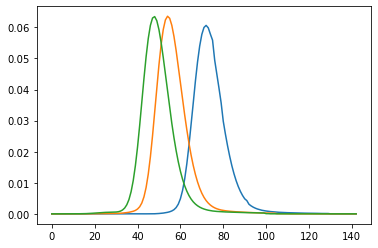

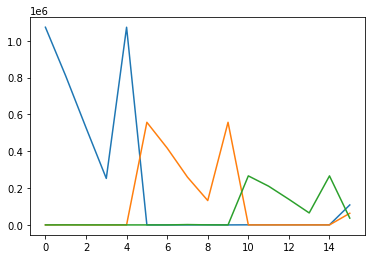

integral_array = [[1.07357364e+06 0.00000000e+00 0.00000000e+00]
 [8.09108244e+05 7.13433304e+02 6.68383523e+01]
 [5.28318096e+05 0.00000000e+00 5.85009714e+01]
 [2.52580716e+05 0.00000000e+00 0.00000000e+00]
 [1.07357364e+06 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 5.57340783e+05 0.00000000e+00]
 [0.00000000e+00 4.17454681e+05 0.00000000e+00]
 [0.00000000e+00 2.59630229e+05 1.88693355e+03]
 [3.72147280e+02 1.32329704e+05 3.06098758e+02]
 [0.00000000e+00 5.57340783e+05 0.00000000e+00]
 [5.03125787e+02 0.00000000e+00 2.66265950e+05]
 [4.51252320e+02 0.00000000e+00 2.10316528e+05]
 [5.13564289e+02 0.00000000e+00 1.39096284e+05]
 [6.08378708e+02 0.00000000e+00 6.50931660e+04]
 [5.03125787e+02 0.00000000e+00 2.66265950e+05]
 [1.08448248e+05 6.31749095e+04 3.69342344e+04]]
objective_val_non_comp = 5983.399108972012
objective_val_comp = 6608288.403884426
objective_total_sum = 6822829.19507177
impure_peak_sum = 208557.39207837277
----- new PARAFAC decomposition with iteration offset -2

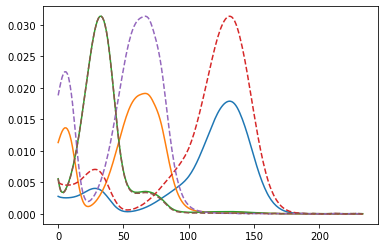

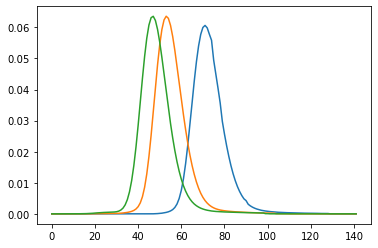

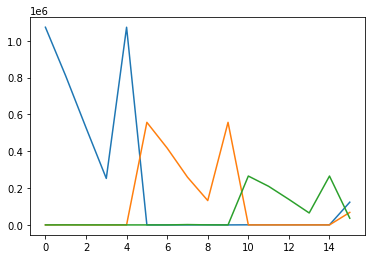

integral_array = [[1.07375601e+06 0.00000000e+00 0.00000000e+00]
 [8.09263381e+05 6.85094960e+02 8.47745262e+01]
 [5.28396080e+05 0.00000000e+00 6.79497784e+01]
 [2.52609473e+05 0.00000000e+00 0.00000000e+00]
 [1.07375601e+06 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 5.57192819e+05 0.00000000e+00]
 [0.00000000e+00 4.17342100e+05 0.00000000e+00]
 [0.00000000e+00 2.59572765e+05 1.86340557e+03]
 [3.79358829e+02 1.32298207e+05 2.94977438e+02]
 [0.00000000e+00 5.57192819e+05 0.00000000e+00]
 [5.47019942e+02 0.00000000e+00 2.65478526e+05]
 [4.85926798e+02 0.00000000e+00 2.09696436e+05]
 [5.36630786e+02 0.00000000e+00 1.38685391e+05]
 [6.19364091e+02 0.00000000e+00 6.49001817e+04]
 [5.47019942e+02 0.00000000e+00 2.65478526e+05]
 [1.23491170e+05 6.79823825e+04 3.62798834e+04]]
objective_val_non_comp = 6111.522656606379
objective_val_comp = 6605618.721803891
objective_total_sum = 6839483.680622309
impure_peak_sum = 227753.43616181274
----- new PARAFAC decomposition with iteration offset -

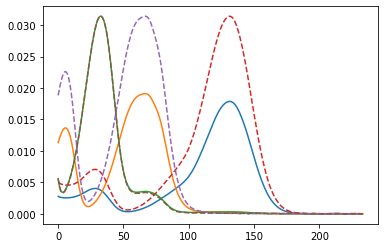

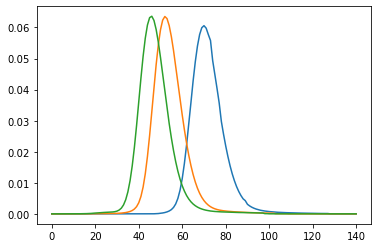

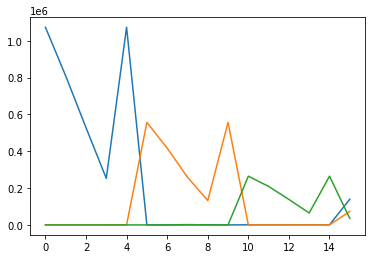

integral_array = [[1.07377738e+06 0.00000000e+00 0.00000000e+00]
 [8.09296549e+05 6.76291819e+02 1.05704492e+02]
 [5.28393702e+05 0.00000000e+00 8.22781278e+01]
 [2.52600195e+05 0.00000000e+00 0.00000000e+00]
 [1.07377738e+06 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 5.56889890e+05 0.00000000e+00]
 [0.00000000e+00 4.17113087e+05 0.00000000e+00]
 [0.00000000e+00 2.59442045e+05 1.84608334e+03]
 [3.91900043e+02 1.32228660e+05 2.87282511e+02]
 [0.00000000e+00 5.56889890e+05 0.00000000e+00]
 [5.86626971e+02 0.00000000e+00 2.64721520e+05]
 [5.17423950e+02 0.00000000e+00 2.09099727e+05]
 [5.57476024e+02 0.00000000e+00 1.38290043e+05]
 [6.29179202e+02 0.00000000e+00 6.47145652e+04]
 [5.86626971e+02 0.00000000e+00 2.64721520e+05]
 [1.39408395e+05 7.32031034e+04 3.56606692e+04]]
objective_val_non_comp = 6266.873450190658
objective_val_comp = 6601956.147160796
objective_total_sum = 6856495.187845895
impure_peak_sum = 248272.1672349088
----- new PARAFAC decomposition with iteration offset -1

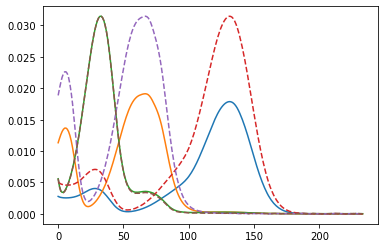

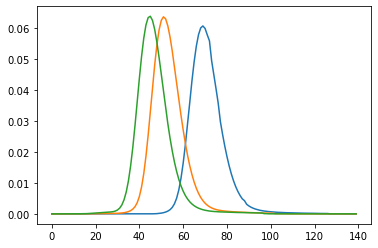

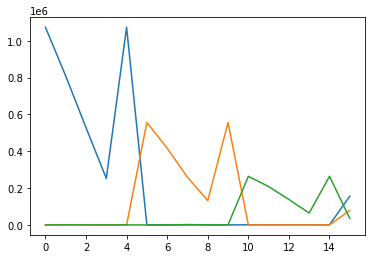

integral_array = [[1.07361370e+06 0.00000000e+00 0.00000000e+00]
 [8.09188097e+05 6.89030749e+02 1.28319526e+02]
 [5.28299779e+05 0.00000000e+00 1.00954524e+02]
 [2.52548350e+05 0.00000000e+00 0.00000000e+00]
 [1.07361370e+06 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 5.56427465e+05 0.00000000e+00]
 [2.63332450e+01 4.16763724e+05 0.00000000e+00]
 [0.00000000e+00 2.59235239e+05 1.83627956e+03]
 [4.09645684e+02 1.32119681e+05 2.83835327e+02]
 [0.00000000e+00 5.56427465e+05 0.00000000e+00]
 [6.21960001e+02 0.00000000e+00 2.63978911e+05]
 [5.45735321e+02 0.00000000e+00 2.08513665e+05]
 [5.76084696e+02 0.00000000e+00 1.37901824e+05]
 [6.37796415e+02 0.00000000e+00 6.45323745e+04]
 [6.21960001e+02 0.00000000e+00 2.63978911e+05]
 [1.55931664e+05 7.88588829e+04 3.49919132e+04]]
objective_val_non_comp = 6477.935044842392
objective_val_comp = 6597142.893104009
objective_total_sum = 6873403.288094411
impure_peak_sum = 269782.45994555886
----- new PARAFAC decomposition with iteration offset -

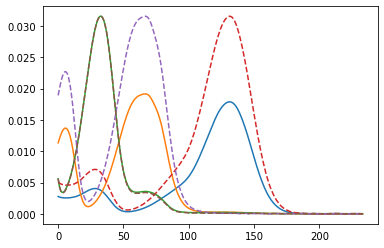

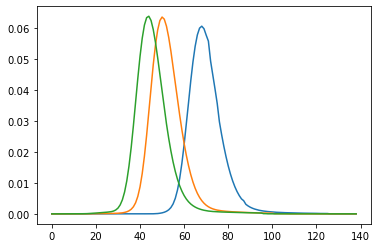

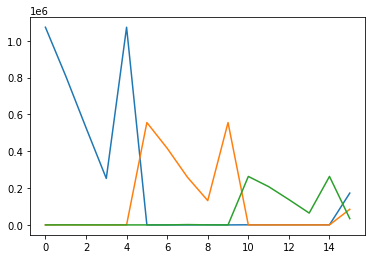

integral_array = [[1.07325479e+06 0.00000000e+00 0.00000000e+00]
 [8.08928698e+05 7.23350646e+02 1.51514294e+02]
 [5.28110317e+05 0.00000000e+00 1.23247817e+02]
 [2.52452848e+05 0.00000000e+00 0.00000000e+00]
 [1.07325479e+06 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 5.55802468e+05 0.00000000e+00]
 [9.88028373e+01 4.16291441e+05 0.00000000e+00]
 [0.00000000e+00 2.58949848e+05 1.83575731e+03]
 [4.32320873e+02 1.31970164e+05 2.85630043e+02]
 [0.00000000e+00 5.55802468e+05 0.00000000e+00]
 [6.52905913e+02 0.00000000e+00 2.63242617e+05]
 [5.70734094e+02 0.00000000e+00 2.07931863e+05]
 [5.92375253e+02 0.00000000e+00 1.37516517e+05]
 [6.45167731e+02 0.00000000e+00 6.43516272e+04]
 [6.52905913e+02 0.00000000e+00 2.63242617e+05]
 [1.72722044e+05 8.49142727e+04 3.42054252e+04]]
objective_val_non_comp = 6764.712728733297
objective_val_comp = 6591103.065831706
objective_total_sum = 6889709.520376412
impure_peak_sum = 291841.74181597214
----- new PARAFAC decomposition with iteration offset -

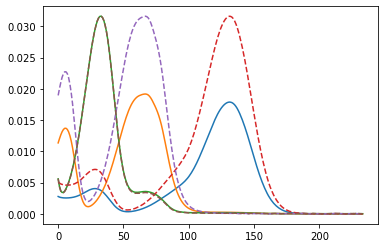

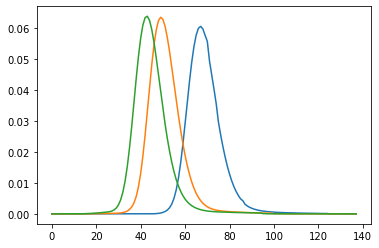

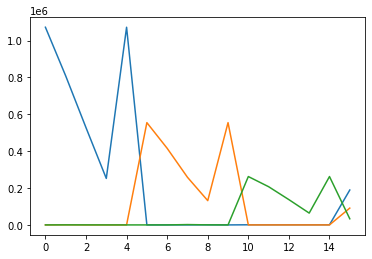

integral_array = [[1.07270928e+06 0.00000000e+00 0.00000000e+00]
 [8.08523210e+05 7.77125098e+02 1.74458582e+02]
 [5.27830882e+05 0.00000000e+00 1.48250896e+02]
 [2.52317218e+05 0.00000000e+00 0.00000000e+00]
 [1.07270928e+06 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 5.55020894e+05 0.00000000e+00]
 [1.84973418e+02 4.15701709e+05 0.00000000e+00]
 [0.00000000e+00 2.58587300e+05 1.84651982e+03]
 [4.59255764e+02 1.31781151e+05 2.93695053e+02]
 [0.00000000e+00 5.55020894e+05 0.00000000e+00]
 [6.79289560e+02 0.00000000e+00 2.62513461e+05]
 [5.92233760e+02 0.00000000e+00 2.07355063e+05]
 [6.06237179e+02 0.00000000e+00 1.37134610e+05]
 [6.51246801e+02 0.00000000e+00 6.41725402e+04]
 [6.79289560e+02 0.00000000e+00 2.62513461e+05]
 [1.89382470e+05 9.12692708e+04 3.32601203e+04]]
objective_val_non_comp = 7092.575493924885
objective_val_comp = 6583890.960782573
objective_total_sum = 6904895.397473949
impure_peak_sum = 313911.86119745136
----- new PARAFAC decomposition with iteration offset -

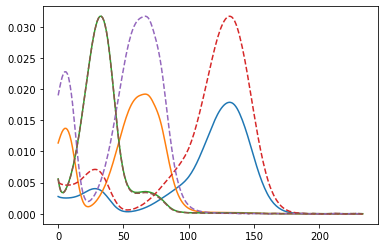

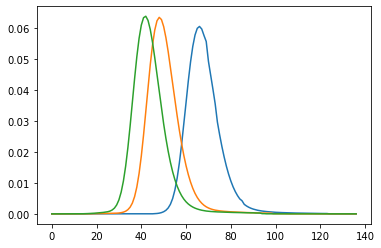

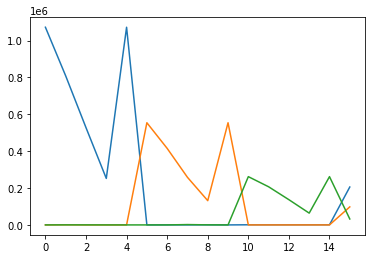

integral_array = [[1.07200753e+06 0.00000000e+00 0.00000000e+00]
 [8.07993107e+05 8.46227017e+02 1.96659663e+02]
 [5.27477955e+05 0.00000000e+00 1.74953091e+02]
 [2.52150050e+05 0.00000000e+00 0.00000000e+00]
 [1.07200753e+06 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 5.54097630e+05 0.00000000e+00]
 [2.81941561e+02 4.15006057e+05 0.00000000e+00]
 [0.00000000e+00 2.58153045e+05 1.87043903e+03]
 [4.89551834e+02 1.31555845e+05 3.08909574e+02]
 [0.00000000e+00 5.54097630e+05 0.00000000e+00]
 [7.01041854e+02 0.00000000e+00 2.61798136e+05]
 [6.10127991e+02 0.00000000e+00 2.06788729e+05]
 [6.17624278e+02 0.00000000e+00 1.36759706e+05]
 [6.55038799e+02 3.96860448e+01 6.39875664e+04]
 [7.01041854e+02 0.00000000e+00 2.61798136e+05]
 [2.05472766e+05 9.77582793e+04 3.21484098e+04]]
objective_val_non_comp = 7493.242592188895
objective_val_comp = 6575678.652900699
objective_total_sum = 6918551.350176061
impure_peak_sum = 335379.4546831727
----- new PARAFAC decomposition with iteration offset -1

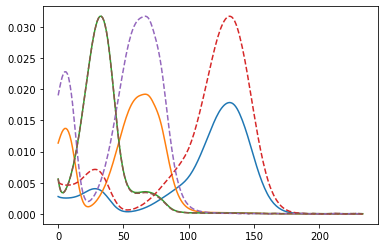

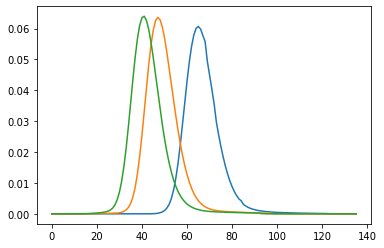

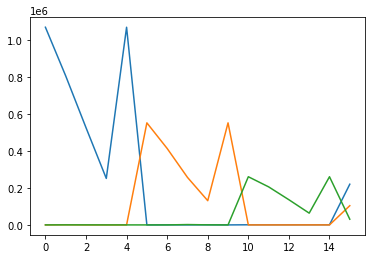

integral_array = [[1.07119403e+06 0.00000000e+00 3.21529707e+01]
 [8.07371298e+05 9.25386305e+02 2.18525342e+02]
 [5.27074684e+05 2.17084114e+01 1.97727884e+02]
 [2.51962960e+05 0.00000000e+00 0.00000000e+00]
 [1.07119403e+06 0.00000000e+00 3.21529707e+01]
 [5.49687408e+00 5.53060389e+05 0.00000000e+00]
 [3.85844292e+02 4.14225777e+05 0.00000000e+00]
 [5.60757405e+00 2.57658450e+05 1.90907371e+03]
 [5.22007352e+02 1.31300633e+05 3.31869076e+02]
 [5.49687408e+00 5.53060389e+05 0.00000000e+00]
 [7.18135321e+02 0.00000000e+00 2.61112681e+05]
 [6.24348141e+02 0.00000000e+00 2.06245733e+05]
 [6.26521529e+02 0.00000000e+00 1.36400308e+05]
 [6.57205529e+02 9.49767510e+01 6.38063471e+04]
 [7.18135321e+02 0.00000000e+00 2.61112681e+05]
 [2.20530776e+05 1.04157670e+05 3.08999067e+04]]
objective_val_non_comp = 8032.372225525322
objective_val_comp = 6566780.391607668
objective_total_sum = 6930401.116873396
impure_peak_sum = 355588.3530402022
----- new PARAFAC decomposition with iteration offset -1

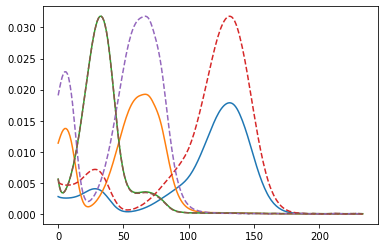

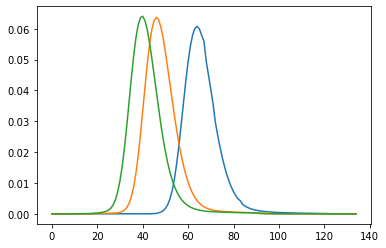

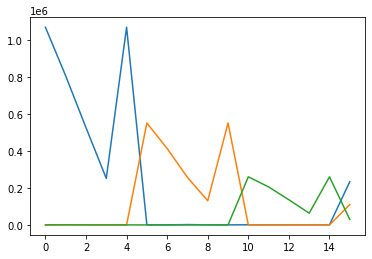

integral_array = [[1.07031912e+06 1.23905354e+02 6.13894415e+01]
 [8.06697812e+05 1.01053592e+03 2.40110834e+02]
 [5.26648371e+05 8.62800967e+01 2.11122222e+02]
 [2.51769090e+05 0.00000000e+00 0.00000000e+00]
 [1.07031912e+06 1.23905354e+02 6.13894415e+01]
 [1.52874893e+02 5.51924928e+05 0.00000000e+00]
 [4.95363197e+02 4.13375153e+05 0.00000000e+00]
 [7.51754143e+01 2.57109879e+05 1.96316686e+03]
 [5.56234551e+02 1.31019837e+05 3.62763965e+02]
 [1.52874893e+02 5.51924928e+05 0.00000000e+00]
 [7.30691696e+02 0.00000000e+00 2.60475115e+05]
 [6.34965518e+02 0.00000000e+00 2.05740514e+05]
 [6.33004859e+02 0.00000000e+00 1.36065955e+05]
 [6.58089495e+02 1.55816618e+02 6.36356983e+04]
 [7.30691696e+02 0.00000000e+00 2.60475115e+05]
 [2.34093950e+05 1.10198181e+05 2.95756470e+04]]
objective_val_non_comp = 9220.352318337384
objective_val_comp = 6557500.631864203
objective_total_sum = 6940588.762303212
impure_peak_sum = 373867.77812067023
----- new PARAFAC decomposition with iteration offset -

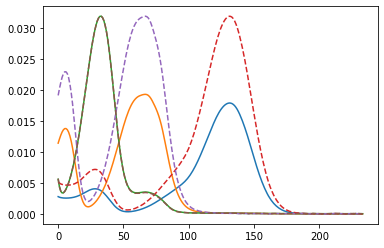

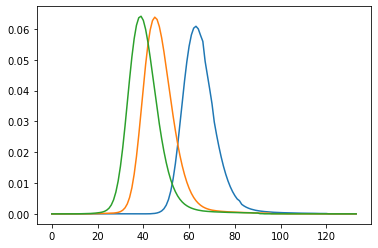

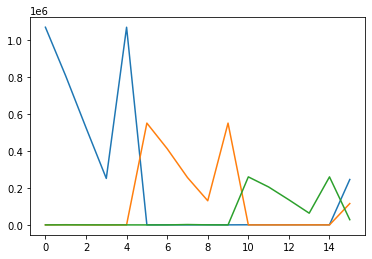

integral_array = [[1.06949468e+06 2.44158844e+02 8.86120636e+01]
 [8.06055449e+05 1.09203558e+03 2.60796575e+02]
 [5.26254661e+05 1.48336513e+02 2.23771650e+02]
 [2.51593506e+05 0.00000000e+00 1.29576937e+01]
 [1.06949468e+06 2.44158844e+02 8.86120636e+01]
 [2.94486505e+02 5.50783359e+05 0.00000000e+00]
 [6.00535758e+02 4.12521320e+05 0.00000000e+00]
 [1.42228831e+02 2.56550171e+05 2.03077479e+03]
 [5.89127440e+02 1.30735102e+05 4.00272063e+02]
 [2.94486505e+02 5.50783359e+05 0.00000000e+00]
 [7.39212443e+02 0.00000000e+00 2.59899046e+05]
 [6.42338241e+02 0.00000000e+00 2.05283990e+05]
 [6.37366182e+02 0.00000000e+00 1.35763850e+05]
 [6.58001817e+02 2.18528263e+02 6.34798417e+04]
 [7.39212443e+02 0.00000000e+00 2.59899046e+05]
 [2.45736914e+05 1.15605558e+05 2.82567478e+04]]
objective_val_non_comp = 10390.011110139927
objective_val_comp = 6548592.069130035
objective_total_sum = 6948581.300328982
impure_peak_sum = 389599.2200888059
----- new PARAFAC decomposition with iteration offset -

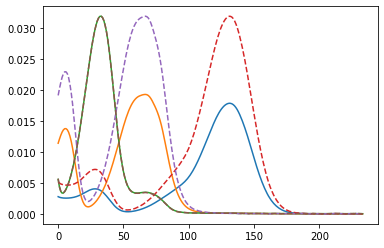

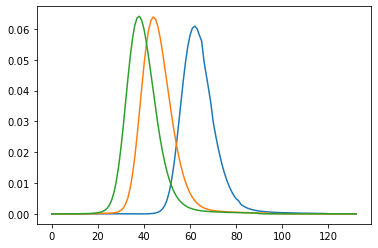

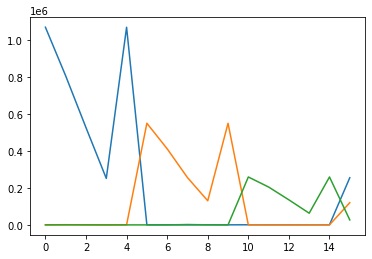

integral_array = [[1.06880828e+06 3.50791285e+02 1.14125059e+02]
 [8.05512098e+05 1.16377141e+03 2.80489307e+02]
 [5.25937346e+05 2.03527888e+02 2.35592869e+02]
 [2.51455905e+05 0.00000000e+00 2.54682296e+01]
 [1.06880828e+06 3.50791285e+02 1.14125059e+02]
 [4.23202664e+02 5.49635391e+05 9.32628549e+01]
 [6.96402971e+02 4.11687990e+05 0.00000000e+00]
 [2.03450298e+02 2.55989466e+05 2.12546591e+03]
 [6.19117053e+02 1.30451373e+05 4.52105685e+02]
 [4.23202664e+02 5.49635391e+05 9.32628549e+01]
 [7.40301928e+02 2.59227616e+02 2.59229325e+05]
 [6.48631445e+02 0.00000000e+00 2.04801156e+05]
 [6.41081949e+02 0.00000000e+00 1.35444177e+05]
 [6.57166045e+02 3.05367210e+02 6.33102968e+04]
 [7.40301928e+02 2.59227616e+02 2.59229325e+05]
 [2.55081585e+05 1.20108238e+05 2.70238381e+04]]
objective_val_non_comp = 12219.46108447746
objective_val_comp = 6539935.798228552
objective_total_sum = 6954368.921052374
impure_peak_sum = 402213.6617393444
----- new PARAFAC decomposition with iteration offset -1

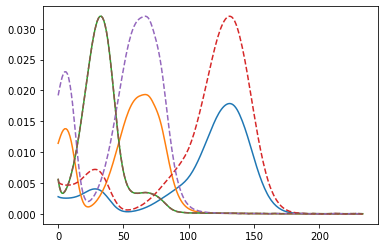

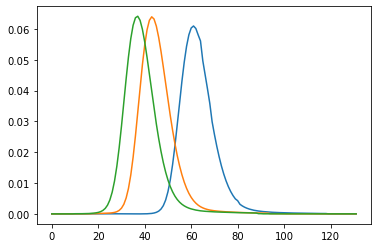

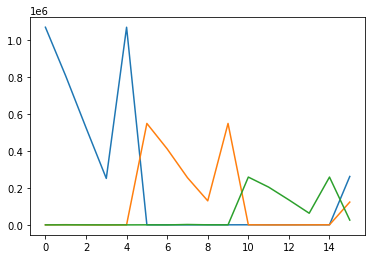

integral_array = [[1.06833865e+06 4.36648105e+02 1.38112149e+02]
 [8.05130040e+05 1.22058153e+03 2.99396701e+02]
 [5.25735254e+05 2.48176367e+02 2.46766028e+02]
 [2.51373039e+05 0.00000000e+00 3.62315439e+01]
 [1.06833865e+06 4.36648105e+02 1.38112149e+02]
 [5.33284308e+02 5.48436075e+05 4.34173259e+02]
 [7.79250924e+02 4.10880122e+05 0.00000000e+00]
 [2.56238140e+02 2.55421818e+05 2.27400180e+03]
 [6.44997985e+02 1.30165901e+05 5.31273768e+02]
 [5.33284308e+02 5.48436075e+05 4.34173259e+02]
 [7.36335703e+02 6.55174720e+02 2.58552617e+05]
 [6.53295303e+02 0.00000000e+00 2.04337271e+05]
 [6.43822551e+02 0.00000000e+00 1.35136958e+05]
 [6.55850482e+02 4.01100214e+02 6.31448129e+04]
 [7.36335703e+02 6.55174720e+02 2.58552617e+05]
 [2.61821269e+05 1.23435196e+05 2.60023714e+04]]
objective_val_non_comp = 14758.439825373185
objective_val_comp = 6531979.902046044
objective_total_sum = 6957997.178187812
impure_peak_sum = 411258.83631639363
----- new PARAFAC decomposition with iteration offset 

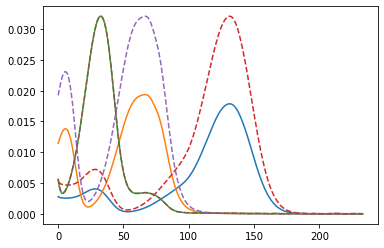

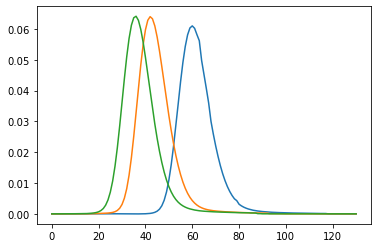

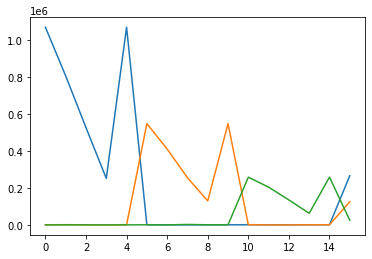

integral_array = [[1.06814629e+06 4.96789133e+02 1.60608447e+02]
 [8.04958464e+05 1.25930712e+03 3.17403207e+02]
 [5.25677500e+05 2.79655342e+02 2.57436222e+02]
 [2.51356880e+05 0.00000000e+00 4.50244406e+01]
 [1.06814629e+06 4.96789133e+02 1.60608447e+02]
 [6.18351649e+02 5.47360317e+05 8.21017888e+02]
 [8.42922122e+02 4.10106707e+05 2.08378270e+02]
 [2.97245462e+02 2.54907634e+05 2.44613256e+03]
 [6.65173607e+02 1.29909396e+05 6.21686166e+02]
 [6.18351649e+02 5.47360317e+05 8.21017888e+02]
 [7.30332088e+02 1.00975021e+03 2.57981886e+05]
 [6.55421176e+02 0.00000000e+00 2.03948932e+05]
 [6.45011027e+02 0.00000000e+00 1.34879753e+05]
 [6.54253213e+02 4.86937628e+02 6.30052951e+04]
 [7.30332088e+02 1.00975021e+03 2.57981886e+05]
 [2.65735376e+05 1.25402165e+05 2.52718844e+04]]
objective_val_non_comp = 17355.686391929663
objective_val_comp = 6525727.545821875
objective_total_sum = 6959492.657962498
impure_peak_sum = 416409.425748692
----- new PARAFAC decomposition with iteration offset -8

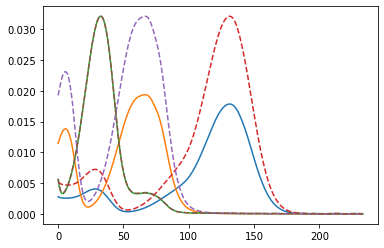

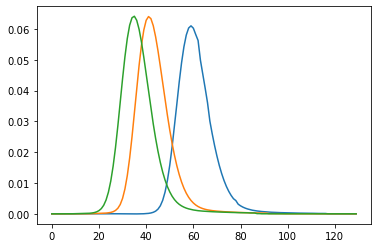

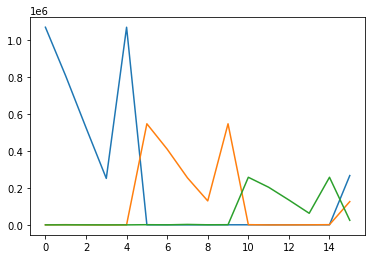

integral_array = [[1.06826607e+06 5.28671958e+02 1.81404914e+02]
 [8.05027164e+05 1.27847879e+03 3.34135782e+02]
 [5.25779680e+05 2.96619348e+02 2.67499757e+02]
 [2.51413110e+05 0.00000000e+00 5.17216702e+01]
 [1.06826607e+06 5.28671958e+02 1.81404914e+02]
 [6.73592037e+02 5.46513866e+05 1.19109102e+03]
 [8.84220860e+02 4.09477926e+05 4.87195369e+02]
 [3.24123367e+02 2.54498049e+05 2.61172681e+03]
 [6.78525995e+02 1.29707173e+05 7.08324968e+02]
 [6.73592037e+02 5.46513866e+05 1.19109102e+03]
 [7.22465519e+02 1.34483334e+03 2.57482721e+05]
 [6.55632393e+02 0.00000000e+00 2.03613092e+05]
 [6.42374289e+02 1.16071840e+02 1.34631330e+05]
 [6.52445265e+02 5.68266911e+02 6.28832903e+04]
 [7.22465519e+02 1.34483334e+03 2.57482721e+05]
 [2.66703754e+05 1.25901215e+05 2.48687157e+04]]
objective_val_non_comp = 19841.48098533898
objective_val_comp = 6521556.124680584
objective_total_sum = 6958871.290843039
impure_peak_sum = 417473.68517711555
----- new PARAFAC decomposition with iteration offset -

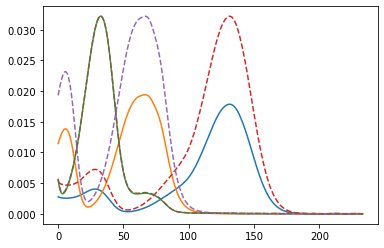

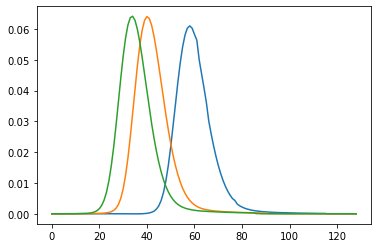

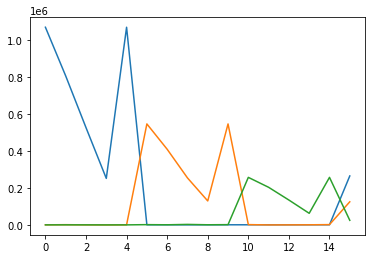

integral_array = [[1.06870218e+06 5.31931748e+02 2.00251253e+02]
 [8.05342505e+05 1.27806718e+03 3.49295043e+02]
 [5.26041707e+05 2.98829878e+02 2.76881149e+02]
 [2.51540324e+05 0.00000000e+00 5.63081714e+01]
 [1.06870218e+06 5.31931748e+02 2.00251253e+02]
 [6.96522626e+02 5.45975738e+05 1.48595797e+03]
 [9.01657592e+02 4.09080525e+05 7.09357119e+02]
 [3.35626348e+02 2.54231563e+05 2.74347140e+03]
 [6.84464441e+02 1.29578142e+05 7.77314869e+02]
 [6.96522626e+02 5.45975738e+05 1.48595797e+03]
 [7.12651045e+02 1.64883680e+03 2.57063636e+05]
 [6.53724246e+02 0.00000000e+00 2.03334497e+05]
 [6.37472807e+02 2.75770731e+02 1.34411423e+05]
 [6.50408513e+02 6.42268908e+02 6.27808366e+04]
 [7.12651045e+02 1.64883680e+03 2.57063636e+05]
 [2.64708711e+05 1.24892143e+05 2.48053376e+04]]
objective_val_non_comp = 21823.221277509158
objective_val_comp = 6519824.621104718
objective_total_sum = 6956054.033718409
impure_peak_sum = 414406.1913361823
----- new PARAFAC decomposition with iteration offset -

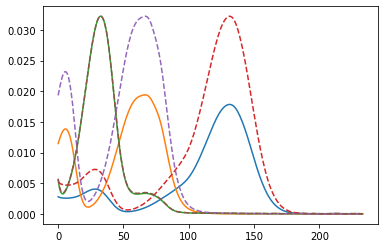

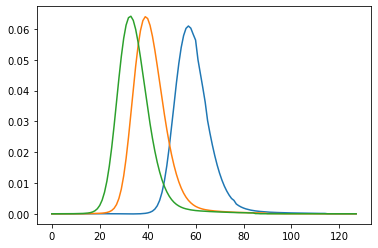

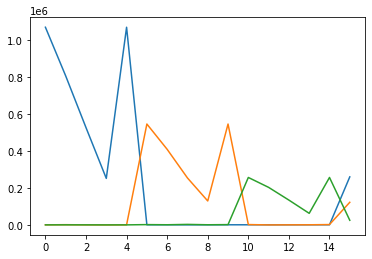

integral_array = [[1.06943282e+06 5.07938870e+02 2.15885344e+02]
 [8.05890123e+05 1.25915405e+03 3.61913230e+02]
 [5.26450124e+05 2.86921374e+02 2.84994476e+02]
 [2.51731595e+05 0.00000000e+00 5.86034083e+01]
 [1.06943282e+06 5.07938870e+02 2.15885344e+02]
 [6.85789566e+02 5.45766088e+05 1.68529946e+03]
 [8.94210726e+02 4.08929006e+05 8.59727005e+02]
 [3.31076922e+02 2.54119235e+05 2.83167715e+03]
 [6.82645935e+02 1.29527236e+05 8.23812454e+02]
 [6.85789566e+02 5.45766088e+05 1.68529946e+03]
 [7.00480155e+02 1.91564901e+03 2.56727999e+05]
 [6.49322597e+02 0.00000000e+00 2.03114826e+05]
 [6.31498015e+02 4.15605295e+02 1.34235285e+05]
 [6.48018031e+02 7.07437783e+02 6.26987271e+04]
 [7.00480155e+02 1.91564901e+03 2.56727999e+05]
 [2.59840563e+05 1.22403065e+05 2.50679749e+04]]
objective_val_non_comp = 23148.70326714494
objective_val_comp = 6520549.962782676
objective_total_sum = 6951010.2686604755
impure_peak_sum = 407311.6026106543
----- new PARAFAC decomposition with iteration offset -

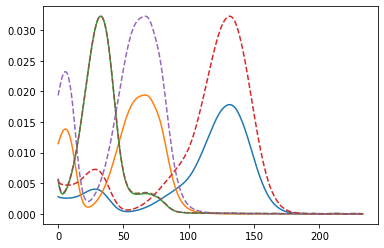

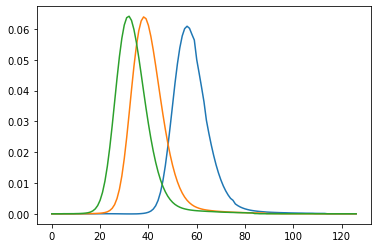

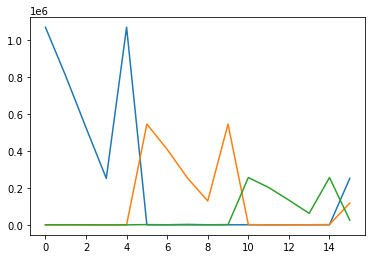

integral_array = [[1.07040010e+06 4.60086220e+02 2.28465649e+02]
 [8.06626836e+05 1.22436582e+03 3.72069469e+02]
 [5.26973337e+05 2.62541489e+02 2.91898608e+02]
 [2.51972253e+05 0.00000000e+00 5.88464593e+01]
 [1.07040010e+06 4.60086220e+02 2.28465649e+02]
 [6.39284682e+02 5.45889090e+05 1.77758947e+03]
 [8.60260294e+02 4.09025856e+05 9.29986991e+02]
 [3.09467963e+02 2.54164896e+05 2.86987267e+03]
 [6.72517361e+02 1.29555656e+05 8.44932132e+02]
 [6.39284682e+02 5.45889090e+05 1.77758947e+03]
 [6.85299660e+02 2.17403959e+03 2.56436498e+05]
 [6.40628532e+02 7.90825278e+01 2.02910748e+05]
 [6.24090202e+02 5.50533210e+02 1.34082321e+05]
 [6.45058393e+02 7.70779555e+02 6.26273295e+04]
 [6.85299660e+02 2.17403959e+03 2.56436498e+05]
 [2.52291616e+05 1.18538152e+05 2.56099702e+04]]
objective_val_non_comp = 23936.462211650512
objective_val_comp = 6523390.603603874
objective_total_sum = 6943766.804613754
impure_peak_sum = 396439.73879822996
----- new PARAFAC decomposition with iteration offset 

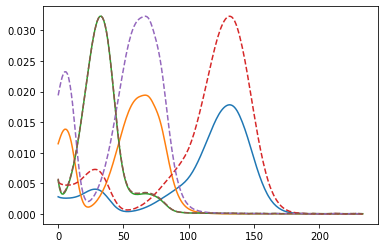

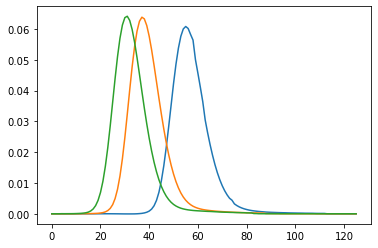

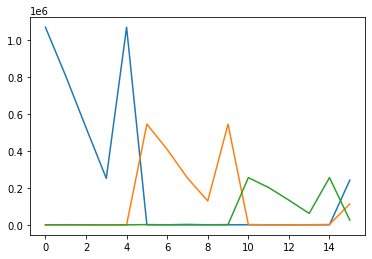

integral_array = [[1.07151503e+06 3.93504168e+02 2.40080368e+02]
 [8.07484469e+05 1.17647661e+03 3.81565150e+02]
 [5.27564440e+05 2.28523452e+02 2.98541251e+02]
 [2.52241135e+05 0.00000000e+00 5.78013463e+01]
 [1.07151503e+06 3.93504168e+02 2.40080368e+02]
 [5.72452424e+02 5.46249126e+05 1.76317965e+03]
 [8.11313629e+02 4.09299007e+05 9.20481922e+02]
 [2.77976595e+02 2.54324998e+05 2.85803777e+03]
 [6.57662979e+02 1.29640757e+05 8.40748896e+02]
 [5.72452424e+02 5.46249126e+05 1.76317965e+03]
 [6.66467142e+02 2.42304258e+03 2.56188301e+05]
 [6.26177202e+02 2.74360793e+02 2.02713508e+05]
 [6.14865065e+02 6.80083589e+02 1.33952013e+05]
 [6.41301525e+02 8.31951245e+02 6.25664299e+04]
 [6.66467142e+02 2.42304258e+03 2.56188301e+05]
 [2.42350802e+05 1.13449189e+05 2.63602568e+04]]
objective_val_non_comp = 24295.321663102717
objective_val_comp = 6527691.678827364
objective_total_sum = 6934147.248911609
impure_peak_sum = 382160.2484211443
----- new PARAFAC decomposition with iteration offset -

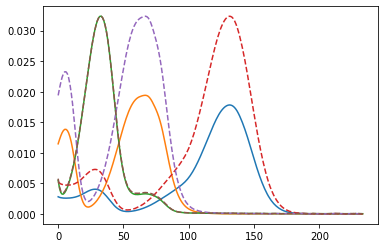

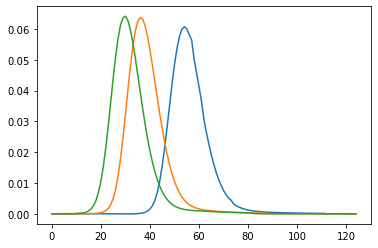

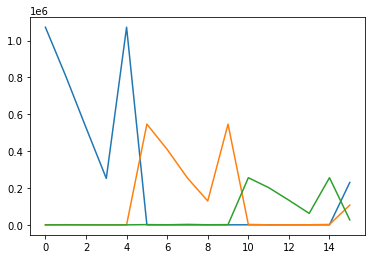

integral_array = [[1.07269018e+06 3.13843881e+02 2.50290166e+02]
 [8.08394674e+05 1.11901008e+03 3.90251828e+02]
 [5.28177742e+05 1.87831983e+02 3.04685797e+02]
 [2.52518283e+05 0.00000000e+00 5.56539346e+01]
 [1.07269018e+06 3.13843881e+02 2.50290166e+02]
 [4.95209710e+02 5.46766042e+05 1.65175908e+03]
 [7.54713932e+02 4.09688334e+05 8.38185161e+02]
 [2.41268132e+02 2.54561993e+05 2.80185269e+03]
 [6.40356985e+02 1.29763419e+05 8.13738536e+02]
 [4.95209710e+02 5.46766042e+05 1.65175908e+03]
 [6.43633186e+02 2.61612204e+03 2.56039100e+05]
 [6.08569191e+02 4.24458920e+02 2.02594452e+05]
 [6.03588156e+02 7.79997999e+02 1.33873340e+05]
 [6.36587145e+02 8.79501959e+02 6.25296249e+04]
 [6.43633186e+02 2.61612204e+03 2.56039100e+05]
 [2.30388559e+05 1.07345118e+05 2.72274378e+04]]
objective_val_non_comp = 24021.96855309377
objective_val_comp = 6533092.50958176
objective_total_sum = 6922075.592502007
impure_peak_sum = 364961.1143671544
----- new PARAFAC decomposition with iteration offset -2 

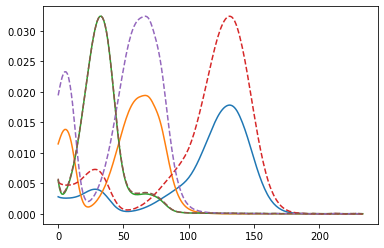

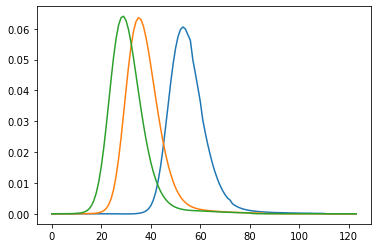

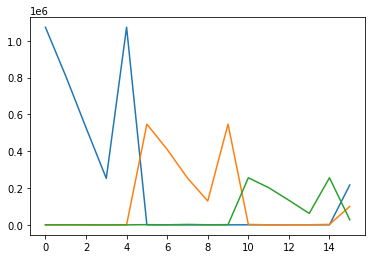

integral_array = [[1.07383426e+06 2.27682363e+02 2.59015790e+02]
 [8.09285028e+05 1.05647793e+03 3.98112814e+02]
 [5.28766180e+05 1.43839518e+02 3.10209758e+02]
 [2.52783386e+05 0.00000000e+00 5.27266411e+01]
 [1.07383426e+06 2.27682363e+02 2.59015790e+02]
 [4.13841570e+02 5.47368527e+05 1.46375378e+03]
 [6.95072136e+02 4.10140427e+05 6.98326963e+02]
 [2.02346181e+02 2.54842373e+05 2.71112366e+03]
 [6.22011587e+02 1.29906664e+05 7.68788857e+02]
 [4.13841570e+02 5.47368527e+05 1.46375378e+03]
 [6.16745806e+02 2.74283888e+03 2.55997729e+05]
 [5.87736175e+02 5.21442009e+02 2.02560377e+05]
 [5.90180072e+02 8.44940575e+02 1.33850832e+05]
 [6.30830813e+02 9.10830501e+02 6.25190762e+04]
 [6.16745806e+02 2.74283888e+03 2.55997729e+05]
 [2.16837765e+05 1.00477392e+05 2.81060964e+04]]
objective_val_non_comp = 23192.752573562168
objective_val_comp = 6539055.383681419
objective_total_sum = 6907669.389392833
impure_peak_sum = 345421.25313785276
----- new PARAFAC decomposition with iteration offset 

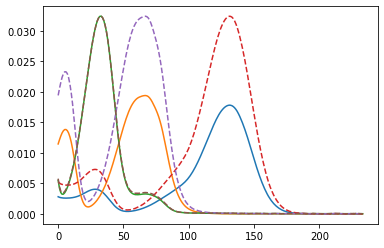

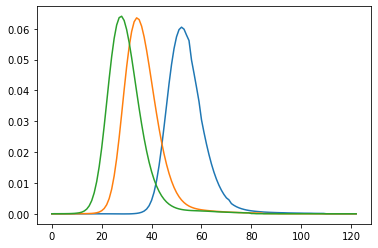

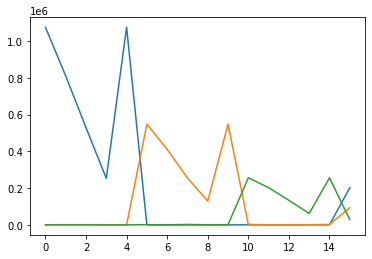

integral_array = [[1.07486879e+06 1.41662636e+02 2.65438684e+02]
 [8.10092440e+05 9.93614832e+02 4.04464279e+02]
 [5.29289888e+05 9.99405302e+01 3.14598068e+02]
 [2.53019401e+05 0.00000000e+00 4.91855437e+01]
 [1.07486879e+06 1.41662636e+02 2.65438684e+02]
 [3.33390251e+02 5.47995836e+05 1.22170875e+03]
 [6.36069004e+02 4.10609958e+05 5.17712391e+02]
 [1.63665937e+02 2.55137137e+05 2.59664063e+03]
 [6.03756293e+02 1.30055986e+05 7.11282158e+02]
 [3.33390251e+02 5.47995836e+05 1.22170875e+03]
 [5.86269267e+02 2.79538816e+03 2.56067726e+05]
 [5.64022320e+02 5.59447570e+02 2.02613974e+05]
 [5.74837074e+02 8.70959248e+02 1.33886301e+05]
 [6.24084950e+02 9.23992374e+02 6.25356571e+04]
 [5.86269267e+02 2.79538816e+03 2.56067726e+05]
 [2.02168699e+05 9.31161299e+04 2.88877383e+04]]
objective_val_non_comp = 21895.98869785176
objective_val_comp = 6545105.453649303
objective_total_sum = 6891174.0092223
impure_peak_sum = 324172.5668751459
----- new PARAFAC decomposition with iteration offset 0 --

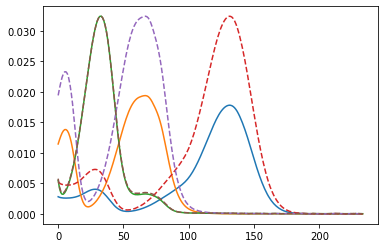

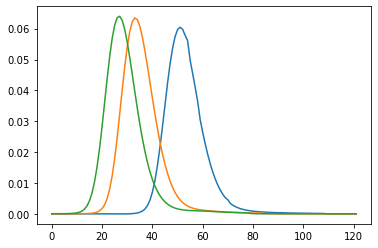

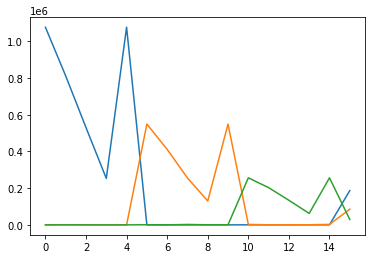

integral_array = [[1.07573187e+06 6.18638462e+01 2.68922090e+02]
 [8.10766754e+05 9.34960906e+02 4.08670963e+02]
 [5.29718206e+05 5.92262019e+01 3.17427051e+02]
 [2.53213153e+05 0.00000000e+00 4.52264870e+01]
 [1.07573187e+06 6.18638462e+01 2.68922090e+02]
 [2.56856760e+02 5.48601388e+05 9.50511065e+02]
 [5.79866695e+02 4.11062322e+05 3.14913583e+02]
 [1.26741283e+02 2.55423663e+05 2.47019765e+03]
 [5.86253602e+02 1.30200233e+05 6.47138055e+02]
 [2.56856760e+02 5.48601388e+05 9.50511065e+02]
 [5.53242264e+02 2.77046187e+03 2.56245085e+05]
 [5.38235951e+02 5.36158053e+02 2.02752073e+05]
 [5.58067290e+02 8.56457382e+02 1.33977673e+05]
 [6.16558748e+02 9.18164110e+02 6.25784113e+04]
 [5.53242264e+02 2.77046187e+03 2.56245085e+05]
 [1.86858964e+05 8.55289265e+04 2.94713901e+04]]
objective_val_non_comp = 20237.979793236198
objective_val_comp = 6550849.173788055
objective_total_sum = 6872946.434071133
impure_peak_sum = 301859.28048984194
----- new PARAFAC decomposition with iteration offset 

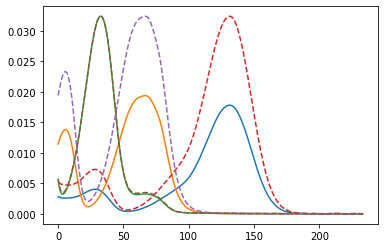

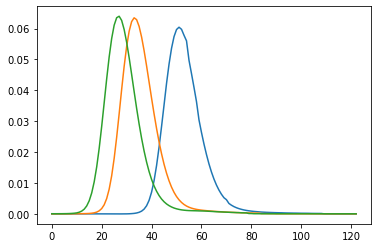

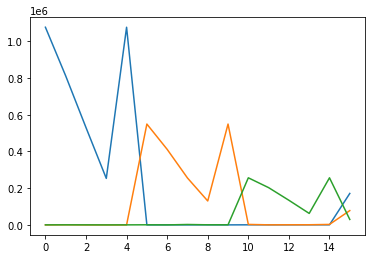

integral_array = [[1.07642625e+06 0.00000000e+00 2.69492615e+02]
 [8.11307560e+05 8.84864186e+02 4.11566920e+02]
 [5.30053352e+05 2.46429345e+01 3.19272680e+02]
 [2.53366648e+05 0.00000000e+00 4.15321527e+01]
 [1.07642625e+06 0.00000000e+00 2.69492615e+02]
 [1.88183230e+02 5.49184931e+05 6.73740762e+02]
 [5.29380079e+02 4.11497659e+05 1.07535277e+02]
 [9.35145533e+01 2.55700897e+05 2.34299025e+03]
 [5.70451246e+02 1.30339270e+05 5.81993821e+02]
 [1.88183230e+02 5.49184931e+05 6.73740762e+02]
 [5.19270257e+02 2.67235828e+03 2.56539421e+05]
 [5.11649105e+02 4.55122102e+02 2.02982406e+05]
 [5.40714931e+02 8.03765907e+02 1.34130069e+05]
 [6.08660276e+02 8.94421406e+02 6.26497380e+04]
 [5.19270257e+02 2.67235828e+03 2.56539421e+05]
 [1.71373698e+05 7.79664658e+04 2.97750274e+04]]
objective_val_non_comp = 18368.168108290563
objective_val_comp = 6556328.809671907
objective_total_sum = 6853812.169076154
impure_peak_sum = 279115.1912959569
----- new PARAFAC decomposition with iteration offset 2

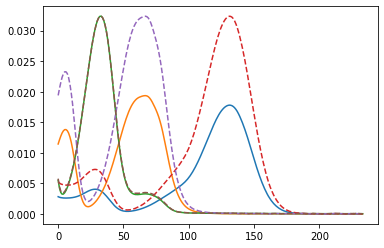

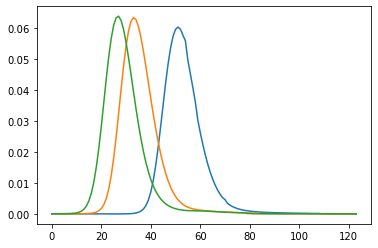

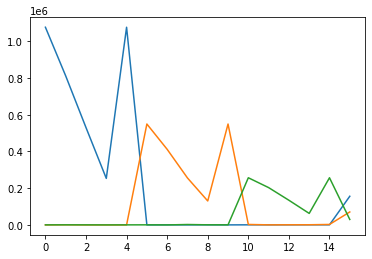

integral_array = [[1.07687188e+06 0.00000000e+00 2.58672855e+02]
 [8.11653759e+05 8.46615074e+02 4.13112091e+02]
 [5.30257847e+05 0.00000000e+00 3.19792009e+02]
 [2.53462208e+05 0.00000000e+00 3.84506970e+01]
 [1.07687188e+06 0.00000000e+00 2.58672855e+02]
 [1.34075456e+02 5.49633480e+05 4.35522146e+02]
 [4.89216870e+02 4.11807862e+05 0.00000000e+00]
 [6.71997278e+01 2.55915329e+05 2.23520013e+03]
 [5.57876764e+02 1.30446171e+05 5.26221612e+02]
 [1.34075456e+02 5.49633480e+05 4.35522146e+02]
 [4.86284703e+02 2.51167057e+03 2.56903073e+05]
 [4.85756801e+02 3.25419444e+02 2.03267344e+05]
 [5.23736522e+02 7.18699104e+02 1.34318631e+05]
 [6.00810367e+02 8.55304394e+02 6.27380331e+04]
 [4.86284703e+02 2.51167057e+03 2.56903073e+05]
 [1.56115727e+05 7.06242938e+04 2.97363477e+04]]
objective_val_non_comp = 16655.863069598134
objective_val_comp = 6560684.047856418
objective_total_sum = 6833816.2798496755
impure_peak_sum = 256476.36892365917
----- new PARAFAC decomposition with iteration offset

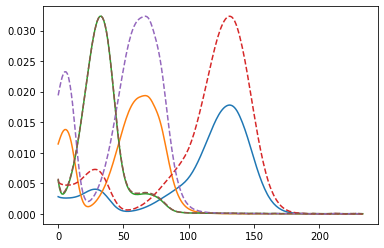

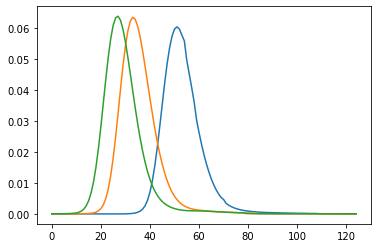

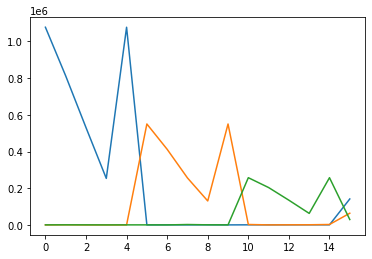

integral_array = [[1.07708323e+06 0.00000000e+00 2.50120399e+02]
 [8.11815069e+05 8.20438067e+02 4.13163739e+02]
 [5.30339813e+05 0.00000000e+00 3.15731728e+02]
 [2.53503499e+05 0.00000000e+00 3.60711832e+01]
 [1.07708323e+06 0.00000000e+00 2.50120399e+02]
 [9.77184507e+01 5.49923549e+05 2.53827177e+02]
 [4.61770465e+02 4.11977325e+05 0.00000000e+00]
 [4.93341331e+01 2.56055469e+05 2.15481932e+03]
 [5.49305132e+02 1.30515321e+05 4.84009674e+02]
 [9.77184507e+01 5.49923549e+05 2.53827177e+02]
 [4.56506172e+02 2.30635058e+03 2.57303464e+05]
 [4.62305121e+02 1.61402741e+02 2.03581373e+05]
 [5.08294856e+02 6.10704216e+02 1.34526475e+05]
 [5.93573584e+02 8.05197846e+02 6.28353834e+04]
 [4.56506172e+02 2.30635058e+03 2.57303464e+05]
 [1.41432372e+05 6.36627838e+04 2.93190901e+04]]
objective_val_non_comp = 15155.167368528762
objective_val_comp = 6563770.222378025
objective_total_sum = 6813339.635198734
impure_peak_sum = 234414.24545218103
----- new PARAFAC decomposition with iteration offset 

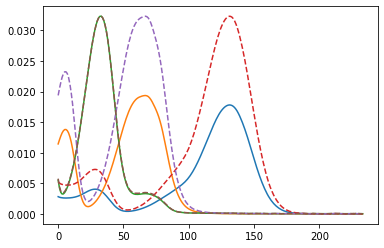

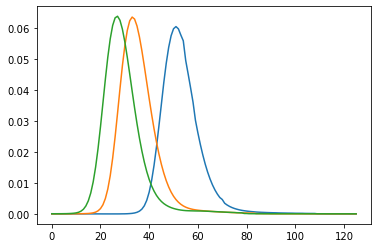

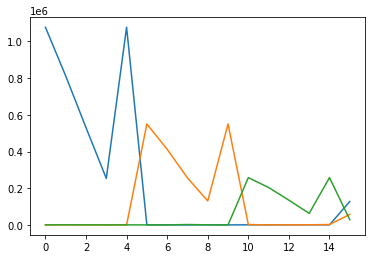

integral_array = [[1.07708291e+06 0.00000000e+00 2.44016755e+02]
 [8.11809444e+05 8.06714234e+02 4.11609690e+02]
 [5.30313303e+05 0.00000000e+00 3.12588034e+02]
 [2.53496214e+05 0.00000000e+00 3.44813673e+01]
 [1.07708291e+06 0.00000000e+00 2.44016755e+02]
 [7.83118064e+01 5.50097192e+05 1.04529131e+02]
 [4.46868121e+02 4.12067507e+05 0.00000000e+00]
 [3.95871775e+01 2.56140835e+05 2.08991834e+03]
 [5.44573723e+02 1.30556731e+05 4.49504757e+02]
 [7.83118064e+01 5.50097192e+05 1.04529131e+02]
 [4.32061979e+02 2.08488283e+03 2.57695835e+05]
 [4.42619970e+02 0.00000000e+00 2.03886241e+05]
 [4.95518568e+02 4.94450732e+02 1.34730425e+05]
 [5.87497007e+02 7.51067164e+02 6.29308835e+04]
 [4.32061979e+02 2.08488283e+03 2.57695835e+05]
 [1.27590006e+05 5.71983416e+04 2.85110085e+04]]
objective_val_non_comp = 13794.603879956572
objective_val_comp = 6565683.453901125
objective_total_sum = 6792777.41376853
impure_peak_sum = 213299.35598744842
----- new PARAFAC decomposition with iteration offset 5

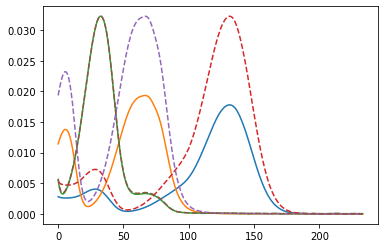

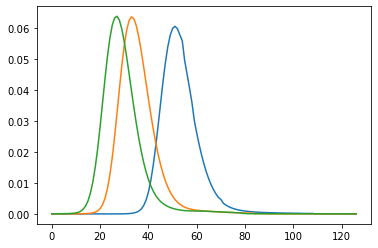

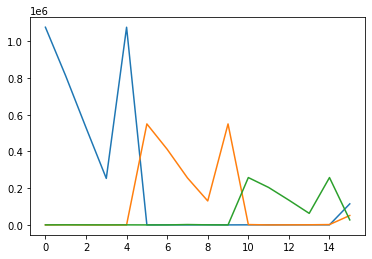

integral_array = [[1.07690397e+06 0.00000000e+00 2.40247883e+02]
 [8.11663485e+05 8.04863283e+02 4.08442496e+02]
 [5.30196874e+05 0.00000000e+00 3.10311610e+02]
 [2.53448315e+05 0.00000000e+00 3.36859686e+01]
 [1.07690397e+06 0.00000000e+00 2.40247883e+02]
 [7.45997082e+01 5.50161532e+05 0.00000000e+00]
 [4.43645919e+02 4.12087078e+05 0.00000000e+00]
 [3.74152090e+01 2.56176251e+05 2.04153564e+03]
 [5.43431110e+02 1.30572752e+05 4.23755402e+02]
 [7.45997082e+01 5.50161532e+05 0.00000000e+00]
 [4.14703475e+02 1.90512913e+03 2.58000688e+05]
 [4.25277669e+02 0.00000000e+00 2.04094036e+05]
 [4.86340150e+02 4.00164056e+02 1.34889049e+05]
 [5.83039544e+02 7.07059978e+02 6.30051332e+04]
 [4.14703475e+02 1.90512913e+03 2.58000688e+05]
 [1.14770310e+05 5.12957054e+04 2.73292264e+04]]
objective_val_non_comp = 12918.32841604217
objective_val_comp = 6566265.364042621
objective_total_sum = 6772578.934381419
impure_peak_sum = 193395.24192275532
----- new PARAFAC decomposition with iteration offset 6

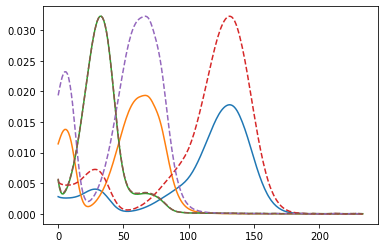

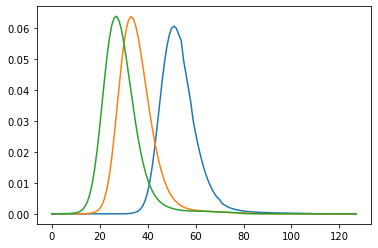

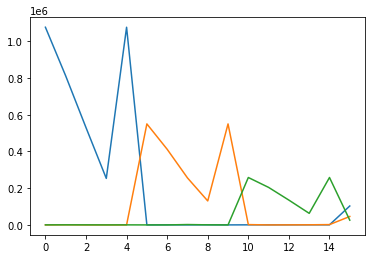

integral_array = [[1.07658474e+06 0.00000000e+00 2.38637627e+02]
 [8.11408033e+05 8.13297138e+02 4.04081577e+02]
 [5.30011343e+05 0.00000000e+00 3.08950298e+02]
 [2.53368764e+05 0.00000000e+00 3.35801677e+01]
 [1.07658474e+06 0.00000000e+00 2.38637627e+02]
 [8.51555230e+01 5.50086650e+05 0.00000000e+00]
 [4.51297941e+02 4.12028889e+05 0.00000000e+00]
 [4.22262571e+01 2.56152029e+05 2.02363159e+03]
 [5.45615309e+02 1.30558718e+05 4.13522232e+02]
 [8.51555230e+01 5.50086650e+05 0.00000000e+00]
 [4.05595326e+02 1.73532630e+03 2.58254215e+05]
 [4.14619165e+02 0.00000000e+00 2.04263567e+05]
 [4.81385109e+02 3.11404906e+02 1.35021189e+05]
 [5.80518106e+02 6.65433748e+02 6.30669903e+04]
 [4.05595326e+02 1.73532630e+03 2.58254215e+05]
 [1.03074768e+05 4.59646992e+04 2.58251720e+04]]
objective_val_non_comp = 12418.99308644978
objective_val_comp = 6565730.726825139
objective_total_sum = 6753014.358858976
impure_peak_sum = 174864.63894738565
----- new PARAFAC decomposition with iteration offset 7

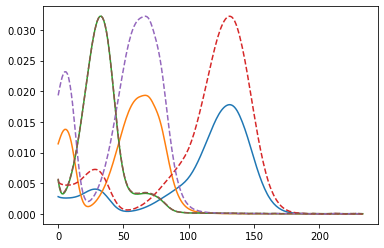

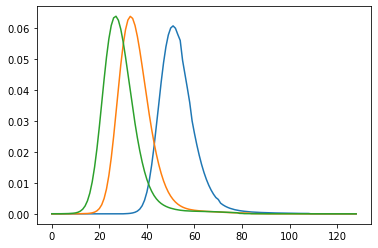

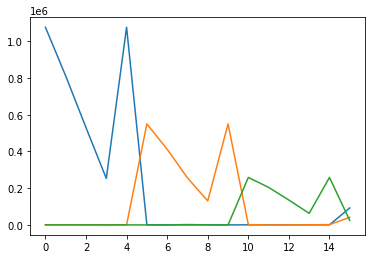

integral_array = [[1.07616348e+06 0.00000000e+00 2.38803798e+02]
 [8.11073871e+05 8.30372344e+02 3.98752073e+02]
 [5.29777084e+05 0.00000000e+00 3.08403224e+02]
 [2.53266445e+05 0.00000000e+00 3.40207206e+01]
 [1.07616348e+06 0.00000000e+00 2.38803798e+02]
 [1.06590669e+02 5.49965427e+05 0.00000000e+00]
 [4.66949898e+02 4.11936251e+05 0.00000000e+00]
 [5.22920258e+01 2.56102865e+05 2.01356574e+03]
 [5.50293141e+02 1.30532227e+05 4.07370833e+02]
 [1.06590669e+02 5.49965427e+05 0.00000000e+00]
 [4.05114671e+02 1.58778560e+03 2.58439646e+05]
 [4.11202389e+02 0.00000000e+00 2.04383885e+05]
 [4.80879120e+02 2.34290037e+02 1.35118154e+05]
 [5.80054687e+02 6.29206963e+02 6.31123330e+04]
 [4.05114671e+02 1.58778560e+03 2.58439646e+05]
 [9.25338308e+04 4.11961848e+04 2.40572070e+04]]
objective_val_non_comp = 12074.242661371909
objective_val_comp = 6564440.216499246
objective_total_sum = 6734301.681775194
impure_peak_sum = 157787.22261457524
----- new PARAFAC decomposition with iteration offset 

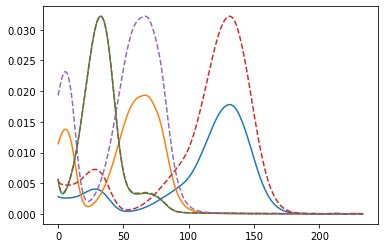

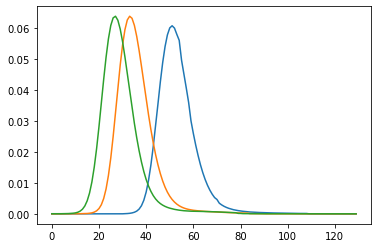

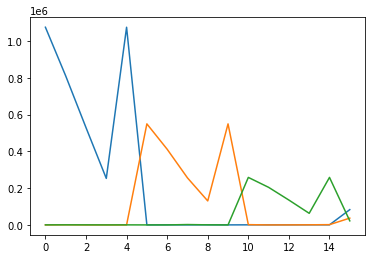

integral_array = [[1.07567471e+06 0.00000000e+00 2.40340560e+02]
 [8.10688608e+05 8.54153622e+02 3.92813025e+02]
 [5.29511842e+05 1.07153700e+01 3.06137727e+02]
 [2.53149266e+05 0.00000000e+00 3.48397340e+01]
 [1.07567471e+06 0.00000000e+00 2.40340560e+02]
 [1.36458461e+02 5.49811790e+05 0.00000000e+00]
 [4.88807662e+02 4.11819594e+05 0.00000000e+00]
 [6.64475889e+01 2.56035725e+05 2.01005691e+03]
 [5.56917573e+02 1.30496799e+05 4.04685963e+02]
 [1.36458461e+02 5.49811790e+05 0.00000000e+00]
 [4.12890750e+02 1.46742132e+03 2.58552265e+05]
 [4.14840911e+02 0.00000000e+00 2.04452073e+05]
 [4.84648079e+02 1.71385779e+02 1.35177396e+05]
 [5.81584067e+02 5.99594905e+02 6.31399863e+04]
 [4.12890750e+02 1.46742132e+03 2.58552265e+05]
 [8.31232447e+04 3.69510324e+04 2.20997930e+04]]
objective_val_non_comp = 11891.851093784851
objective_val_comp = 6562548.823052537
objective_total_sum = 6716614.7442095755
impure_peak_sum = 142174.07006325392
----- new PARAFAC decomposition with iteration offset

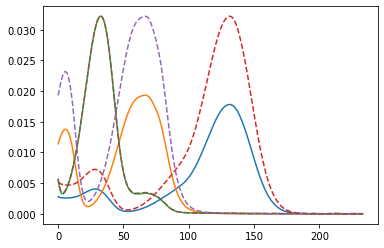

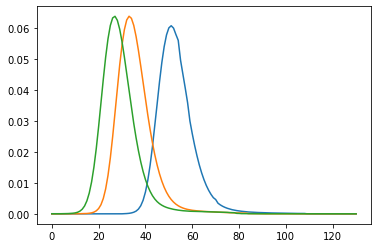

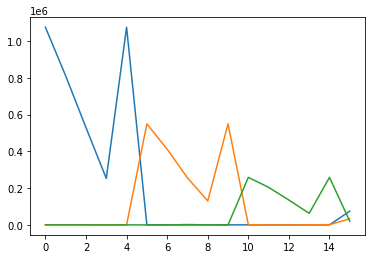

integral_array = [[1.07514805e+06 0.00000000e+00 2.42839923e+02]
 [8.10275728e+05 8.82693054e+02 3.86596710e+02]
 [5.29230772e+05 3.10472664e+01 3.02239741e+02]
 [2.53023956e+05 0.00000000e+00 3.58711617e+01]
 [1.07514805e+06 0.00000000e+00 2.42839923e+02]
 [1.72456110e+02 5.49636981e+05 0.00000000e+00]
 [5.15183796e+02 4.11687320e+05 0.00000000e+00]
 [8.35893365e+01 2.55956378e+05 2.01176047e+03]
 [5.64970679e+02 1.30455343e+05 4.04800576e+02]
 [1.72456110e+02 5.49636981e+05 0.00000000e+00]
 [4.27887644e+02 1.37563208e+03 2.58594112e+05]
 [4.24747972e+02 0.00000000e+00 2.04469868e+05]
 [4.92167754e+02 1.23430175e+02 1.35199875e+05]
 [5.84872040e+02 5.76952289e+02 6.31504157e+04]
 [4.27887644e+02 1.37563208e+03 2.58594112e+05]
 [7.47797764e+04 3.31769355e+04 2.00307809e+04]]
objective_val_non_comp = 11858.554530317364
objective_val_comp = 6560207.943416159
objective_total_sum = 6700053.990689786
impure_peak_sum = 127987.49274331034
----- new PARAFAC decomposition with iteration offset 

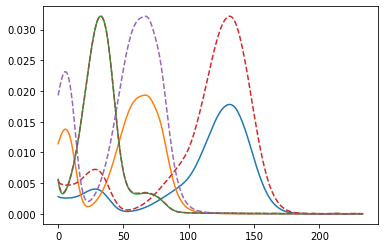

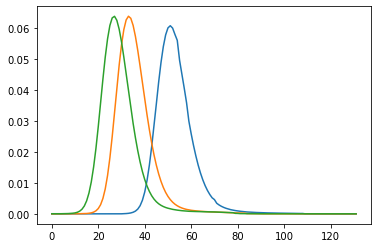

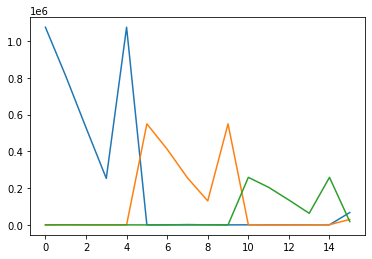

integral_array = [[1.07459987e+06 4.13159495e+01 2.36935957e+02]
 [8.09849051e+05 9.15075436e+02 3.80438298e+02]
 [5.28942813e+05 5.37076386e+01 2.98362510e+02]
 [2.52894416e+05 0.00000000e+00 3.70631031e+01]
 [1.07459987e+06 4.13159495e+01 2.36935957e+02]
 [2.12554958e+02 5.49449554e+05 0.00000000e+00]
 [5.44581993e+02 4.11545810e+05 0.00000000e+00]
 [1.02750687e+02 2.55869336e+05 2.01737557e+03]
 [5.73988512e+02 1.30410124e+05 4.07052741e+02]
 [2.12554958e+02 5.49449554e+05 0.00000000e+00]
 [4.48591052e+02 1.31051105e+03 2.58573243e+05]
 [4.39692717e+02 0.00000000e+00 2.04443138e+05]
 [5.02658820e+02 8.94377582e+01 1.35189692e+05]
 [5.89558487e+02 5.60825268e+02 6.31455586e+04]
 [4.48591052e+02 1.31051105e+03 2.58573243e+05]
 [6.74142772e+04 2.98169596e+04 1.79250067e+04]]
objective_val_non_comp = 12012.38748255173
objective_val_comp = 6557535.27356721
objective_total_sum = 6684703.904634764
impure_peak_sum = 115156.2435850026
----- new PARAFAC decomposition with iteration offset 11 

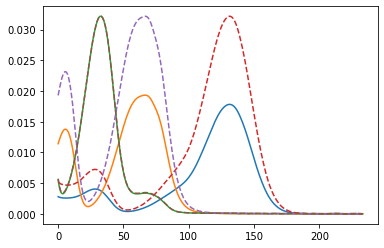

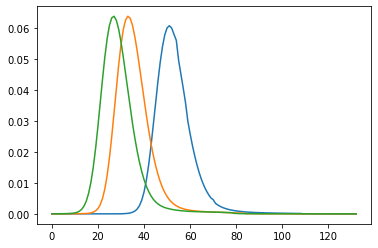

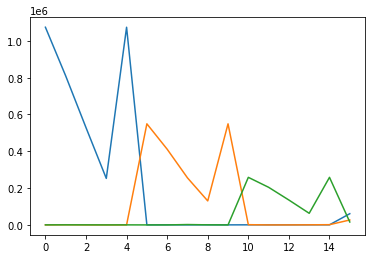

integral_array = [[1.07405504e+06 8.63626824e+01 2.30519004e+02]
 [8.09426983e+05 9.48975582e+02 3.74478456e+02]
 [5.28659658e+05 7.71333299e+01 2.94558112e+02]
 [2.52766074e+05 0.00000000e+00 3.82558553e+01]
 [1.07405504e+06 8.63626824e+01 2.30519004e+02]
 [2.54870058e+02 5.49256340e+05 0.00000000e+00]
 [5.75625836e+02 4.11400148e+05 0.00000000e+00]
 [1.23010073e+02 2.55778349e+05 2.02553276e+03]
 [5.83544359e+02 1.30362999e+05 4.10792895e+02]
 [2.54870058e+02 5.49256340e+05 0.00000000e+00]
 [4.73275345e+02 1.27419271e+03 2.58493577e+05]
 [4.58348069e+02 0.00000000e+00 2.04375222e+05]
 [5.15231515e+02 7.05305072e+01 1.35148808e+05]
 [5.95235053e+02 5.51742357e+02 6.31263429e+04]
 [4.73275345e+02 1.27419271e+03 2.58493577e+05]
 [6.09315467e+04 2.68161470e+04 1.58484479e+04]]
objective_val_non_comp = 12281.434362719518
objective_val_comp = 6554654.498407578
objective_total_sum = 6670532.0743288845
impure_peak_sum = 103596.14155858666
----- new PARAFAC decomposition with iteration offset

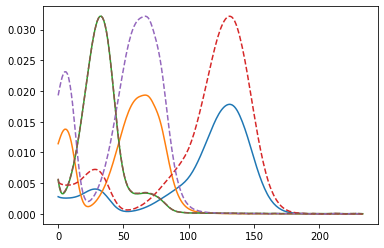

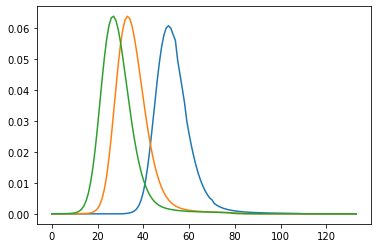

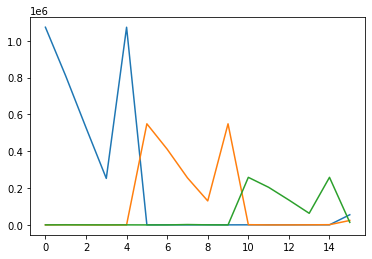

integral_array = [[1.07352754e+06 1.31357009e+02 2.24238222e+02]
 [8.09020044e+05 9.83030450e+02 3.68872431e+02]
 [5.28387872e+05 1.00405406e+02 2.90921108e+02]
 [2.52642043e+05 0.00000000e+00 3.93953896e+01]
 [1.07352754e+06 1.31357009e+02 2.24238222e+02]
 [2.97854592e+02 5.49061873e+05 0.00000000e+00]
 [6.07179187e+02 4.11253702e+05 0.00000000e+00]
 [1.43614285e+02 2.55685777e+05 2.03555137e+03]
 [5.93282849e+02 1.30315204e+05 4.15545966e+02]
 [2.97854592e+02 5.49061873e+05 0.00000000e+00]
 [5.00162732e+02 1.25013676e+03 2.58383263e+05]
 [4.78988227e+02 0.00000000e+00 2.04285226e+05]
 [5.28964887e+02 5.80709385e+01 1.35091851e+05]
 [6.01472582e+02 5.45668198e+02 6.30996226e+04]
 [5.00162732e+02 1.25013676e+03 2.58383263e+05]
 [5.52344224e+04 2.41236650e+04 1.38573568e+04]]
objective_val_non_comp = 12598.46190093135
objective_val_comp = 6551726.6918250155
objective_total_sum = 6657540.597949934
impure_peak_sum = 93215.44422398762
----- new PARAFAC decomposition with iteration offset 1

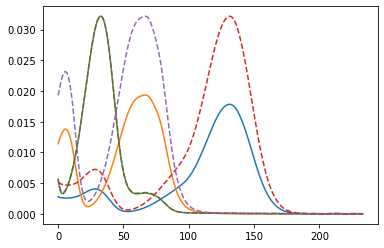

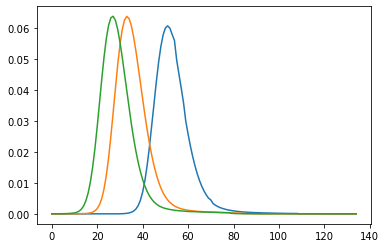

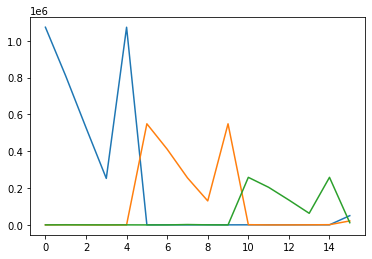

integral_array = [[1.07302704e+06 1.74984691e+02 2.18235364e+02]
 [8.08635365e+05 1.01621491e+03 3.63669893e+02]
 [5.28131841e+05 1.22849173e+02 2.87488603e+02]
 [2.52524460e+05 0.00000000e+00 4.04539243e+01]
 [1.07302704e+06 1.74984691e+02 2.18235364e+02]
 [3.40158302e+02 5.48869949e+05 0.00000000e+00]
 [6.38247302e+02 4.11109289e+05 0.00000000e+00]
 [1.63907985e+02 2.55593830e+05 2.04638063e+03]
 [6.02890990e+02 1.30267818e+05 4.20818248e+02]
 [3.40158302e+02 5.48869949e+05 0.00000000e+00]
 [5.27675969e+02 1.23945083e+03 2.58248025e+05]
 [5.00387440e+02 0.00000000e+00 2.04177794e+05]
 [5.43041002e+02 5.26342799e+01 1.35021778e+05]
 [6.07888082e+02 5.42875513e+02 6.30667819e+04]
 [5.27675969e+02 1.23945083e+03 2.58248025e+05]
 [5.02313909e+04 2.16972680e+04 1.19935372e+04]]
objective_val_non_comp = 12950.75828312789
objective_val_comp = 6548818.994245612
objective_total_sum = 6645691.94867473
impure_peak_sum = 83922.19614599015
----- new PARAFAC decomposition with iteration offset 14 

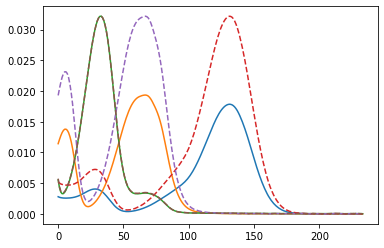

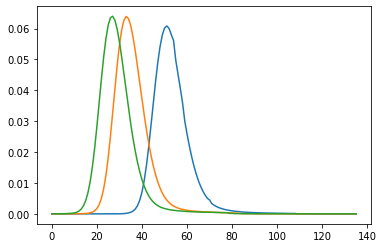

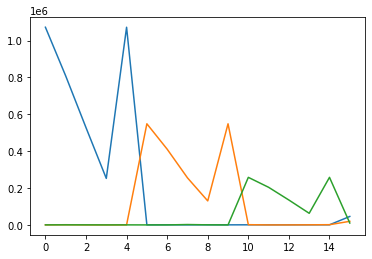

integral_array = [[1.07256000e+06 2.16259921e+02 2.12641256e+02]
 [8.08277545e+05 1.04772199e+03 3.58914754e+02]
 [5.27894334e+05 1.43953897e+02 2.84312906e+02]
 [2.52414778e+05 0.00000000e+00 4.14372240e+01]
 [1.07256000e+06 2.16259921e+02 2.12641256e+02]
 [3.80777004e+02 5.48679585e+05 3.28522308e+00]
 [6.68102010e+02 4.10966988e+05 0.00000000e+00]
 [1.83402222e+02 2.55502326e+05 2.05877402e+03]
 [6.12135721e+02 1.30220766e+05 4.26921566e+02]
 [3.80777004e+02 5.48679585e+05 3.28522308e+00]
 [5.54510475e+02 1.23204036e+03 2.58107234e+05]
 [5.21321914e+02 0.00000000e+00 2.04066344e+05]
 [5.56782515e+02 4.89579322e+01 1.34948681e+05]
 [6.14163239e+02 5.40898722e+02 6.30325471e+04]
 [5.54510475e+02 1.23204036e+03 2.58107234e+05]
 [4.58393258e+04 1.95012876e+04 1.02869108e+04]]
objective_val_non_comp = 13306.829104632514
objective_val_comp = 6546017.95001824
objective_total_sum = 6634952.303358399
impure_peak_sum = 75627.52423552671
----- new PARAFAC decomposition with iteration offset 15

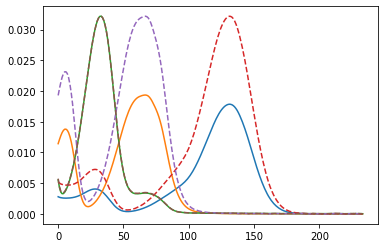

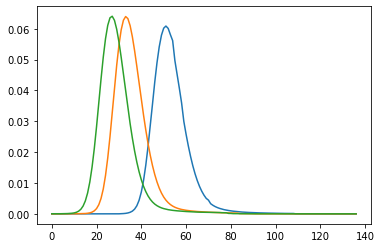

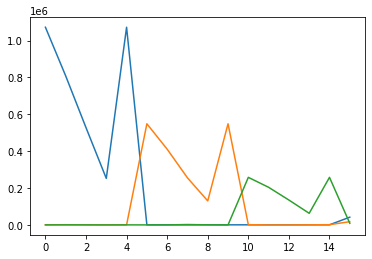

integral_array = [[1.07213064e+06 2.54496341e+02 2.07534020e+02]
 [8.07949453e+05 1.07693984e+03 3.54611218e+02]
 [5.27677030e+05 1.63380594e+02 2.81397712e+02]
 [2.52313945e+05 0.00000000e+00 4.23517994e+01]
 [1.07213064e+06 2.54496341e+02 2.07534020e+02]
 [4.19071896e+02 5.48470047e+05 4.47968080e+01]
 [6.96390327e+02 4.10820084e+05 0.00000000e+00]
 [2.01831852e+02 2.55405453e+05 2.07772943e+03]
 [6.20892398e+02 1.30171040e+05 4.36490808e+02]
 [4.19071896e+02 5.48470047e+05 4.47968080e+01]
 [5.79717844e+02 1.23530637e+03 2.57957200e+05]
 [5.41182934e+02 0.00000000e+00 2.03949287e+05]
 [5.69695215e+02 5.09792264e+01 1.34870616e+05]
 [6.20065806e+02 5.41545394e+02 6.29960196e+04]
 [5.79717844e+02 1.23530637e+03 2.57957200e+05]
 [4.19867129e+04 1.75068968e+04 8.75477783e+03]]
objective_val_non_comp = 13757.33111531176
objective_val_comp = 6543268.693660164
objective_total_sum = 6625274.412316475
impure_peak_sum = 68248.3875409993
----- new PARAFAC decomposition with iteration offset 16 

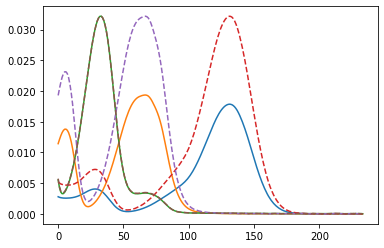

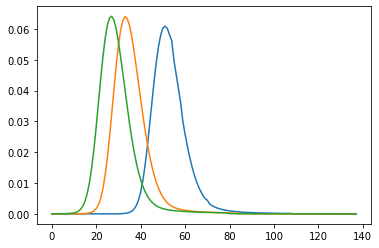

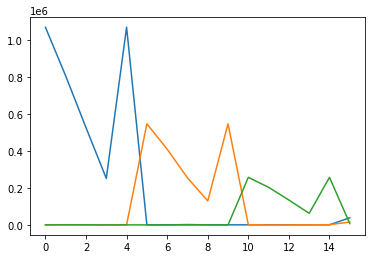

integral_array = [[1.07174091e+06 2.89301853e+02 2.02967590e+02]
 [8.07652268e+05 1.10356404e+03 3.50726714e+02]
 [5.27480540e+05 1.80916214e+02 2.78772216e+02]
 [2.52222389e+05 0.00000000e+00 4.32029884e+01]
 [1.07174091e+06 2.89301853e+02 2.02967590e+02]
 [4.54122391e+02 5.48271526e+05 8.36439428e+01]
 [7.22286539e+02 4.10680830e+05 0.00000000e+00]
 [2.18702748e+02 2.55313589e+05 2.09535128e+03]
 [6.28915751e+02 1.30123923e+05 4.45436850e+02]
 [4.54122391e+02 5.48271526e+05 8.36439428e+01]
 [6.02669811e+02 1.24114969e+03 2.57812672e+05]
 [5.59320046e+02 0.00000000e+00 2.03836837e+05]
 [5.81455389e+02 5.43494720e+01 1.34795331e+05]
 [6.25441821e+02 5.42834213e+02 6.29608028e+04]
 [6.02669811e+02 1.24114969e+03 2.57812672e+05]
 [3.86093315e+04 1.56930930e+04 7.40388480e+03]]
objective_val_non_comp = 14178.986846534237
objective_val_comp = 6540716.721977857
objective_total_sum = 6616602.018088367
impure_peak_sum = 61706.3092639744
----- new PARAFAC decomposition with iteration offset 17

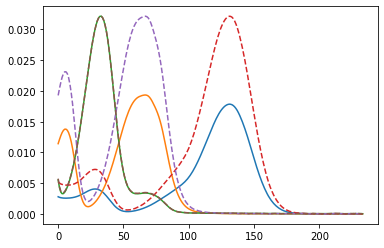

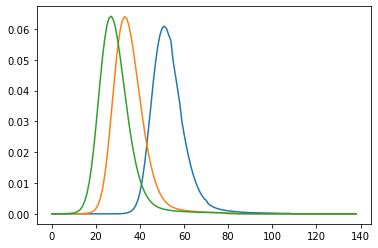

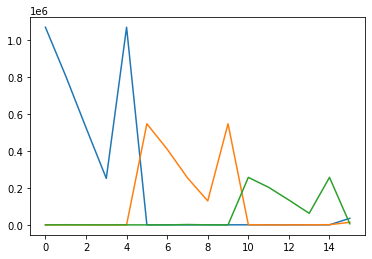

integral_array = [[1.07139101e+06 3.20509031e+02 1.98959390e+02]
 [8.07385878e+05 1.12741251e+03 3.47255027e+02]
 [5.27304666e+05 1.96480566e+02 2.76447707e+02]
 [2.52140151e+05 0.00000000e+00 4.39950947e+01]
 [1.07139101e+06 3.20509031e+02 1.98959390e+02]
 [4.85558952e+02 5.48085758e+05 1.18973682e+02]
 [7.45513314e+02 4.10550299e+05 0.00000000e+00]
 [2.33835710e+02 2.55227555e+05 2.11129526e+03]
 [6.36116591e+02 1.30079826e+05 4.53568901e+02]
 [4.85558952e+02 5.48085758e+05 1.18973682e+02]
 [6.23038391e+02 1.24772983e+03 2.57679295e+05]
 [5.75439762e+02 0.00000000e+00 2.03733151e+05]
 [5.91892579e+02 5.80957822e+01 1.34725796e+05]
 [6.30209836e+02 5.44313991e+02 6.29282821e+04]
 [6.23038391e+02 1.24772983e+03 2.57679295e+05]
 [3.56496137e+04 1.40421667e+04 6.23300656e+03]]
objective_val_non_comp = 14561.411182567066
objective_val_comp = 6538387.729373271
objective_total_sum = 6608873.927440308
impure_peak_sum = 55924.786884471265
----- new PARAFAC decomposition with iteration offset 

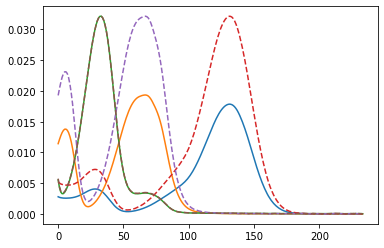

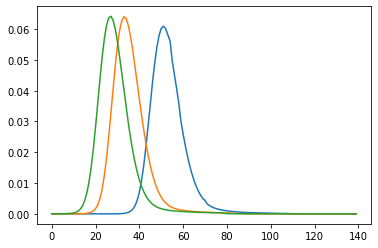

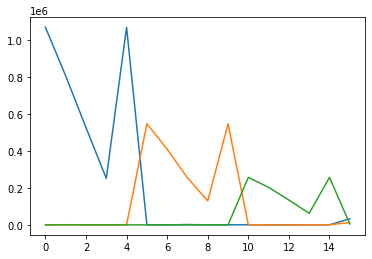

integral_array = [[1.07107972e+06 3.48135072e+02 1.95502737e+02]
 [8.07149145e+05 1.14845483e+03 3.44190917e+02]
 [5.27148563e+05 2.10094643e+02 2.74427528e+02]
 [2.52066955e+05 0.00000000e+00 4.47304392e+01]
 [1.07107972e+06 3.48135072e+02 1.95502737e+02]
 [5.13225128e+02 5.47913997e+05 1.50250528e+02]
 [7.65951485e+02 4.10429283e+05 0.00000000e+00]
 [2.47155378e+02 2.55147950e+05 2.12535201e+03]
 [6.42455807e+02 1.30039045e+05 4.60767020e+02]
 [5.13225128e+02 5.47913997e+05 1.50250528e+02]
 [6.40729128e+02 1.25396874e+03 2.57560539e+05]
 [5.89447044e+02 0.00000000e+00 2.03640809e+05]
 [6.00956729e+02 6.16453677e+01 1.34663841e+05]
 [6.34345295e+02 5.45720120e+02 6.28993127e+04]
 [6.40729128e+02 1.25396874e+03 2.57560539e+05]
 [3.30555710e+04 1.25400709e+04 5.23441931e+03]]
objective_val_non_comp = 14899.31728119307
objective_val_comp = 6536293.423184854
objective_total_sum = 6602022.801700952
impure_peak_sum = 50830.061234906156
----- new PARAFAC decomposition with iteration offset 1

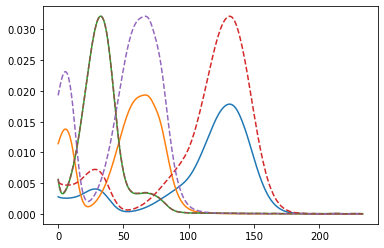

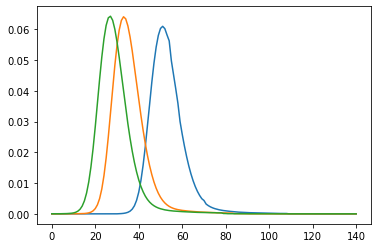

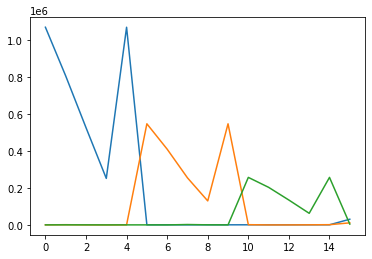

integral_array = [[1.07080452e+06 3.72340936e+02 1.92571952e+02]
 [8.06940002e+05 1.16678741e+03 3.41531053e+02]
 [5.27010798e+05 2.21859981e+02 2.72708271e+02]
 [2.52002214e+05 0.00000000e+00 4.54101130e+01]
 [1.07080452e+06 3.72340936e+02 1.92571952e+02]
 [5.37140684e+02 5.47757266e+05 1.77064631e+02]
 [7.83612269e+02 4.10318438e+05 0.00000000e+00]
 [2.58672252e+02 2.55075265e+05 2.13736028e+03]
 [6.47935134e+02 1.30001826e+05 4.66937433e+02]
 [5.37140684e+02 5.47757266e+05 1.77064631e+02]
 [6.55816446e+02 1.25933029e+03 2.57458095e+05]
 [6.01390004e+02 0.00000000e+00 2.03561083e+05]
 [6.08685066e+02 6.47101688e+01 1.34610367e+05]
 [6.37864470e+02 5.46921060e+02 6.28743135e+04]
 [6.55816446e+02 1.25933029e+03 2.57458095e+05]
 [3.07778212e+04 1.11756114e+04 4.39576494e+03]]
objective_val_non_comp = 15190.914832218938
objective_val_comp = 6534434.074023651
objective_total_sum = 6595974.186339478
impure_peak_sum = 46349.19748360825
----- new PARAFAC decomposition with iteration offset 2

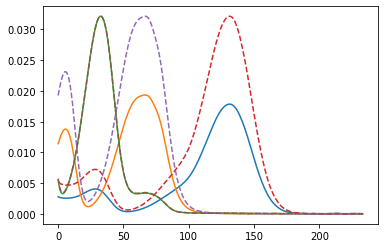

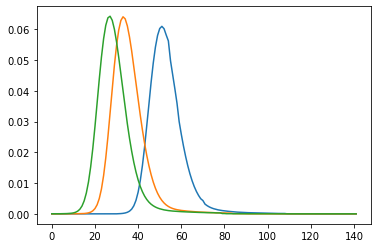

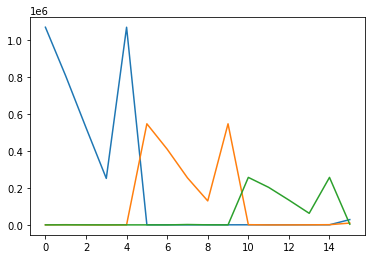

integral_array = [[1.07056185e+06 3.93384629e+02 1.90131823e+02]
 [8.06755656e+05 1.18260047e+03 3.39270864e+02]
 [5.26889482e+05 2.31934919e+02 2.71280094e+02]
 [2.51945101e+05 0.00000000e+00 4.60350280e+01]
 [1.07056185e+06 3.93384629e+02 1.90131823e+02]
 [5.57471124e+02 5.47616140e+05 1.99303814e+02]
 [7.98614758e+02 4.10218157e+05 0.00000000e+00]
 [2.68466790e+02 2.55009782e+05 2.14728427e+03]
 [6.52590412e+02 1.29968306e+05 4.72054012e+02]
 [5.57471124e+02 5.47616140e+05 1.99303814e+02]
 [6.68485913e+02 1.26375503e+03 2.57372112e+05]
 [6.11413483e+02 0.00000000e+00 2.03494114e+05]
 [6.15172338e+02 6.72541294e+01 1.34565466e+05]
 [6.40810495e+02 5.47902286e+02 6.28533268e+04]
 [6.68485913e+02 1.26375503e+03 2.57372112e+05]
 [2.87685611e+04 9.93975991e+03 3.70164788e+03]]
objective_val_non_comp = 15437.749008433346
objective_val_comp = 6532799.604434746
objective_total_sum = 6590647.322327061
impure_peak_sum = 42409.96888388092
----- new PARAFAC decomposition with iteration offset 2

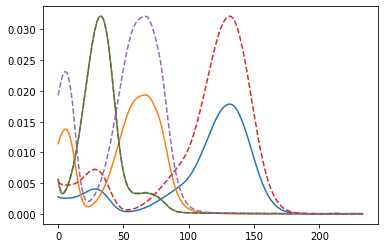

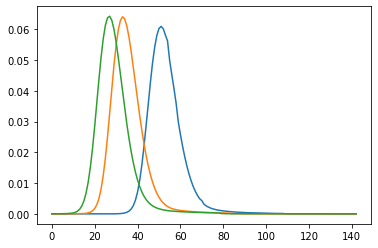

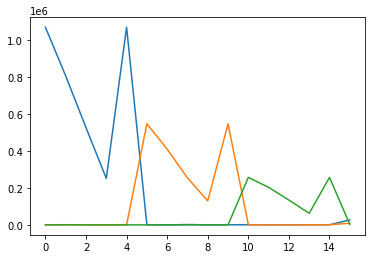

integral_array = [[1.07034765e+06 4.11570140e+02 1.88146065e+02]
 [8.06592959e+05 1.19613394e+03 3.37403360e+02]
 [5.26782505e+05 2.40505752e+02 2.70127924e+02]
 [2.51894672e+05 0.00000000e+00 4.66093822e+01]
 [1.07034765e+06 4.11570140e+02 1.88146065e+02]
 [5.74511908e+02 5.47489727e+05 2.17934229e+02]
 [8.11178225e+02 4.10128013e+05 0.00000000e+00]
 [2.76681234e+02 2.54951093e+05 2.15559132e+03]
 [6.56487989e+02 1.29938274e+05 4.76345799e+02]
 [5.74511908e+02 5.47489727e+05 2.17934229e+02]
 [6.78986258e+02 1.26707525e+03 2.57302150e+05]
 [6.19710378e+02 0.00000000e+00 2.03439545e+05]
 [6.20545547e+02 6.91928242e+01 1.34528919e+05]
 [6.43241719e+02 5.48623384e+02 6.28362488e+04]
 [6.78986258e+02 1.26707525e+03 2.57302150e+05]
 [2.69829039e+04 8.82490220e+03 3.13507135e+03]]
objective_val_non_comp = 15644.826477696522
objective_val_comp = 6531371.274100551
objective_total_sum = 6585958.978000268
impure_peak_sum = 38942.87742201971
----- new PARAFAC decomposition with iteration offset 2

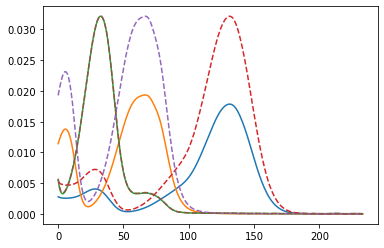

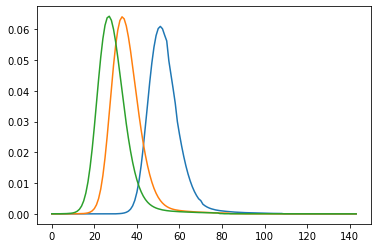

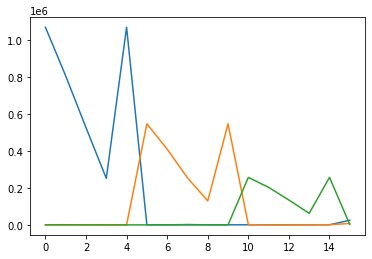

integral_array = [[1.07015761e+06 4.27219710e+02 1.86577301e+02]
 [8.06448622e+05 1.20765934e+03 3.35910036e+02]
 [5.26687675e+05 2.47768909e+02 2.69231440e+02]
 [2.51849923e+05 0.00000000e+00 4.71380209e+01]
 [1.07015761e+06 4.27219710e+02 1.86577301e+02]
 [5.88587382e+02 5.47378451e+05 2.32768108e+02]
 [8.21538998e+02 4.10048270e+05 0.00000000e+00]
 [2.83471666e+02 2.54899407e+05 2.16219545e+03]
 [6.59701186e+02 1.29911831e+05 4.79765662e+02]
 [5.88587382e+02 5.47378451e+05 2.32768108e+02]
 [6.87596699e+02 1.26953693e+03 2.57246721e+05]
 [6.26504883e+02 0.00000000e+00 2.03396267e+05]
 [6.24947810e+02 7.06515598e+01 1.34499958e+05]
 [6.45223653e+02 5.49144861e+02 6.28227183e+04]
 [6.87596699e+02 1.26953693e+03 2.57246721e+05]
 [2.53790650e+04 7.82426935e+03 2.67858286e+03]]
objective_val_non_comp = 15815.425740450975
objective_val_comp = 6530130.239520836
objective_total_sum = 6581827.582498832
impure_peak_sum = 35881.91723754536
----- new PARAFAC decomposition with iteration offset 2

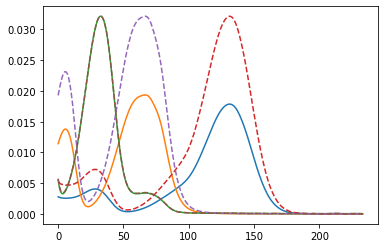

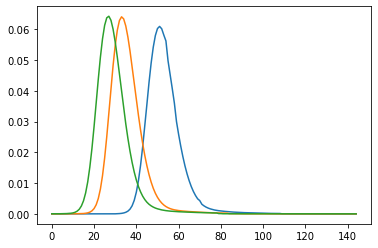

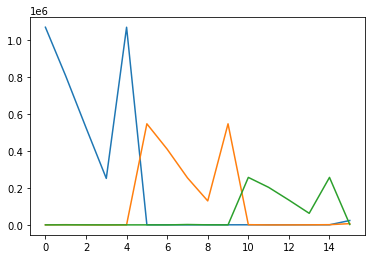

integral_array = [[1.06998721e+06 4.40657691e+02 1.85389381e+02]
 [8.06319209e+05 1.21745620e+03 3.34769417e+02]
 [5.26602712e+05 2.53920666e+02 2.68568889e+02]
 [2.51809787e+05 0.00000000e+00 4.76283536e+01]
 [1.06998721e+06 4.40657691e+02 1.85389381e+02]
 [6.00071594e+02 5.47281717e+05 2.44315115e+02]
 [8.29972890e+02 4.09978607e+05 0.00000000e+00]
 [2.89017458e+02 2.54854457e+05 2.16733275e+03]
 [6.62314393e+02 1.29888839e+05 4.82431209e+02]
 [6.00071594e+02 5.47281717e+05 2.44315115e+02]
 [6.94603101e+02 1.27134524e+03 2.57204072e+05]
 [6.32025768e+02 0.00000000e+00 2.03362944e+05]
 [6.28525214e+02 7.17395876e+01 1.34477670e+05]
 [6.46823270e+02 5.49517370e+02 6.28123083e+04]
 [6.94603101e+02 1.27134524e+03 2.57204072e+05]
 [2.39163232e+04 6.93152566e+03 2.31516740e+03]]
objective_val_non_comp = 15954.80767274657
objective_val_comp = 6529052.531103317
objective_total_sum = 6578170.355036951
impure_peak_sum = 33163.01626088671
----- new PARAFAC decomposition with iteration offset 24

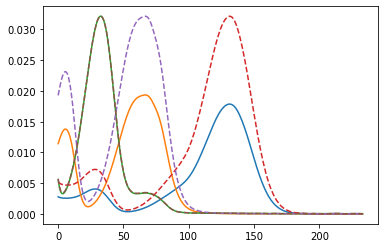

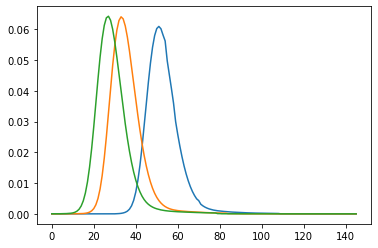

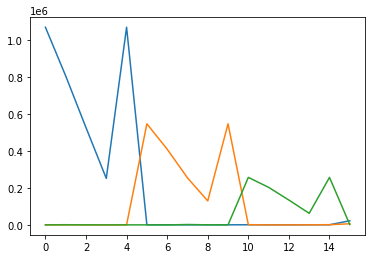

integral_array = [[1.06983224e+06 4.52183295e+02 1.84547834e+02]
 [8.06201551e+05 1.22578492e+03 3.33954182e+02]
 [5.26525516e+05 2.59139217e+02 2.68116621e+02]
 [2.51773283e+05 0.00000000e+00 4.80885397e+01]
 [1.06983224e+06 4.52183295e+02 1.84547834e+02]
 [6.09345541e+02 5.47198563e+05 2.53247341e+02]
 [8.36761332e+02 4.09918473e+05 0.00000000e+00]
 [2.93500801e+02 2.54815801e+05 2.17131226e+03]
 [6.64413758e+02 1.29869070e+05 4.84498333e+02]
 [6.09345541e+02 5.47198563e+05 2.53247341e+02]
 [7.00281561e+02 1.27265516e+03 2.57172357e+05]
 [6.36493388e+02 0.00000000e+00 2.03338156e+05]
 [6.31418605e+02 7.25416232e+01 1.34461096e+05]
 [6.48105530e+02 5.49779096e+02 6.28045690e+04]
 [7.00281561e+02 1.27265516e+03 2.57172357e+05]
 [2.25586481e+04 6.14037228e+03 2.02887622e+03]]
objective_val_non_comp = 16068.429669589555
objective_val_comp = 6528113.834143574
objective_total_sum = 6574910.160410325
impure_peak_sum = 30727.896597160532
----- new PARAFAC decomposition with iteration offset 

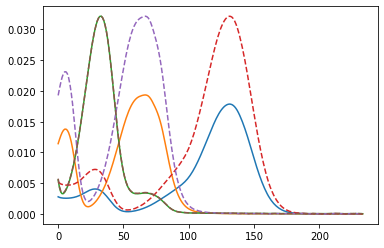

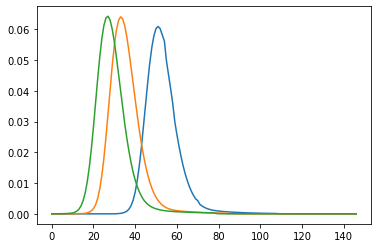

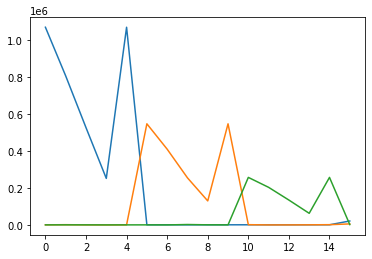

integral_array = [[1.06968934e+06 4.62056000e+02 1.84017384e+02]
 [8.06093104e+05 1.23287026e+03 3.33430115e+02]
 [5.26454401e+05 2.63574348e+02 2.67848665e+02]
 [2.51739622e+05 0.00000000e+00 4.85250309e+01]
 [1.06968934e+06 4.62056000e+02 1.84017384e+02]
 [6.16767286e+02 5.47128075e+05 2.60056797e+02]
 [8.42169178e+02 4.09867303e+05 0.00000000e+00]
 [2.97092614e+02 2.54783020e+05 2.17435755e+03]
 [6.66080592e+02 1.29852306e+05 4.86080214e+02]
 [6.16767286e+02 5.47128075e+05 2.60056797e+02]
 [7.04885420e+02 1.27357146e+03 2.57149795e+05]
 [6.40109392e+02 0.00000000e+00 2.03320520e+05]
 [6.33757320e+02 7.31154138e+01 1.34449305e+05]
 [6.49130283e+02 5.49955458e+02 6.27990653e+04]
 [7.04885420e+02 1.27357146e+03 2.57149795e+05]
 [2.12780453e+04 5.44418405e+03 1.80537291e+03]]
objective_val_non_comp = 16160.805125482435
objective_val_comp = 6527293.064997682
objective_total_sum = 6571981.472354898
impure_peak_sum = 28527.60223173427
----- new PARAFAC decomposition with iteration offset 2

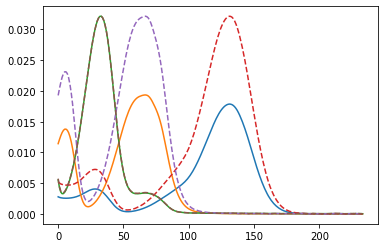

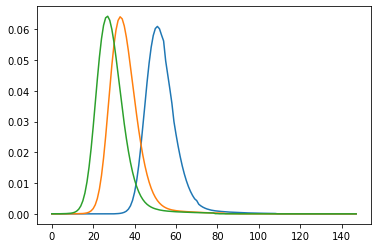

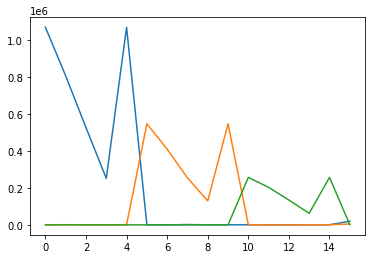

integral_array = [[1.06955569e+06 4.70506530e+02 1.83760367e+02]
 [8.05991739e+05 1.23890824e+03 3.33160342e+02]
 [5.26387957e+05 2.67354041e+02 2.67738755e+02]
 [2.51708134e+05 0.00000000e+00 4.89418038e+01]
 [1.06955569e+06 4.70506530e+02 1.83760367e+02]
 [6.22662937e+02 5.47069251e+05 2.65176053e+02]
 [8.46438111e+02 4.09824457e+05 0.00000000e+00]
 [2.99948835e+02 2.54755653e+05 2.17666225e+03]
 [6.67389343e+02 1.29838313e+05 4.87275953e+02]
 [6.22662937e+02 5.47069251e+05 2.65176053e+02]
 [7.08641088e+02 1.27420727e+03 2.57134668e+05]
 [6.43054480e+02 0.00000000e+00 2.03308702e+05]
 [6.35657299e+02 7.35232536e+01 1.34441401e+05]
 [6.49951365e+02 5.50073626e+02 6.27953781e+04]
 [7.08641088e+02 1.27420727e+03 2.57134668e+05]
 [2.00515180e+04 4.83596746e+03 1.63200677e+03]]
objective_val_non_comp = 16235.98618480558
objective_val_comp = 6526570.954391908
objective_total_sum = 6569326.432788697
impure_peak_sum = 26519.492211983812
----- new PARAFAC decomposition with iteration offset 2

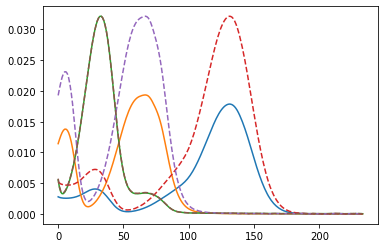

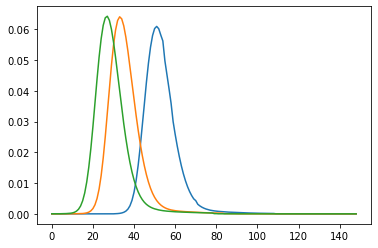

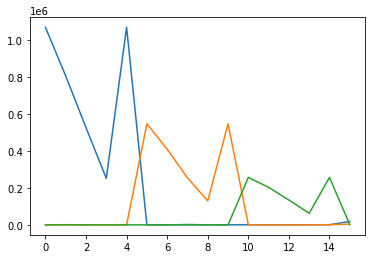

integral_array = [[1.06942915e+06 4.77733338e+02 1.83736376e+02]
 [8.05895849e+05 1.24406185e+03 3.33106690e+02]
 [5.26325118e+05 2.70582860e+02 2.67760597e+02]
 [2.51678315e+05 0.00000000e+00 4.93412274e+01]
 [1.06942915e+06 4.77733338e+02 1.83736376e+02]
 [6.27318549e+02 5.47021046e+05 2.68976558e+02]
 [8.49780888e+02 4.09789242e+05 0.00000000e+00]
 [3.02205990e+02 2.54733217e+05 2.17839089e+03]
 [6.68405743e+02 1.29826842e+05 4.88170507e+02]
 [6.27318549e+02 5.47021046e+05 2.68976558e+02]
 [7.11743387e+02 1.27464905e+03 2.57125438e+05]
 [6.45483898e+02 0.00000000e+00 2.03301505e+05]
 [6.37218506e+02 7.38133139e+01 1.34436579e+05]
 [6.50615442e+02 5.50153896e+02 6.27931313e+04]
 [7.11743387e+02 1.27464905e+03 2.57125438e+05]
 [1.88620420e+04 4.30846648e+03 1.49790821e+03]]
objective_val_non_comp = 16297.406827061852
objective_val_comp = 6525931.069176618
objective_total_sum = 6566896.892675553
impure_peak_sum = 24668.416671874846
----- new PARAFAC decomposition with iteration offset 

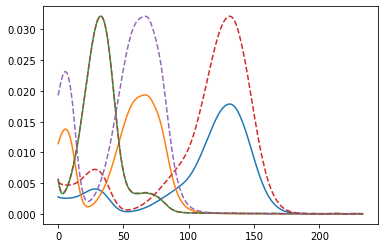

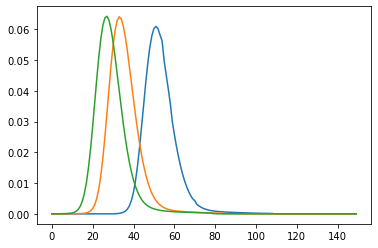

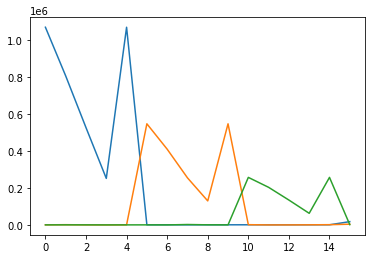

integral_array = [[1.06930848e+06 4.83901261e+02 1.83902732e+02]
 [8.05804490e+05 1.24846053e+03 3.33229133e+02]
 [5.26265259e+05 2.73342496e+02 2.67887139e+02]
 [2.51649871e+05 0.00000000e+00 4.97228000e+01]
 [1.06930848e+06 4.83901261e+02 1.83902732e+02]
 [6.30979008e+02 5.46982370e+05 2.71767820e+02]
 [8.52380431e+02 4.09760919e+05 0.00000000e+00]
 [3.03981064e+02 2.54715211e+05 2.17967953e+03]
 [6.69186703e+02 1.29817635e+05 4.88834431e+02]
 [6.30979008e+02 5.46982370e+05 2.71767820e+02]
 [7.14351922e+02 1.27495891e+03 2.57120779e+05]
 [6.47524865e+02 0.00000000e+00 2.03297894e+05]
 [6.38523255e+02 7.40207987e+01 1.34434149e+05]
 [6.51161085e+02 5.50210285e+02 6.27920013e+04]
 [7.14351922e+02 1.27495891e+03 2.57120779e+05]
 [1.77002920e+04 3.85403762e+03 1.39400781e+03]]
objective_val_non_comp = 16347.86784679483
objective_val_comp = 6525360.687373527
objective_total_sum = 6564656.892616632
impure_peak_sum = 22948.33739630967
----- new PARAFAC decomposition with iteration offset 29

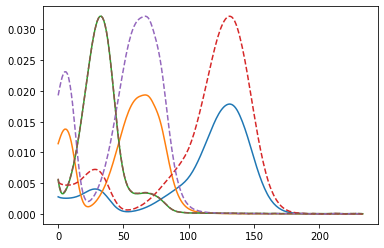

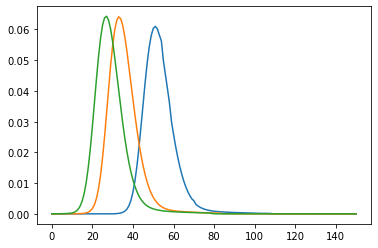

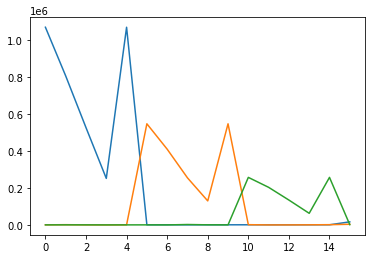

integral_array = [[1.06919316e+06 4.89148779e+02 1.84215851e+02]
 [8.05717249e+05 1.25220812e+03 3.33487549e+02]
 [5.26208100e+05 2.75697723e+02 2.68091625e+02]
 [2.51622680e+05 0.00000000e+00 5.00847731e+01]
 [1.06919316e+06 4.89148779e+02 1.84215851e+02]
 [6.33848618e+02 5.46952131e+05 2.73799153e+02]
 [8.54390557e+02 4.09738734e+05 0.00000000e+00]
 [3.05372078e+02 2.54701127e+05 2.18063701e+03]
 [6.69780404e+02 1.29810434e+05 4.89324471e+02]
 [6.33848618e+02 5.46952131e+05 2.73799153e+02]
 [7.16592500e+02 1.27518104e+03 2.57119580e+05]
 [6.49277388e+02 0.00000000e+00 2.03297000e+05]
 [6.39637088e+02 7.41713318e+01 1.34433527e+05]
 [6.51619224e+02 5.50252360e+02 6.27917167e+04]
 [7.16592500e+02 1.27518104e+03 2.57119580e+05]
 [1.65631140e+04 3.46489968e+03 1.31285681e+03]]
objective_val_non_comp = 16389.60358871118
objective_val_comp = 6524850.303863448
objective_total_sum = 6562580.7778903665
impure_peak_sum = 21340.870438206763
----- new PARAFAC decomposition with iteration offset 

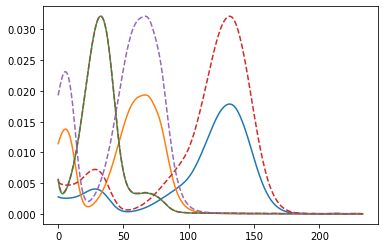

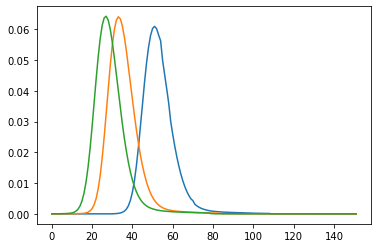

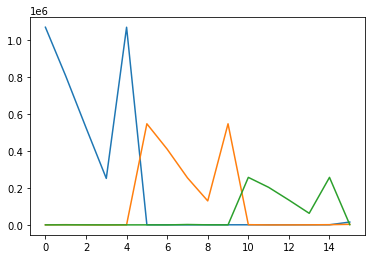

integral_array = [[1.06908297e+06 4.93597473e+02 1.84633835e+02]
 [8.05633959e+05 1.25539278e+03 3.33844124e+02]
 [5.26153530e+05 2.77703153e+02 2.68349042e+02]
 [2.51596689e+05 0.00000000e+00 5.04238254e+01]
 [1.06908297e+06 4.93597473e+02 1.84633835e+02]
 [6.36094749e+02 5.46929285e+05 2.75265888e+02]
 [8.55937853e+02 4.09721953e+05 0.00000000e+00]
 [3.06459658e+02 2.54690484e+05 2.18134790e+03]
 [6.70226649e+02 1.29804990e+05 4.89684878e+02]
 [6.36094749e+02 5.46929285e+05 2.75265888e+02]
 [7.18559800e+02 1.27534576e+03 2.57120928e+05]
 [6.50816568e+02 0.00000000e+00 2.03298106e+05]
 [6.40609513e+02 7.42828888e+01 1.34434236e+05]
 [6.52013383e+02 5.50286303e+02 6.27920541e+04]
 [7.18559800e+02 1.27534576e+03 2.57120928e+05]
 [1.54501581e+04 3.13343974e+03 1.24842771e+03]]
objective_val_non_comp = 16424.373527337862
objective_val_comp = 6524392.3702621395
objective_total_sum = 6560648.769334098
impure_peak_sum = 19832.02554462033
----- new PARAFAC decomposition with iteration offset 

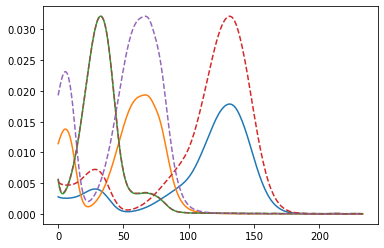

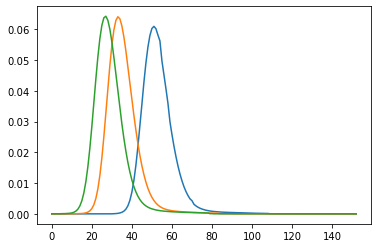

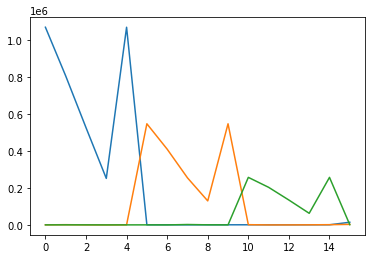

integral_array = [[1.06897815e+06 4.97350883e+02 1.85118007e+02]
 [8.05554770e+05 1.25808750e+03 3.34263110e+02]
 [5.26101645e+05 2.79403715e+02 2.68636041e+02]
 [2.51571957e+05 0.00000000e+00 5.07374925e+01]
 [1.06897815e+06 4.97350883e+02 1.85118007e+02]
 [6.37852319e+02 5.46912836e+05 2.76317672e+02]
 [8.57125276e+02 4.09709866e+05 0.00000000e+00]
 [3.07309350e+02 2.54682818e+05 2.18187673e+03]
 [6.70558213e+02 1.29801069e+05 4.89949560e+02]
 [6.37852319e+02 5.46912836e+05 2.76317672e+02]
 [7.20320409e+02 1.27547507e+03 2.57124090e+05]
 [6.52194879e+02 0.00000000e+00 2.03300639e+05]
 [6.41475762e+02 7.43687876e+01 1.34435894e+05]
 [6.52360475e+02 5.50316359e+02 6.27928348e+04]
 [7.20320409e+02 1.27547507e+03 2.57124090e+05]
 [1.43649363e+04 2.85226040e+03 1.19596074e+03]]
objective_val_non_comp = 16453.531967625728
objective_val_comp = 6523981.63899075
objective_total_sum = 6558848.328416982
impure_peak_sum = 18413.157458605696
----- new PARAFAC decomposition with iteration offset 3

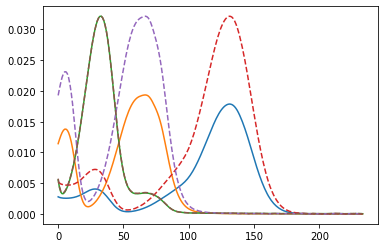

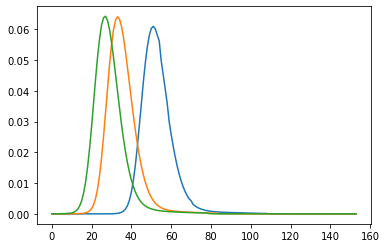

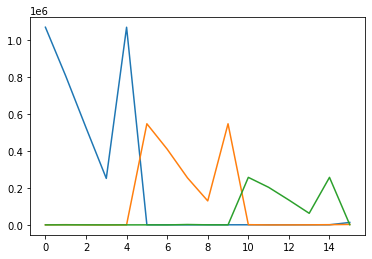

integral_array = [[1.06887912e+06 5.00500062e+02 1.85634900e+02]
 [8.05479987e+05 1.26035567e+03 3.34712437e+02]
 [5.26052643e+05 2.80838329e+02 2.68932038e+02]
 [2.51548584e+05 0.00000000e+00 5.10229157e+01]
 [1.06887912e+06 5.00500062e+02 1.85634900e+02]
 [6.39229040e+02 5.46901846e+05 2.77067252e+02]
 [8.58035554e+02 4.09701797e+05 0.00000000e+00]
 [3.07973696e+02 2.54677694e+05 2.18227199e+03]
 [6.70801530e+02 1.29798447e+05 4.90144002e+02]
 [6.39229040e+02 5.46901846e+05 2.77067252e+02]
 [7.21917442e+02 1.27558301e+03 2.57128504e+05]
 [6.53445945e+02 0.00000000e+00 2.03304156e+05]
 [6.42258861e+02 7.44379005e+01 1.34438207e+05]
 [6.52671643e+02 5.50344945e+02 6.27939212e+04]
 [7.21917442e+02 1.27558301e+03 2.57128504e+05]
 [1.33129541e+04 2.61426246e+03 1.15181819e+03]]
objective_val_non_comp = 16478.110880447282
objective_val_comp = 6523614.37122412
objective_total_sum = 6557171.516825724
impure_peak_sum = 17079.034721153934
----- new PARAFAC decomposition with iteration offset 3

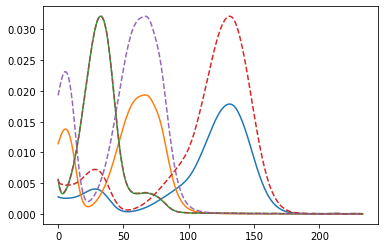

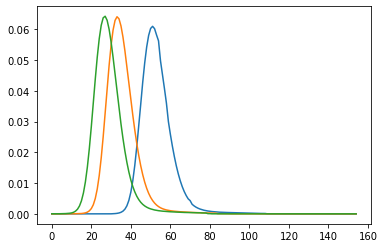

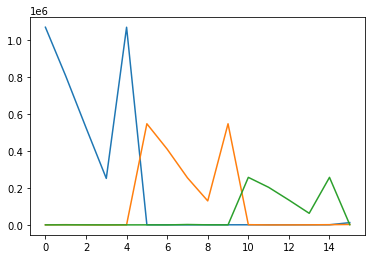

integral_array = [[1.06878631e+06 5.03126703e+02 1.86157237e+02]
 [8.05409922e+05 1.26225419e+03 3.35165065e+02]
 [5.26006729e+05 2.82041855e+02 2.69220216e+02]
 [2.51526675e+05 0.00000000e+00 5.12785396e+01]
 [1.06878631e+06 5.03126703e+02 1.86157237e+02]
 [6.40309634e+02 5.46895461e+05 2.77595090e+02]
 [8.58733927e+02 4.09697129e+05 0.00000000e+00]
 [3.08494221e+02 2.54674716e+05 2.18256831e+03]
 [6.70977746e+02 1.29796922e+05 4.90286464e+02]
 [6.40309634e+02 5.46895461e+05 2.77595090e+02]
 [7.23375579e+02 1.27567920e+03 2.57133761e+05]
 [6.54588811e+02 0.00000000e+00 2.03308335e+05]
 [6.42972141e+02 7.44964771e+01 1.34440961e+05]
 [6.52953405e+02 5.50373566e+02 6.27952131e+04]
 [7.23375579e+02 1.27567920e+03 2.57133761e+05]
 [1.22998807e+04 2.41288010e+03 1.11335565e+03]]
objective_val_non_comp = 16498.891829196633
objective_val_comp = 6523287.6675853245
objective_total_sum = 6555612.675837157
impure_peak_sum = 15826.116422635288
----- new PARAFAC decomposition with iteration offset

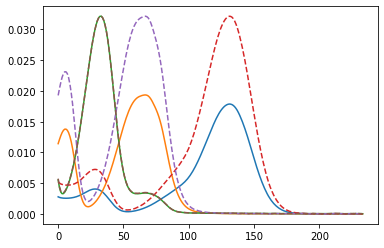

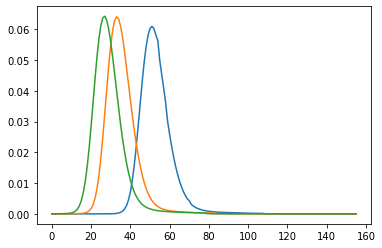

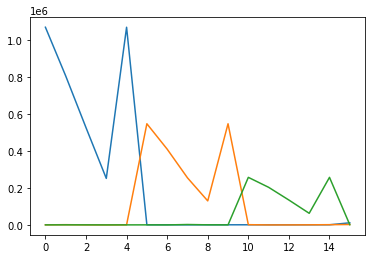

integral_array = [[1.06870009e+06 5.05304653e+02 1.86664191e+02]
 [8.05344830e+05 1.26383486e+03 3.35599805e+02]
 [5.25964071e+05 2.83046126e+02 2.69487997e+02]
 [2.51506315e+05 0.00000000e+00 5.15039594e+01]
 [1.06870009e+06 5.05304653e+02 1.86664191e+02]
 [6.41160670e+02 5.46892898e+05 2.77965093e+02]
 [8.59271504e+02 4.09695290e+05 0.00000000e+00]
 [3.08903655e+02 2.54673518e+05 2.18279365e+03]
 [6.71103600e+02 1.29796308e+05 4.90391580e+02]
 [6.41160670e+02 5.46892898e+05 2.77965093e+02]
 [7.24707312e+02 1.27576882e+03 2.57139575e+05]
 [6.55632872e+02 0.00000000e+00 2.03312952e+05]
 [6.43622442e+02 7.45482501e+01 1.34444005e+05]
 [6.53209285e+02 5.50402826e+02 6.27966408e+04]
 [7.24707312e+02 1.27576882e+03 2.57139575e+05]
 [1.13309059e+04 2.24205955e+03 1.07871872e+03]]
objective_val_non_comp = 16516.49388466432
objective_val_comp = 6522999.050712291
objective_total_sum = 6554167.228726544
impure_peak_sum = 14651.684129589925
----- new PARAFAC decomposition with iteration offset 3

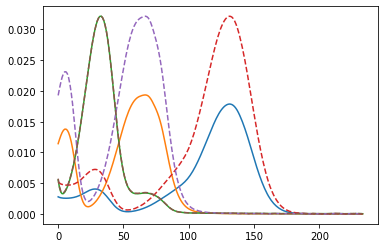

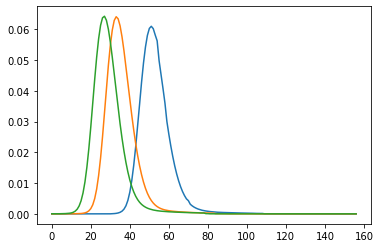

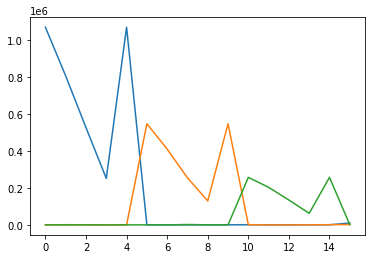

integral_array = [[1.06862076e+06 5.07099577e+02 1.87141116e+02]
 [8.05284943e+05 1.26514401e+03 3.36001099e+02]
 [5.25924821e+05 2.83879602e+02 2.69726753e+02]
 [2.51487580e+05 0.00000000e+00 5.16998198e+01]
 [1.06862076e+06 5.07099577e+02 1.87141116e+02]
 [6.41834003e+02 5.46893452e+05 2.78228841e+02]
 [8.59687866e+02 4.09695764e+05 0.00000000e+00]
 [3.09227375e+02 2.54673774e+05 2.18297099e+03]
 [6.71192300e+02 1.29796437e+05 4.90471396e+02]
 [6.41834003e+02 5.46893452e+05 2.78228841e+02]
 [7.25917551e+02 1.27585453e+03 2.57145763e+05]
 [6.56581720e+02 0.00000000e+00 2.03317863e+05]
 [6.44212581e+02 7.45954650e+01 1.34447246e+05]
 [6.53440816e+02 5.50432791e+02 6.27981595e+04]
 [7.25917551e+02 1.27585453e+03 2.57145763e+05]
 [1.04109653e+04 2.09634718e+03 1.04669794e+03]]
objective_val_non_comp = 16531.415812398824
objective_val_comp = 6522746.527840675
objective_total_sum = 6552831.95405972
impure_peak_sum = 13554.01040664741
----- new PARAFAC decomposition with iteration offset 36

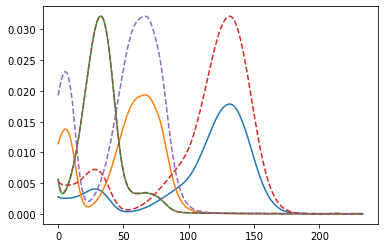

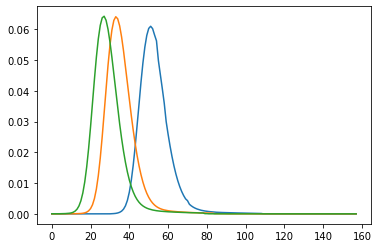

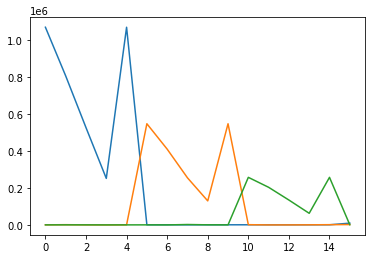

integral_array = [[1.06854848e+06 5.08570508e+02 1.87578596e+02]
 [8.05230378e+05 1.26622346e+03 3.36359430e+02]
 [5.25889055e+05 2.84567984e+02 2.69932064e+02]
 [2.51470516e+05 0.00000000e+00 5.18691263e+01]
 [1.06854848e+06 5.08570508e+02 1.87578596e+02]
 [6.42369426e+02 5.46896517e+05 2.78415627e+02]
 [8.60012969e+02 4.09698103e+05 0.00000000e+00]
 [3.09484706e+02 2.54675200e+05 2.18311355e+03]
 [6.71253895e+02 1.29797166e+05 4.90532836e+02]
 [6.42369426e+02 5.46896517e+05 2.78415627e+02]
 [7.27007943e+02 1.27593758e+03 2.57152222e+05]
 [6.57436489e+02 0.00000000e+00 2.03322986e+05]
 [6.44743595e+02 7.46393966e+01 1.34450629e+05]
 [6.53648609e+02 5.50463293e+02 6.27997440e+04]
 [7.27007943e+02 1.27593758e+03 2.57152222e+05]
 [9.54369091e+03 1.97093496e+03 1.01659522e+03]]
objective_val_non_comp = 16544.040748268213
objective_val_comp = 6522528.215753335
objective_total_sum = 6551603.477588979
impure_peak_sum = 12531.221087376724
----- new PARAFAC decomposition with iteration offset 

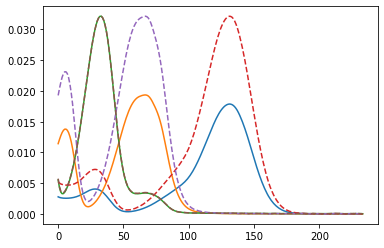

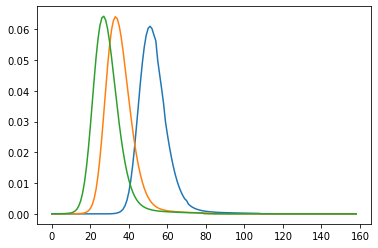

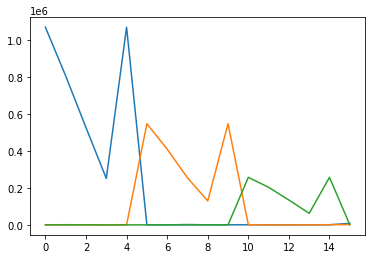

integral_array = [[1.06848333e+06 5.09769609e+02 1.87972245e+02]
 [8.05181182e+05 1.26711019e+03 3.36670478e+02]
 [5.25856807e+05 2.85134002e+02 2.70102875e+02]
 [2.51455122e+05 0.00000000e+00 5.20103269e+01]
 [1.06848333e+06 5.09769609e+02 1.87972245e+02]
 [6.42797076e+02 5.46901597e+05 2.78527584e+02]
 [8.60268786e+02 4.09701935e+05 0.00000000e+00]
 [3.09690157e+02 2.54677567e+05 2.18322091e+03]
 [6.71295820e+02 1.29798378e+05 4.90576203e+02]
 [6.42797076e+02 5.46901597e+05 2.78527584e+02]
 [7.27979991e+02 1.27606774e+03 2.57158842e+05]
 [6.58199164e+02 0.00000000e+00 2.03328244e+05]
 [6.45216417e+02 7.47064019e+01 1.34454096e+05]
 [6.53833150e+02 5.50506071e+02 6.28013677e+04]
 [7.27979991e+02 1.27606774e+03 2.57158842e+05]
 [8.73179920e+03 1.86167737e+03 9.88067983e+02]]
objective_val_non_comp = 16554.769442236928
objective_val_comp = 6522342.227244941
objective_total_sum = 6550478.541238818
impure_peak_sum = 11581.54455164146
----- new PARAFAC decomposition with iteration offset 3

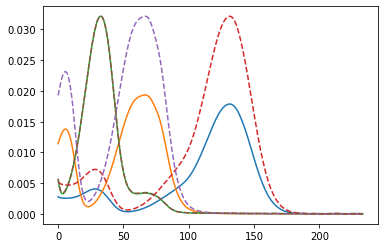

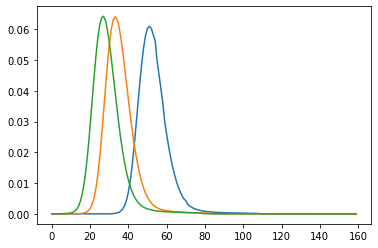

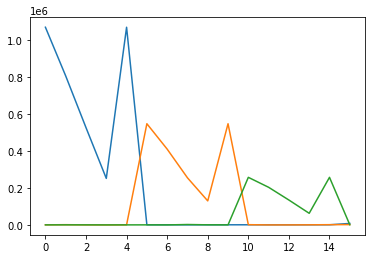

integral_array = [[1.06842521e+06 5.10743437e+02 1.88319937e+02]
 [8.05137293e+05 1.26783857e+03 3.36933121e+02]
 [5.25828036e+05 2.85597915e+02 2.70240672e+02]
 [2.51441390e+05 0.00000000e+00 5.21292350e+01]
 [1.06842521e+06 5.10743437e+02 1.88319937e+02]
 [6.43130281e+02 5.46908719e+05 2.78216313e+02]
 [8.60463070e+02 4.09707193e+05 0.00000000e+00]
 [3.09850217e+02 2.54680887e+05 2.18313043e+03]
 [6.71321419e+02 1.29800077e+05 4.90518849e+02]
 [6.43130281e+02 5.46908719e+05 2.78216313e+02]
 [7.28836657e+02 1.27625668e+03 2.57165597e+05]
 [6.58872293e+02 0.00000000e+00 2.03333619e+05]
 [6.45632656e+02 7.48005361e+01 1.34457636e+05]
 [6.53995145e+02 5.50563594e+02 6.28030245e+04]
 [7.28836657e+02 1.27625668e+03 2.57165597e+05]
 [7.97658278e+03 1.76516266e+03 9.61012996e+02]]
objective_val_non_comp = 16562.894326607173
objective_val_comp = 6522188.201250332
objective_total_sum = 6549453.854010136
impure_peak_sum = 10702.758433196454
----- new PARAFAC decomposition with iteration offset 

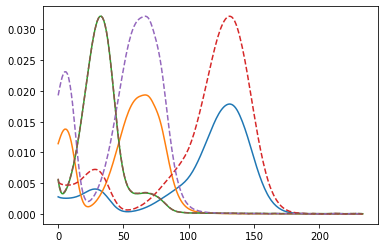

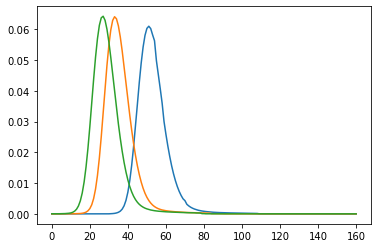

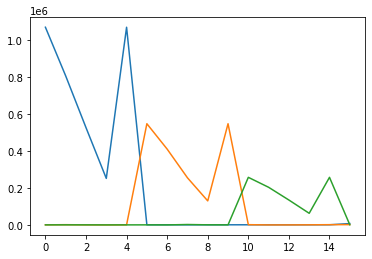

integral_array = [[1.06837402e+06 5.11530150e+02 1.88623450e+02]
 [8.05098638e+05 1.26843322e+03 3.37152021e+02]
 [5.25802694e+05 2.85976506e+02 2.70349304e+02]
 [2.51429301e+05 0.00000000e+00 5.22288105e+01]
 [1.06837402e+06 5.11530150e+02 1.88623450e+02]
 [6.43403542e+02 5.46916795e+05 2.78072278e+02]
 [8.60622348e+02 4.09713210e+05 0.00000000e+00]
 [3.09981220e+02 2.54684651e+05 2.18312160e+03]
 [6.71338984e+02 1.29802006e+05 4.90501738e+02]
 [6.43403542e+02 5.46916795e+05 2.78072278e+02]
 [7.29582596e+02 1.27637020e+03 2.57172690e+05]
 [6.59456995e+02 0.00000000e+00 2.03339246e+05]
 [6.45994609e+02 7.48557048e+01 1.34461353e+05]
 [6.54135640e+02 5.50602809e+02 6.28047639e+04]
 [7.29582596e+02 1.27637020e+03 2.57172690e+05]
 [7.27907482e+03 1.67849442e+03 9.35585770e+02]]
objective_val_non_comp = 16569.91595083513
objective_val_comp = 6522062.881037127
objective_total_sum = 6548525.951999913
impure_peak_sum = 9893.155011949897
----- new PARAFAC decomposition with iteration offset 40

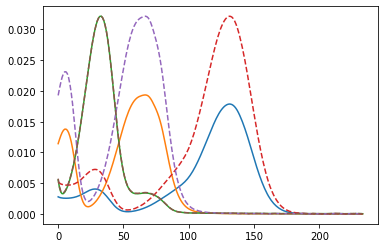

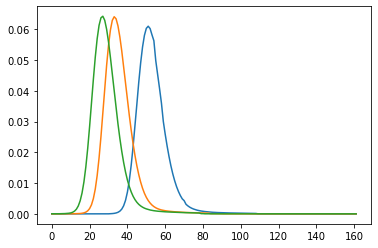

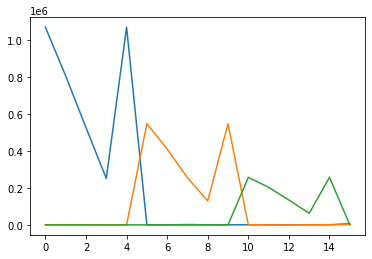

integral_array = [[1.06832942e+06 5.12164437e+02 1.88885324e+02]
 [8.05064951e+05 1.26891870e+03 3.37332654e+02]
 [5.25780608e+05 2.86285112e+02 2.70433521e+02]
 [2.51418769e+05 0.00000000e+00 5.23123273e+01]
 [1.06832942e+06 5.12164437e+02 1.88885324e+02]
 [6.43630486e+02 5.46925571e+05 2.78096914e+02]
 [8.60755349e+02 4.09719794e+05 0.00000000e+00]
 [3.10089624e+02 2.54688739e+05 2.18319409e+03]
 [6.71351473e+02 1.29804103e+05 4.90525164e+02]
 [6.43630486e+02 5.46925571e+05 2.78096914e+02]
 [7.30225144e+02 1.27645966e+03 2.57180086e+05]
 [6.59960060e+02 0.00000000e+00 2.03345107e+05]
 [6.46305961e+02 7.48988205e+01 1.34465228e+05]
 [6.54256205e+02 5.50636035e+02 6.28065778e+04]
 [7.30225144e+02 1.27645966e+03 2.57180086e+05]
 [6.63764043e+03 1.59955296e+03 9.11948631e+02]]
objective_val_non_comp = 16576.179036024325
objective_val_comp = 6521964.033097948
objective_total_sum = 6547689.354154654
impure_peak_sum = 9149.142020682128
----- new PARAFAC decomposition with iteration offset 4

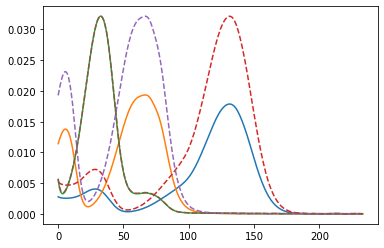

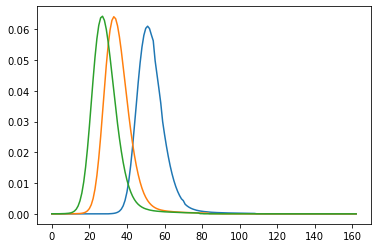

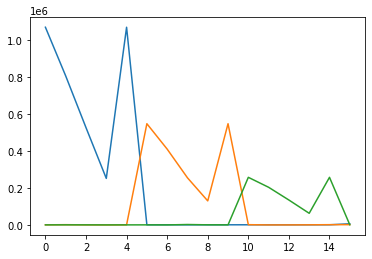

integral_array = [[1.06829122e+06 5.12674516e+02 1.89109101e+02]
 [8.05036101e+05 1.26931535e+03 3.37480064e+02]
 [5.25761692e+05 2.86536032e+02 2.70497851e+02]
 [2.51409754e+05 0.00000000e+00 5.23822755e+01]
 [1.06829122e+06 5.12674516e+02 1.89109101e+02]
 [6.43816668e+02 5.46935073e+05 2.78113533e+02]
 [8.60864538e+02 4.09726919e+05 0.00000000e+00]
 [3.10178244e+02 2.54693165e+05 2.18326607e+03]
 [6.71360093e+02 1.29806374e+05 4.90547298e+02]
 [6.43816668e+02 5.46935073e+05 2.78113533e+02]
 [7.30773494e+02 1.27651703e+03 2.57187822e+05]
 [6.60388687e+02 0.00000000e+00 2.03351230e+05]
 [6.46571445e+02 7.49245457e+01 1.34469280e+05]
 [6.54358957e+02 5.50661122e+02 6.28084752e+04]
 [7.30773494e+02 1.27651703e+03 2.57187822e+05]
 [6.05218773e+03 1.52672582e+03 8.90244203e+02]]
objective_val_non_comp = 16581.341254933206
objective_val_comp = 6521891.223099456
objective_total_sum = 6546941.722103423
impure_peak_sum = 8469.157749032864
----- new PARAFAC decomposition with iteration offset 4

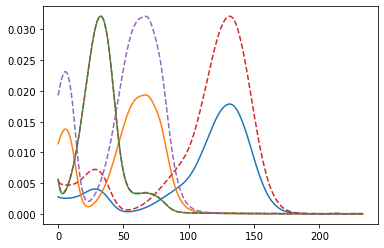

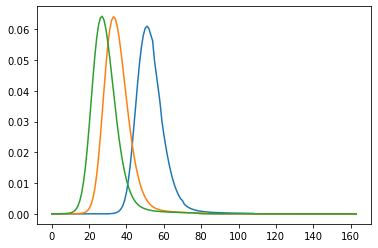

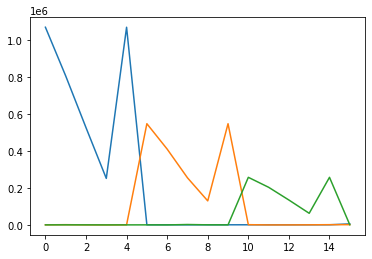

integral_array = [[1.06825897e+06 5.13084939e+02 1.89298939e+02]
 [8.05011741e+05 1.26964059e+03 3.37600480e+02]
 [5.25745720e+05 2.86740285e+02 2.70547009e+02]
 [2.51402148e+05 0.00000000e+00 5.24412552e+01]
 [1.06825897e+06 5.13084939e+02 1.89298939e+02]
 [6.43970023e+02 5.46945185e+05 2.78118201e+02]
 [8.60954657e+02 4.09734498e+05 0.00000000e+00]
 [3.10250950e+02 2.54697875e+05 2.18333524e+03]
 [6.71366376e+02 1.29808791e+05 4.90567263e+02]
 [6.43970023e+02 5.46945185e+05 2.78118201e+02]
 [7.31237792e+02 1.27656712e+03 2.57195883e+05]
 [6.60751384e+02 0.00000000e+00 2.03357609e+05]
 [6.46796142e+02 7.49457942e+01 1.34473503e+05]
 [6.54445988e+02 5.50684047e+02 6.28104528e+04]
 [7.31237792e+02 1.27656712e+03 2.57195883e+05]
 [5.51965654e+03 1.45898802e+03 8.70562711e+02]]
objective_val_non_comp = 16585.62148558967
objective_val_comp = 6521842.408282574
objective_total_sum = 6546277.2370375935
impure_peak_sum = 7849.207269428699
----- new PARAFAC decomposition with iteration offset 4

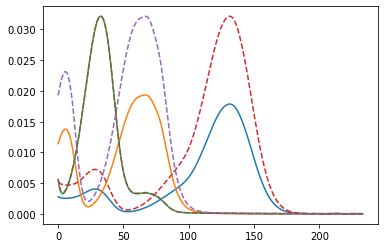

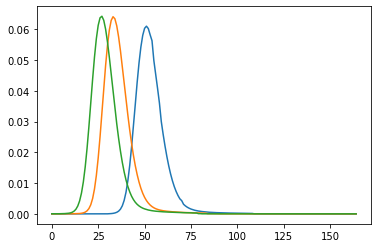

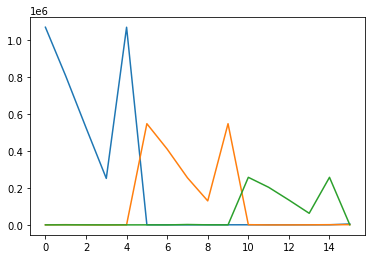

integral_array = [[1.06823233e+06 5.13415865e+02 1.89458743e+02]
 [8.04991628e+05 1.26990991e+03 3.37698147e+02]
 [5.25732533e+05 2.86906838e+02 2.70584588e+02]
 [2.51395873e+05 0.00000000e+00 5.24911099e+01]
 [1.06823233e+06 5.13415865e+02 1.89458743e+02]
 [6.44086999e+02 5.46956279e+05 2.77763543e+02]
 [8.61021167e+02 4.09742718e+05 0.00000000e+00]
 [3.10306314e+02 2.54703043e+05 2.18323753e+03]
 [6.71369238e+02 1.29811441e+05 4.90502329e+02]
 [6.44086999e+02 5.46956279e+05 2.77763543e+02]
 [7.31628805e+02 1.27668359e+03 2.57204163e+05]
 [6.61058068e+02 0.00000000e+00 2.03364173e+05]
 [6.46985653e+02 7.49987443e+01 1.34477841e+05]
 [6.54519693e+02 5.50722784e+02 6.28124844e+04]
 [7.31628805e+02 1.27668359e+03 2.57204163e+05]
 [5.03804804e+03 1.39579379e+03 8.52809994e+02]]
objective_val_non_comp = 16588.387213902854
objective_val_comp = 6521817.286065724
objective_total_sum = 6545692.325101165
impure_peak_sum = 7286.651821538646
----- new PARAFAC decomposition with iteration offset 4

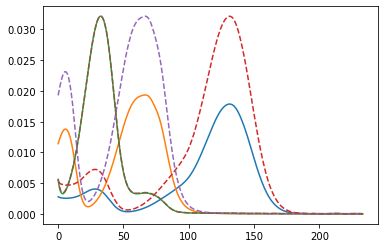

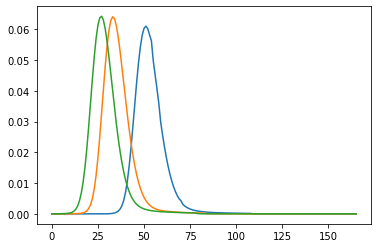

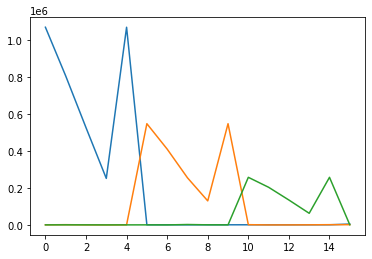

integral_array = [[1.06821089e+06 5.13682380e+02 1.89593569e+02]
 [8.04975433e+05 1.27013152e+03 3.37780015e+02]
 [5.25721916e+05 2.87042914e+02 2.70614424e+02]
 [2.51390826e+05 0.00000000e+00 5.25336695e+01]
 [1.06821089e+06 5.13682380e+02 1.89593569e+02]
 [6.44192110e+02 5.46967482e+05 2.77749447e+02]
 [8.61083828e+02 4.09751105e+05 0.00000000e+00]
 [3.10355981e+02 2.54708259e+05 2.18330223e+03]
 [6.71374066e+02 1.29814117e+05 4.90518986e+02]
 [6.44192110e+02 5.46967482e+05 2.77749447e+02]
 [7.31957152e+02 1.27674374e+03 2.57212769e+05]
 [6.61314894e+02 0.00000000e+00 2.03370984e+05]
 [6.47145204e+02 7.50238054e+01 1.34482348e+05]
 [6.54582337e+02 5.50747507e+02 6.28145963e+04]
 [7.31957152e+02 1.27674374e+03 2.57212769e+05]
 [4.60407944e+03 1.33714305e+03 8.36671243e+02]]
objective_val_non_comp = 16591.38817976295
objective_val_comp = 6521811.856816301
objective_total_sum = 6545181.138731584
impure_peak_sum = 6777.893735520085
----- new PARAFAC decomposition with iteration offset 45

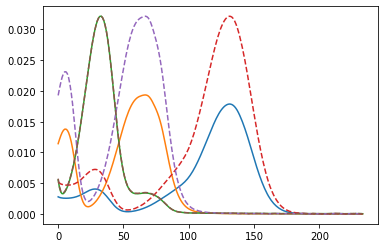

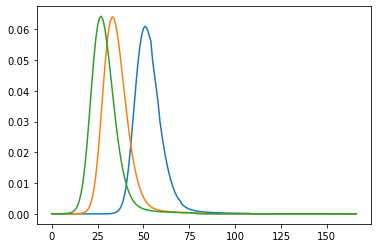

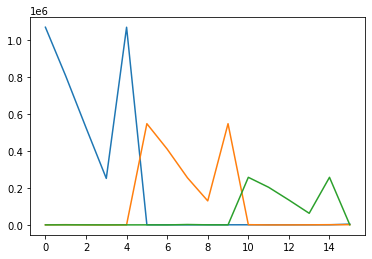

integral_array = [[1.06819398e+06 5.13899262e+02 1.89706476e+02]
 [8.04962674e+05 1.27031725e+03 3.37850026e+02]
 [5.25713553e+05 2.87155194e+02 2.70639604e+02]
 [2.51386855e+05 0.00000000e+00 5.25705647e+01]
 [1.06819398e+06 5.13899262e+02 1.89706476e+02]
 [6.44279661e+02 5.46979253e+05 2.77738132e+02]
 [8.61136663e+02 4.09759915e+05 0.00000000e+00]
 [3.10397399e+02 2.54713738e+05 2.18337045e+03]
 [6.71378929e+02 1.29816926e+05 4.90536803e+02]
 [6.44279661e+02 5.46979253e+05 2.77738132e+02]
 [7.32232886e+02 1.27677612e+03 2.57221602e+05]
 [6.61530291e+02 0.00000000e+00 2.03377969e+05]
 [6.47279742e+02 7.50336753e+01 1.34486973e+05]
 [6.54635856e+02 5.50765321e+02 6.28167643e+04]
 [7.32232886e+02 1.27677612e+03 2.57221602e+05]
 [4.21226959e+03 1.28328387e+03 8.21757310e+02]]
objective_val_non_comp = 16593.86285311917
objective_val_comp = 6521825.042268522
objective_total_sum = 6544736.215888673
impure_peak_sum = 6317.310767033258
----- new PARAFAC decomposition with iteration offset 46

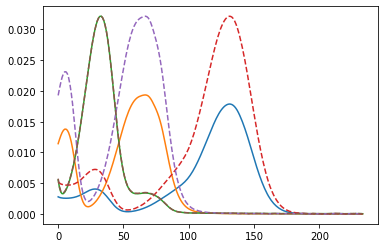

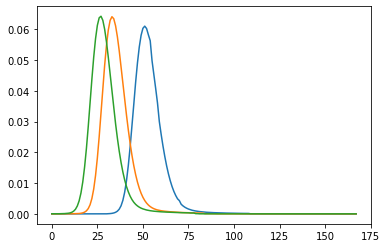

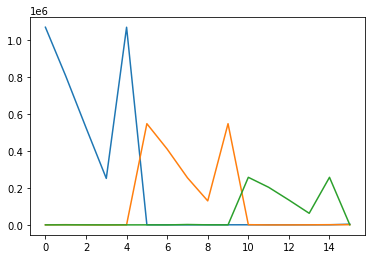

integral_array = [[1.06818210e+06 5.14073839e+02 1.89802162e+02]
 [8.04953695e+05 1.27047281e+03 3.37906594e+02]
 [5.25707667e+05 2.87247311e+02 2.70659029e+02]
 [2.51384069e+05 0.00000000e+00 5.26018653e+01]
 [1.06818210e+06 5.14073839e+02 1.89802162e+02]
 [6.44352715e+02 5.46991631e+05 2.77722932e+02]
 [8.61182065e+02 4.09769176e+05 0.00000000e+00]
 [3.10432294e+02 2.54719499e+05 2.18343766e+03]
 [6.71385053e+02 1.29819878e+05 4.90553913e+02]
 [6.44352715e+02 5.46991631e+05 2.77722932e+02]
 [7.32463425e+02 1.27680651e+03 2.57230548e+05]
 [6.61710695e+02 0.00000000e+00 2.03385044e+05]
 [6.47393473e+02 7.50417906e+01 1.34491656e+05]
 [6.54682426e+02 5.50782676e+02 6.28189604e+04]
 [7.32463425e+02 1.27680651e+03 2.57230548e+05]
 [3.86781717e+03 1.23445387e+03 8.07570341e+02]]
objective_val_non_comp = 16595.93282023548
objective_val_comp = 6521858.196721682
objective_total_sum = 6544363.970918307
impure_peak_sum = 5909.84137638882
----- new PARAFAC decomposition with iteration offset 47 

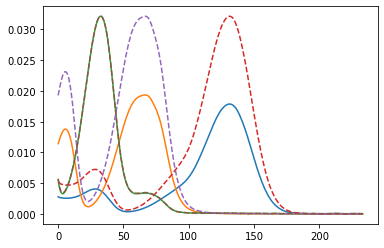

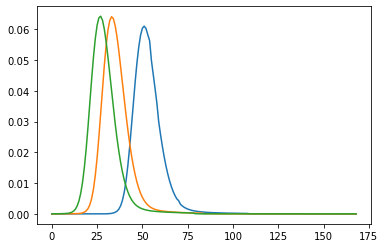

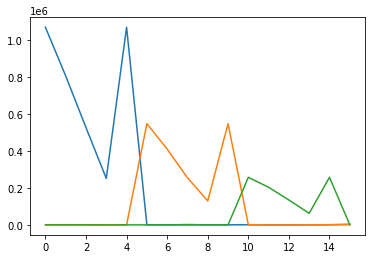

integral_array = [[1.06817429e+06 5.14217147e+02 1.89882678e+02]
 [8.04947794e+05 1.27060621e+03 3.37954771e+02]
 [5.25703802e+05 2.87324411e+02 2.70675902e+02]
 [2.51382245e+05 0.00000000e+00 5.26287674e+01]
 [1.06817429e+06 5.14217147e+02 1.89882678e+02]
 [6.44413794e+02 5.47004690e+05 2.77704475e+02]
 [8.61221209e+02 4.09778944e+05 0.00000000e+00]
 [3.10461835e+02 2.54725577e+05 2.18350321e+03]
 [6.71392144e+02 1.29822991e+05 4.90570212e+02]
 [6.44413794e+02 5.47004690e+05 2.77704475e+02]
 [7.32657226e+02 1.27683768e+03 2.57239505e+05]
 [6.61862713e+02 0.00000000e+00 2.03392127e+05]
 [6.47490305e+02 7.50496213e+01 1.34496345e+05]
 [6.54723364e+02 5.50800472e+02 6.28211595e+04]
 [7.32657226e+02 1.27683768e+03 2.57239505e+05]
 [3.56206099e+03 1.19120505e+03 7.93499311e+02]]
objective_val_non_comp = 16597.691146758225
objective_val_comp = 6521907.955453156
objective_total_sum = 6544052.411950292
impure_peak_sum = 5546.7653503776255
----- new PARAFAC decomposition with iteration offset 

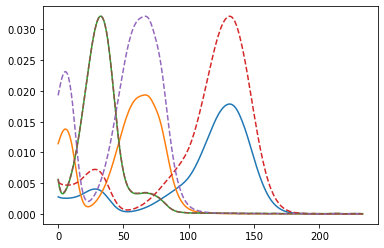

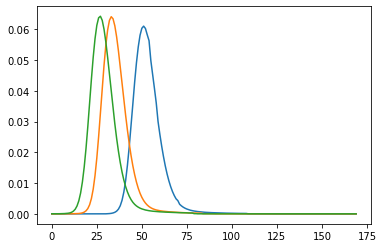

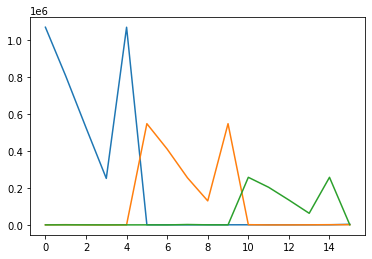

integral_array = [[1.06817017e+06 5.14336121e+02 1.89950633e+02]
 [8.04944674e+05 1.27072265e+03 3.37996143e+02]
 [5.25701759e+05 2.87389809e+02 2.70691124e+02]
 [2.51381289e+05 0.00000000e+00 5.26511088e+01]
 [1.06817017e+06 5.14336121e+02 1.89950633e+02]
 [6.44465289e+02 5.47018456e+05 2.77689893e+02]
 [8.61255622e+02 4.09789241e+05 0.00000000e+00]
 [3.10487211e+02 2.54731985e+05 2.18356974e+03]
 [6.71400427e+02 1.29826271e+05 4.90587268e+02]
 [6.44465289e+02 5.47018456e+05 2.77689893e+02]
 [7.32820575e+02 1.27687163e+03 2.57248393e+05]
 [6.61991320e+02 0.00000000e+00 2.03399157e+05]
 [6.47573332e+02 7.50582867e+01 1.34500997e+05]
 [6.54759859e+02 5.50819360e+02 6.28233418e+04]
 [7.32820575e+02 1.27687163e+03 2.57248393e+05]
 [3.29149192e+03 1.15380353e+03 7.79064647e+02]]
objective_val_non_comp = 16599.221536097033
objective_val_comp = 6521972.7483088365
objective_total_sum = 6543796.329940418
impure_peak_sum = 5224.36009548346
----- new PARAFAC decomposition with iteration offset 4

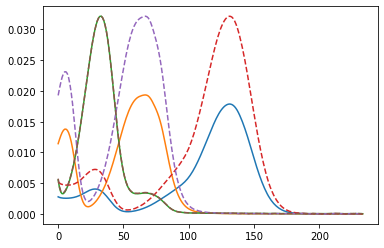

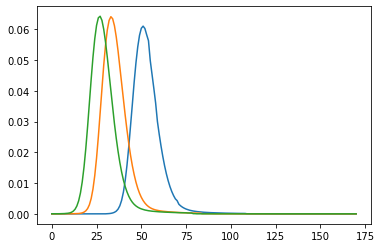

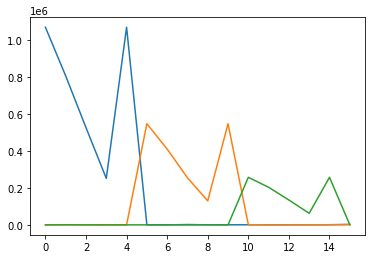

integral_array = [[1.06816941e+06 5.14436095e+02 1.90007934e+02]
 [8.04944092e+05 1.27082614e+03 3.38031751e+02]
 [5.25701381e+05 2.87446025e+02 2.70705201e+02]
 [2.51381129e+05 0.00000000e+00 5.26714015e+01]
 [1.06816941e+06 5.14436095e+02 1.90007934e+02]
 [6.44508984e+02 5.47032941e+05 2.77674186e+02]
 [8.61286362e+02 4.09800076e+05 0.00000000e+00]
 [3.10509307e+02 2.54738728e+05 2.18363452e+03]
 [6.71410036e+02 1.29829720e+05 4.90603836e+02]
 [6.44508984e+02 5.47032941e+05 2.77674186e+02]
 [7.32958639e+02 1.27691018e+03 2.57257160e+05]
 [6.62100588e+02 0.00000000e+00 2.03406091e+05]
 [6.47645085e+02 7.50687372e+01 1.34505586e+05]
 [6.54792901e+02 5.50839914e+02 6.28254945e+04]
 [7.32958639e+02 1.27691018e+03 2.57257160e+05]
 [3.05327249e+03 1.12227050e+03 7.63962627e+02]]
objective_val_non_comp = 16600.563840361727
objective_val_comp = 6522051.32455488
objective_total_sum = 6543591.394011265
impure_peak_sum = 4939.505616022558


In [140]:
show_parafac_analytics = True
non_comp_sums = []
comp_sums = []
total_integral_sums = []
impure_peak_sums = []
offsets = [i - 50 for i in list(range(100))]
for iter_offset in offsets:
    parafac_factors, boundaries, comp_tensor_shape, y_offset =\
        parafac(impure_peak, knoev_campaign.quali_comp_db, iter_offset, show_parafac_analytics)
    non_comp_sum = get_all_non_comp_sum(parafac_factors, comp_tensor_shape, show_parafac_analytics)
    non_comp_sums.append(non_comp_sum)

    comp_sum = get_all_comp_sum(parafac_factors, comp_tensor_shape, show_parafac_analytics)
    comp_sums.append(comp_sum)

    total_integral_sum = get_total_integral_sum(parafac_factors, show_parafac_analytics)
    total_integral_sums.append(total_integral_sum)
    
    impure_peak_sum = get_impure_integral_sum(parafac_factors, show_parafac_analytics)
    impure_peak_sums.append(impure_peak_sum)

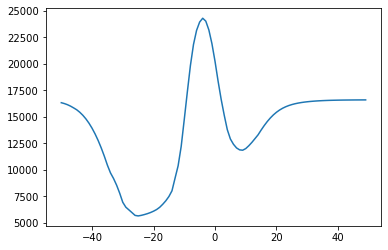

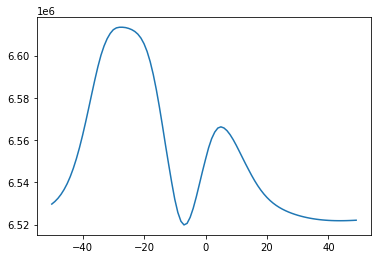

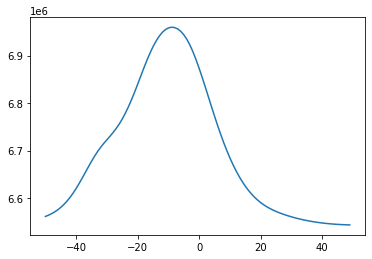

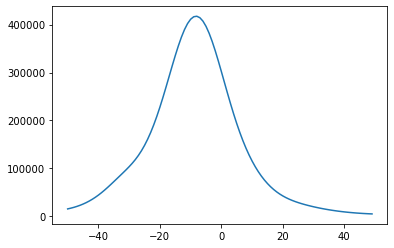

In [141]:
plt.plot(offsets, non_comp_sums)
plt.show()
plt.plot(offsets, comp_sums)
plt.show()
plt.plot(offsets, total_integral_sums)
plt.show()
plt.plot(offsets, impure_peak_sums)
plt.show()

In [97]:
from scipy import optimize

In [ ]:
def objective_function(offset):
    parafac_factors, boundaries, comp_tensor_shape, y_offset =\
        parafac(impure_peak, knoev_campaign.quali_comp_db, offset, show_parafac_analytics)
    impure_peak_sum = get_impure_integral_sum(parafac_factors, show_parafac_analytics)
    return -impure_peak_sum
    

In [90]:
parafac_factors[2][-1, :]

array([114770.31018277,  51295.70536387,  27329.22637611])

In [49]:
import os

def countlines(start, lines=0, header=True, begin_start=None):
    if header:
        print('{:>10} |{:>10} | {:<20}'.format('ADDED', 'TOTAL', 'FILE'))
        print('{:->11}|{:->11}|{:->20}'.format('', '', ''))

    for thing in os.listdir(start):
        thing = os.path.join(start, thing)
        if os.path.isfile(thing):
            if thing.endswith('.py'):
                with open(thing, 'r') as f:
                    newlines = f.readlines()
                    newlines = list(filter(lambda l : not l.startswith("#"), newlines))
                    newlines = list(filter(lambda l : l.replace(" ", "")  not in ['\n', '\r\n'], newlines))
                    newlines = len(newlines)
                    lines += newlines

                    if begin_start is not None:
                        reldir_of_thing = '.' + thing.replace(begin_start, '')
                    else:
                        reldir_of_thing = '.' + thing.replace(start, '')

                    print('{:>10} |{:>10} | {:<20}'.format(
                            newlines, lines, reldir_of_thing))


    for thing in os.listdir(start):
        thing = os.path.join(start, thing)
        if os.path.isdir(thing):
            lines = countlines(thing, lines, header=False, begin_start=start)

    return lines

In [50]:
countlines(r'/Users/haascp/Documents/GitHub/mocca/src/mocca')

     ADDED |     TOTAL | FILE                
-----------|-----------|--------------------
        14 |        14 | ./__init__.py       
        85 |        99 | ./visualization/parafac_plots.py
         0 |        99 | ./visualization/__init__.py
       111 |       210 | ./visualization/basic_plots.py
        12 |       222 | ./visualization/utils.py
        66 |       288 | ./visualization/results_plot.py
        79 |       367 | ./visualization/calibration_plots.py
       106 |       473 | ./dad_data/models.py
         0 |       473 | ./dad_data/__init__.py
        78 |       551 | ./dad_data/utils.py 
        64 |       615 | ./dad_data/process_gradientdata.py
       117 |       732 | ./dad_data/process_funcs.py
         0 |       732 | ./apis/__init__.py  
        51 |       783 | ./apis/chemstation_api.py
        47 |       830 | ./apis/labsolutions_api.py
       124 |       954 | ./chromatogram/correct.py
         0 |       954 | ./chromatogram/__init__.py
        58 |      1012

3852

In [38]:
import numpy as np
a = np.ndarray([[[1,2,3,4,5], [2,2,3,4,5], [3,2,3,4,5]], [[4,2,3,4,5], [5,2,3,4,5], [6,2,3,4,5]]])
a[:, 2]

TypeError: 'list' object cannot be interpreted as an integer

In [19]:
template_peak = campaign.chroms[0].peaks[1]

In [20]:
peak = CorrectedPeak(left=template_peak.left,
                         right=template_peak.right,
                         maximum=template_peak.maximum,
                         dataset=template_peak.dataset,
                         idx=template_peak.idx,
                         saturation=template_peak.saturation,
                         pure=template_peak.pure,
                         integral=template_peak.integral,
                         offset=template_peak.offset,
                         istd=template_peak.istd)

In [21]:
peak

CorrectedPeak(left=737, right=780, maximum=751, dataset=CompoundData(hplc_system_tag='labsolutions', experiment=Experiment(path='/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_4.txt', compound=None, istd=[InternalStandard(key='tetralin', conc=0.06094)], gradient=False, processed=True), path='/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_4.txt', data=array([[0.60540834, 0.60062571, 0.56764307, ..., 0.11308614, 0.10714952,
        0.0958129 ],
       [0.53313182, 0.5290444 , 0.49815698, ..., 0.13909139, 0.13275872,
        0.12262604],
       [0.46866425, 0.46518778, 0.43811131, ..., 0.16722611, 0.15765711,
        0.14848811],
       ...,
       [0.00985935, 0.00982639, 0.00819342, ..., 0.00556906, 0.00459204,
        0.00421501],
       [0.00773878, 0.00772346, 0.00750815, ..., 0.00479489, 0.00421391,
        0.00543293],
       [0.        , 0.     

In [19]:
def overlap(peak, component):
        return component.left <= peak.left <= component.right \
            or peak.left <= component.left <= peak.right

In [20]:
for comp in campaign.quali_comp_db:
    print(comp.compound_id, comp.left, comp.right)
    print(overlap(peak, comp))

tetralin 1394 1459
False
2-chlorotuluene 1283 1326
True
o-tolunitrile 994 1091
False


In [22]:
parafac_peaks = get_parafac_peaks(peak, campaign.quali_comp_db, show_parafac_analytics = True)

In [39]:
import numpy as np
from mocca.peak.utils import get_peak_data

In [40]:
left = parafac_peaks[0].left
right = parafac_peaks[0].right

In [42]:
np.max(get_peak_data(parafac_peaks[0]))

57.22552730058658

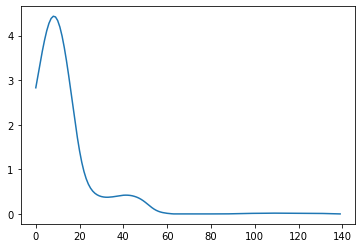

In [52]:
plt.plot(get_peak_data(parafac_peaks[0])[:, 50])

In [23]:
peak.idx

2

In [24]:
parafac_peaks[0].idx

-2

In [231]:
parafac_tensor = (test[0], test[1], test[2])

[autoreload of mocca.peak.resolve_impure failed: Traceback (most recent call last):
  File "/Users/haascp/opt/anaconda3/envs/mocca-dev/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/Users/haascp/opt/anaconda3/envs/mocca-dev/lib/python3.9/site-packages/IPython/extensions/autoreload.py", line 394, in superreload
    module = reload(module)
  File "/Users/haascp/opt/anaconda3/envs/mocca-dev/lib/python3.9/imp.py", line 314, in reload
    return importlib.reload(module)
  File "/Users/haascp/opt/anaconda3/envs/mocca-dev/lib/python3.9/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 613, in _exec
  File "<frozen importlib._bootstrap_external>", line 846, in exec_module
  File "<frozen importlib._bootstrap_external>", line 983, in get_code
  File "<frozen importlib._bootstrap_external>", line 913, in source_to_code
  File "<frozen 

In [233]:
parafac_comp_tensors = []
for i in range(2):
    parafac_comp_tensor = (parafac_tensor[0][:, i],
                           parafac_tensor[1][:, i],
                           parafac_tensor[2][:, i])
    parafac_comp_tensors.append(parafac_comp_tensor)

In [248]:
parafac_comp_tensors[0][0].size

140

In [80]:
for peak in campaign.chroms[0].peaks:
    display(peak.maximum)
    display(peak.compound_id)
    display(peak.integral)
    display(peak.concentration)

376

'unknown_1'

206550.8402845089

None

751

'unknown_2'

16187.308089379052

None

1007

None

108227.6753674092

None

1294

'2-chlorotuluene'

15995.194547856316

0.03258938909374124

1351

'unknown_3'

310478.6081232501

None

1406

'tetralin'

45524.56221006884

0.030565292181505214

In [35]:
for chrom in campaign.compound_chroms:
    display(chrom.dataset.path)
    for peak in chrom.peaks:
        display(peak.compound_id)
        display(peak.integral)
        #display(peak.concentration)
        display(peak.istd)

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_96.txt'

'2-chlorotuluene'

10618.060848096951

[]

'tetralin'

90765.2642286953

[]

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_88.txt'

'2-chlorotuluene'

29082.561621718694

[IstdPeak(maximum=1407, integral=37415.788129257555, offset=1, compound_id='tetralin', concentration=0.06094)]

'tetralin'

37415.788129257555

[IstdPeak(maximum=1407, integral=37415.788129257555, offset=1, compound_id='tetralin', concentration=0.06094)]

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_89.txt'

'2-chlorotuluene'

22403.533720771888

[IstdPeak(maximum=1406, integral=40018.91508806365, offset=0, compound_id='tetralin', concentration=0.06094)]

'tetralin'

40018.91508806365

[IstdPeak(maximum=1406, integral=40018.91508806365, offset=0, compound_id='tetralin', concentration=0.06094)]

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_92.txt'

'o-tolunitrile'

203579.565272476

[IstdPeak(maximum=1406, integral=39027.10437635546, offset=0, compound_id='tetralin', concentration=0.06094)]

'tetralin'

39027.10437635546

[IstdPeak(maximum=1406, integral=39027.10437635546, offset=0, compound_id='tetralin', concentration=0.06094)]

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_93.txt'

'o-tolunitrile'

123388.0305363853

[IstdPeak(maximum=1408, integral=32509.528803783243, offset=2, compound_id='tetralin', concentration=0.06094)]

'tetralin'

32509.528803783243

[IstdPeak(maximum=1408, integral=32509.528803783243, offset=2, compound_id='tetralin', concentration=0.06094)]

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_94.txt'

'o-tolunitrile'

101291.93802706029

[IstdPeak(maximum=1405, integral=39231.976970444244, offset=-1, compound_id='tetralin', concentration=0.06094)]

'tetralin'

39231.976970444244

[IstdPeak(maximum=1405, integral=39231.976970444244, offset=-1, compound_id='tetralin', concentration=0.06094)]

In [177]:
for comp in campaign.quali_comp_db.items:
    display(comp.compound_id)
    display(comp.maximum)
    display(len(comp.created_from))


'tetralin'

1406

7

'2-chlorotuluene'

1295

3

'o-tolunitrile'

1007

3

In [48]:
for comp in campaign.quant_comp_db.items:
    display(comp.compound_id)
    display(comp.calib_factors)
    display(comp.calib_data)
    display(comp.calib_scores)
    display(len(comp.created_from))

'tetralin'

{'absolute': 1489420.15472096}

{'absolute': [(0.06094, 90765.2642286953)]}

{'absolute': nan}

1

'2-chlorotuluene'

{'absolute': 490809.8921967266, 'tetralin': 0.7806230737067894}

{'absolute': [(0.0603, 29082.561621718694), (0.04422, 22403.533720771888)],
 'tetralin': [(0.0603, 0.04736747223137285), (0.04422, 0.03411565110996862)]}

{'absolute': 0.9662250880730451, 'tetralin': 0.9971485738520937}

2

'o-tolunitrile'

{'absolute': 3237864.687574665, 'tetralin': 5.318045099264461}

{'absolute': [(0.05955, 203579.565272476),
  (0.04367, 123388.0305363853),
  (0.029775, 101291.93802706029)],
 'tetralin': [(0.05955, 0.3178851955827124),
  (0.04367, 0.23129423456953574),
  (0.029775, 0.15733927219674235)]}

{'absolute': 0.9199017630682809, 'tetralin': 0.9997418952808681}

3

In [65]:
for chrom in campaign.bad_chroms:
    display(chrom.dataset.path)

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_90.txt'

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_91.txt'

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_95.txt'

In [25]:
test = ((1, 2), (2, 4), (3, 6), (4, 8))

In [26]:
for i in zip(*test):
    print(i)

(1, 2, 3, 4)
(2, 4, 6, 8)


In [27]:
reaction_folders[81]

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_85.txt'

In [22]:
stats = campaign.quant_comp_db.items[2].calib_scores
max(stats, key=lambda key: stats[key])

'tetralin'

In [24]:
"a" is 'a'

<>:1: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:1: SyntaxWarning: "is" with a literal. Did you mean "=="?
/var/folders/c_/gt8zcwrn18s1dhd756dg2srw0000gn/T/ipykernel_1926/4094855256.py:1: SyntaxWarning: "is" with a literal. Did you mean "=="?
  "a" is 'a'


True

In [64]:
reaction_folders[0]

'/Users/haascp/Documents/PostDoc/MIT/MIC-DROP/cora/cyanation/wellplate_data/full plate combined data/09072021_sample_4.txt'

In [24]:
class Vehicle:
    pass

class Truck(Vehicle):
    pass

In [26]:
isinstance(Truck(), Vehicle)    # returns True

True

In [ ]:
 # check if it gets better in positive direction
    if impure_sum_new > impure_sum_cur:
        iter_max = relative_distance_thresh * len(impure_peak.dataset.time)\
            - impure_peak.offset
        # find local minimum
        while (non_comp_sum_new < non_comp_sum_cur and
               comp_sum_new > comp_sum_cur and iter_offset_new < iter_max):
            non_comp_sum_cur = non_comp_sum_new
            comp_sum_cur = comp_sum_new
            parafac_factors_cur = parafac_factors_new
            boundaries_cur = boundaries_new
            iter_offset_cur = iter_offset_new
            iter_offset_new += 1
            parafac_factors_new, boundaries_new, *_ = parafac(impure_peak,
                                                              quali_comp_db,
                                                              iter_offset_new,
                                                              show_parafac_analytics)
            non_comp_sum_new = get_all_non_comp_sum(parafac_factors_new,
                                                    comp_tensor_shape,
                                                    show_parafac_analytics)
            comp_sum_new = get_all_comp_sum(parafac_factors_new,
                                            comp_tensor_shape,
                                            show_parafac_analytics)
    
    # if positive was wrong direction, let's go negative
    else:
        iter_offset_new = iter_offset_cur - 1
        parafac_factors_new, boundaries_new, *_ = parafac(impure_peak,
                                                         quali_comp_db,
                                                         iter_offset_new,
                                                         show_parafac_analytics)
        non_comp_sum_new = get_all_non_comp_sum(parafac_factors_new,
                                                comp_tensor_shape,
                                                show_parafac_analytics)
        comp_sum_new = get_all_comp_sum(parafac_factors_new,
                                        comp_tensor_shape,
                                        show_parafac_analytics)
        
        # check if it gets better in negative direction
        if non_comp_sum_new < non_comp_sum_cur and comp_sum_new > comp_sum_cur:
            iter_min = -int(math.floor(0.05 * parafac_factors_new[1].shape[0])) + iter_offset_cur
            # find local minimum
            while (non_comp_sum_new < non_comp_sum_cur and
                   comp_sum_new > comp_sum_cur and iter_offset_new > iter_min):
                non_comp_sum_cur = non_comp_sum_new
                comp_sum_cur = comp_sum_new
                parafac_factors_cur = parafac_factors_new
                boundaries_cur = boundaries_new
                iter_offset_cur = iter_offset_new
                iter_offset_new -= 1
                
                parafac_factors_new, boundaries_new, *_ = parafac(impure_peak,
                                                                 quali_comp_db,
                                                                 iter_offset_new,
                                                                 show_parafac_analytics)
                non_comp_sum_new = get_all_non_comp_sum(parafac_factors_new,
                                                        comp_tensor_shape,
                                                        show_parafac_analytics)
                comp_sum_new = get_all_comp_sum(parafac_factors_new,
                                                comp_tensor_shape,
                                                show_parafac_analytics)
        
        # if negative also does not give progress, start point is minimum
    return parafac_factors_cur, boundaries_cur, iter_offset_cur, y_offset
